# Import Libraries

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score

# Load Dataset

In [2]:
dataset=pd.read_csv("I:\Masters in Jagannath University\Thesis\Datasets/diabetes.csv")

In [3]:
dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72.0,35,0,33.6,0.627,50.0,1
1,1,85,66.0,29,0,26.6,0.351,31.0,0
2,8,183,64.0,0,0,23.3,0.672,32.0,1
3,1,89,66.0,23,94,28.1,0.167,21.0,0
4,0,137,40.0,35,168,43.1,2.288,33.0,1
...,...,...,...,...,...,...,...,...,...
769,2,122,70.0,27,0,36.8,0.340,27.0,0
770,5,121,72.0,23,112,26.2,0.245,NaN,0
771,1,126,60.0,0,0,NaN,0.349,47.0,1
772,1,93,NaN,31,0,30.4,0.315,23.0,0


In [4]:
dataset.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72.0,35,0,33.6,0.627,50.0,1
1,1,85,66.0,29,0,26.6,0.351,31.0,0
2,8,183,64.0,0,0,23.3,0.672,32.0,1
3,1,89,66.0,23,94,28.1,0.167,21.0,0
4,0,137,40.0,35,168,43.1,2.288,33.0,1


# Visulalize the Dataset Properties

# a. Display Full Dataset: 
                pd.set_option('display.max_columns', None)
				pd.set_option('display.max_Rows', None)

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_Rows', None)
dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72.0,35,0,33.6,0.627,50.0,1
1,1,85,66.0,29,0,26.6,0.351,31.0,0
2,8,183,64.0,0,0,23.3,0.672,32.0,1
3,1,89,66.0,23,94,28.1,0.167,21.0,0
4,0,137,40.0,35,168,43.1,2.288,33.0,1
5,5,116,74.0,0,0,25.6,0.201,30.0,0
6,3,78,50.0,32,88,31.0,0.248,26.0,1
7,10,115,0.0,0,0,35.3,0.134,29.0,0
8,2,197,70.0,45,543,30.5,0.158,53.0,1
9,8,125,96.0,0,0,0.0,0.232,54.0,1


# b. View Total Number of Rows and Columns
			DataFrameName.shape

In [6]:
rows , col =  dataset.shape
print(f"Number of Rows : {rows} \nNumber of Columns : {col}")

Number of Rows : 774 
Number of Columns : 9


# c. View All Columns Name
           DataFrameName.columns

In [7]:
dataset.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

# d. View Data Types
		  DataFrameName.dtypes

In [8]:
dataset.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure               float64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                         float64
Outcome                       int64
dtype: object

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 774 entries, 0 to 773
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               774 non-null    int64  
 1   Glucose                   774 non-null    int64  
 2   BloodPressure             772 non-null    float64
 3   SkinThickness             774 non-null    int64  
 4   Insulin                   774 non-null    int64  
 5   BMI                       773 non-null    float64
 6   DiabetesPedigreeFunction  774 non-null    float64
 7   Age                       773 non-null    float64
 8   Outcome                   774 non-null    int64  
dtypes: float64(4), int64(5)
memory usage: 54.6 KB


# Dataset Preprocessing

#        a. Check Duplicates Rows
            -> Extract Duplicate Rows
                DataFrameName.loc[DataFrameNamedf.duplicated(), :])
			->Remove Duplicate Rows
				NewDataFrameName=DataFrameName.drop_duplicates(keep='first'

In [10]:
dataset.loc[dataset.duplicated(), :]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
768,10,101,76.0,48,180,32.9,0.171,63.0,0
769,2,122,70.0,27,0,36.8,0.340,27.0,0
773,1,93,NaN,31,0,30.4,0.315,23.0,0


In [11]:
dataset_RD=dataset.drop_duplicates(keep='first')
rows , col =  dataset_RD.shape
print(f"Number of Rows : {rows} \nNumber of Columns : {col}")


Number of Rows : 771 
Number of Columns : 9


In [12]:
dataset_RD

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72.0,35,0,33.6,0.627,50.0,1
1,1,85,66.0,29,0,26.6,0.351,31.0,0
2,8,183,64.0,0,0,23.3,0.672,32.0,1
3,1,89,66.0,23,94,28.1,0.167,21.0,0
4,0,137,40.0,35,168,43.1,2.288,33.0,1
5,5,116,74.0,0,0,25.6,0.201,30.0,0
6,3,78,50.0,32,88,31.0,0.248,26.0,1
7,10,115,0.0,0,0,35.3,0.134,29.0,0
8,2,197,70.0,45,543,30.5,0.158,53.0,1
9,8,125,96.0,0,0,0.0,0.232,54.0,1


# b. Extract Null Columns

        ->Check Null Columns
            DataFrameName.isnull().any()
        -> Find Out Total Number of Null Cell in Each Column
            DataFrameName.isnull().sum()



In [13]:
dataset_RD.isnull().any()

Pregnancies                 False
Glucose                     False
BloodPressure                True
SkinThickness               False
Insulin                     False
BMI                          True
DiabetesPedigreeFunction    False
Age                          True
Outcome                     False
dtype: bool

In [14]:
#dataset_RD.isnull().sum()

null_columns=dataset_RD.columns[dataset_RD.isnull().any()]
dataset_RD.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               1
SkinThickness               0
Insulin                     0
BMI                         1
DiabetesPedigreeFunction    0
Age                         1
Outcome                     0
dtype: int64

# Replacing zero values with NaN

In [15]:
dataset_NaN = dataset_RD
dataset_NaN[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","Age"]] = dataset_NaN[["Glucose", "BloodPressure", 
"SkinThickness", "Insulin", "BMI","Age"]].replace(0, np.NaN) 

C:\Users\User\AppData\Local\Temp\ipykernel_12920\1514650118.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_NaN[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","Age"]] = dataset_NaN[["Glucose", "BloodPressure",


In [16]:
dataset_NaN

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50.0,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31.0,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32.0,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1
5,5,116.0,74.0,NaN,NaN,25.6,0.201,30.0,0
6,3,78.0,50.0,32.0,88.0,31.0,0.248,26.0,1
7,10,115.0,NaN,NaN,NaN,35.3,0.134,29.0,0
8,2,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1
9,8,125.0,96.0,NaN,NaN,NaN,0.232,54.0,1


#       c. Extract Null Rows That Contains Null Cell
				DataFrameName[DataFrameName.isnull().any(axis=1)]

In [17]:
dataset_NaN[dataset_NaN.isnull().any(axis=1)]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50.0,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31.0,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32.0,1
5,5,116.0,74.0,NaN,NaN,25.6,0.201,30.0,0
7,10,115.0,NaN,NaN,NaN,35.3,0.134,29.0,0
9,8,125.0,96.0,NaN,NaN,NaN,0.232,54.0,1
10,4,110.0,92.0,NaN,NaN,37.6,0.191,30.0,0
11,10,168.0,74.0,NaN,NaN,38.0,0.537,34.0,1
12,10,139.0,80.0,NaN,NaN,27.1,1.441,57.0,0
15,7,100.0,NaN,NaN,NaN,30.0,0.484,32.0,1


In [18]:
dataset_NaN.shape

(771, 9)

In [19]:
dataset_NaN[dataset_NaN.isnull().any(axis=1)][null_columns]

,BloodPressure,BMI,Age
0,72.0,33.6,50.0
1,66.0,26.6,31.0
2,64.0,23.3,32.0
5,74.0,25.6,30.0
7,NaN,35.3,29.0
9,96.0,NaN,54.0
10,92.0,37.6,30.0
11,74.0,38.0,34.0
12,80.0,27.1,57.0
15,NaN,30.0,32.0


# Count of NaN


In [20]:
dataset_NaN.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                36
SkinThickness               228
Insulin                     376
BMI                          12
DiabetesPedigreeFunction      0
Age                           1
Outcome                       0
dtype: int64

#  	d. Fill The NaN Value Using Mean Value
				DataFrameName['ColumnName']=DataFrameName['ColumnName'].replace(np.NaN, 
                DataFrameNamedf['ColumnName'].mean())
			    Or. Remove That Rows
                        DataFrameName.dropna(inplace=True)

In [21]:
# Replacing NaN with mean values
dataset_NaN["Glucose"].fillna(dataset_NaN["Glucose"].mean(), inplace = True)
dataset_NaN["BloodPressure"].fillna(dataset_NaN["BloodPressure"].mean(), inplace = True)
dataset_NaN["SkinThickness"].fillna(dataset_NaN["SkinThickness"].mean(), inplace = True)
dataset_NaN["Insulin"].fillna(dataset_NaN["Insulin"].mean(), inplace = True)
dataset_NaN["BMI"].fillna(dataset_NaN["BMI"].mean(), inplace = True)
dataset_NaN["Age"].fillna(dataset_NaN["Age"].mean(), inplace = True)

C:\Users\User\AppData\Local\Temp\ipykernel_12920\2878182786.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_NaN["Glucose"].fillna(dataset_NaN["Glucose"].mean(), inplace = True)
C:\Users\User\AppData\Local\Temp\ipykernel_12920\2878182786.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_NaN["BloodPressure"].fillna(dataset_NaN["BloodPressure"].mean(), inplace = True)
C:\Users\User\AppData\Local\Temp\ipykernel_12920\2878182786.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [22]:
dataset_NaN

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000000,72.000000,35.000000,155.437975,33.600000,0.627,50.000000,1
1,1,85.000000,66.000000,29.000000,155.437975,26.600000,0.351,31.000000,0
2,8,183.000000,64.000000,29.145488,155.437975,23.300000,0.672,32.000000,1
3,1,89.000000,66.000000,23.000000,94.000000,28.100000,0.167,21.000000,0
4,0,137.000000,40.000000,35.000000,168.000000,43.100000,2.288,33.000000,1
5,5,116.000000,74.000000,29.145488,155.437975,25.600000,0.201,30.000000,0
6,3,78.000000,50.000000,32.000000,88.000000,31.000000,0.248,26.000000,1
7,10,115.000000,72.387755,29.145488,155.437975,35.300000,0.134,29.000000,0
8,2,197.000000,70.000000,45.000000,543.000000,30.500000,0.158,53.000000,1
9,8,125.000000,96.000000,29.145488,155.437975,32.446509,0.232,54.000000,1


In [23]:
dataset_NaN.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_NoNan.csv")

In [24]:
dataset_New=dataset_NaN

In [25]:
dataset_New

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000000,72.000000,35.000000,155.437975,33.600000,0.627,50.000000,1
1,1,85.000000,66.000000,29.000000,155.437975,26.600000,0.351,31.000000,0
2,8,183.000000,64.000000,29.145488,155.437975,23.300000,0.672,32.000000,1
3,1,89.000000,66.000000,23.000000,94.000000,28.100000,0.167,21.000000,0
4,0,137.000000,40.000000,35.000000,168.000000,43.100000,2.288,33.000000,1
5,5,116.000000,74.000000,29.145488,155.437975,25.600000,0.201,30.000000,0
6,3,78.000000,50.000000,32.000000,88.000000,31.000000,0.248,26.000000,1
7,10,115.000000,72.387755,29.145488,155.437975,35.300000,0.134,29.000000,0
8,2,197.000000,70.000000,45.000000,543.000000,30.500000,0.158,53.000000,1
9,8,125.000000,96.000000,29.145488,155.437975,32.446509,0.232,54.000000,1


# e. Label Encoding

dataset_New['label'].unique()
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
dataset_New['label_en']=label_encoder.fit_transform(dataset_New['label'])
dataset_New

In [26]:
dataset_New['Outcome'].value_counts()

Outcome
0    502
1    269
Name: count, dtype: int64

In [27]:
sorted(dataset_New['Outcome'].unique().astype(str))

['0', '1']

<Axes: xlabel='Outcome', ylabel='count'>

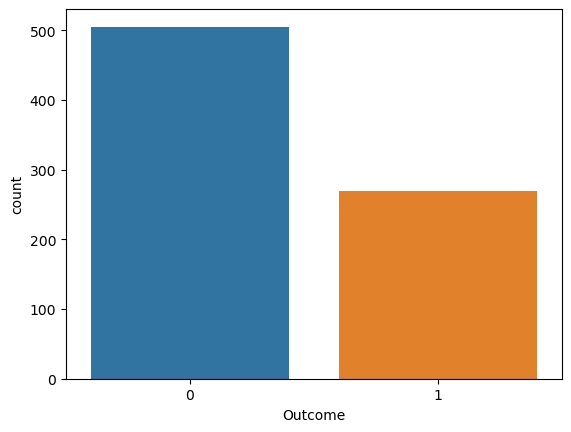

In [28]:
sns.countplot(x = 'Outcome',data = dataset)

# f. Data Scaling

In [29]:
from sklearn import preprocessing

columns_to_scale = ['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']
scaler = preprocessing.MinMaxScaler()
dataset_New[columns_to_scale] = scaler.fit_transform(dataset_New[columns_to_scale])
dataset_New

C:\Users\User\AppData\Local\Temp\ipykernel_12920\1915565780.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_New[columns_to_scale] = scaler.fit_transform(dataset_New[columns_to_scale])


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
2,0.470588,0.896774,0.408163,0.240712,0.169998,0.104294,0.253629,0.183333,1
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
4,0.000000,0.600000,0.163265,0.304348,0.185096,0.509202,0.943638,0.200000,1
5,0.294118,0.464516,0.510204,0.240712,0.169998,0.151329,0.052519,0.150000,0
6,0.176471,0.219355,0.265306,0.271739,0.088942,0.261759,0.072588,0.083333,1
7,0.588235,0.458065,0.493753,0.240712,0.169998,0.349693,0.023911,0.133333,0
8,0.117647,0.987097,0.469388,0.413043,0.635817,0.251534,0.034159,0.533333,1
9,0.470588,0.522581,0.734694,0.240712,0.169998,0.291340,0.065756,0.550000,1


In [30]:
dataset_New.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Scal.csv")

In [31]:
dataset_New

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
2,0.470588,0.896774,0.408163,0.240712,0.169998,0.104294,0.253629,0.183333,1
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
4,0.000000,0.600000,0.163265,0.304348,0.185096,0.509202,0.943638,0.200000,1
5,0.294118,0.464516,0.510204,0.240712,0.169998,0.151329,0.052519,0.150000,0
6,0.176471,0.219355,0.265306,0.271739,0.088942,0.261759,0.072588,0.083333,1
7,0.588235,0.458065,0.493753,0.240712,0.169998,0.349693,0.023911,0.133333,0
8,0.117647,0.987097,0.469388,0.413043,0.635817,0.251534,0.034159,0.533333,1
9,0.470588,0.522581,0.734694,0.240712,0.169998,0.291340,0.065756,0.550000,1


In [32]:
dataset_New.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

# g. Handling Outliers 

# 1. Using Inter Quartile Range (IQR)

In [33]:
numeric_columns = ['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI', 'DiabetesPedigreeFunction','Age',]

for column_name in numeric_columns:
    Q1 = np.percentile(dataset_New[column_name], 25, interpolation='midpoint')
    Q3 = np.percentile(dataset_New[column_name], 75, interpolation='midpoint')

    IQR = Q3 - Q1
    low_lim = Q1 - 1.5 * IQR
    up_lim = Q3 + 1.5 * IQR

    # Find outliers in the specified column
    outliers = dataset_New[(dataset_New[column_name] < low_lim) | (dataset_New[column_name] > up_lim)][column_name]

    # Replace outliers with the respective lower or upper limit
    dataset_New[column_name] = np.where(dataset_New[column_name] < low_lim, low_lim, dataset_New[column_name])
    dataset_New[column_name] = np.where(dataset_New[column_name] > up_lim, up_lim, dataset_New[column_name])

C:\Users\User\AppData\Local\Temp\ipykernel_12920\2774904081.py:4: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q1 = np.percentile(dataset_New[column_name], 25, interpolation='midpoint')
C:\Users\User\AppData\Local\Temp\ipykernel_12920\2774904081.py:5: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q3 = np.percentile(dataset_New[column_name], 75, interpolation='midpoint')
C:\Users\User\AppData\Local\Temp\ipykernel_12920\2774904081.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

In [34]:
dataset_New.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
2,0.470588,0.896774,0.408163,0.240712,0.169998,0.104294,0.253629,0.183333,1
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
4,0.000000,0.600000,0.163265,0.304348,0.185096,0.509202,0.477583,0.200000,1


# 2. Using Density-Based Spatial Clustering of Applications with Noise (DBSCAN) 

In [35]:
import pandas as pd
from sklearn.cluster import DBSCAN
import numpy as np

def detect_outliers_dbscan(data, eps, min_samples):
    # Initialize DBSCAN model
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    
    # Fit DBSCAN to the data and get cluster labels
    cluster_labels = dbscan.fit_predict(data)
    
    # Get indices of outlier points (cluster label -1)
    outlier_indices = np.where(cluster_labels == -1)[0]
    
    # Get indices of non-outlier points
    non_outlier_indices = np.where(cluster_labels != -1)[0]
    
    # Get outlier and non-outlier data
    outlier_data = data.iloc[outlier_indices]
    non_outlier_data = data.iloc[non_outlier_indices]
    
    # Count outlier and non-outlier data points
    num_outliers = len(outlier_indices)
    num_non_outliers = len(non_outlier_indices)
    
    # Return outlier and non-outlier data along with counts
    return outlier_data, non_outlier_data, num_outliers, num_non_outliers

# Example usage
# Assuming 'data' is your pandas DataFrame containing the dataset
# Adjust 'eps' and 'min_samples' parameters according to your dataset
eps = 0.2  # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = 3  # The number of samples (or total weight) in a neighborhood for a point to be considered as a core point

outlier_data, non_outlier_data, num_outliers, num_non_outliers = detect_outliers_dbscan(dataset_New, eps, min_samples)

# Load your dataset into a Pandas DataFrame
non_outlier_data.to_csv('I:\Masters in Jagannath University\Thesis\Datasets/dataset_dbscan.csv', index=False)
print("Number of Outliers:", num_outliers)
print("Number of Non-Outliers:", num_non_outliers)


Number of Outliers: 216
Number of Non-Outliers: 555


In [36]:
outlier_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
2,0.470588,0.896774,0.408163,0.240712,0.169998,0.104294,0.253629,0.183333,1
4,0.000000,0.600000,0.163265,0.304348,0.185096,0.509202,0.477583,0.200000,1
6,0.176471,0.219355,0.265306,0.271739,0.088942,0.261759,0.072588,0.083333,1
8,0.117647,0.987097,0.469388,0.385870,0.232085,0.251534,0.034159,0.533333,1
9,0.470588,0.522581,0.734694,0.240712,0.169998,0.291340,0.065756,0.550000,1


In [37]:
non_outlier_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
5,0.294118,0.464516,0.510204,0.240712,0.169998,0.151329,0.052519,0.150000,0
7,0.588235,0.458065,0.493753,0.240712,0.169998,0.349693,0.023911,0.133333,0


In [38]:
non_outlier_data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [39]:
#Print non Outliers
df_Non_Outlier=non_outlier_data
df_Non_Outlier.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
5,0.294118,0.464516,0.510204,0.240712,0.169998,0.151329,0.052519,0.150000,0
7,0.588235,0.458065,0.493753,0.240712,0.169998,0.349693,0.023911,0.133333,0


In [40]:
df_Non_Outlier.shape

(555, 9)

In [41]:
df_Non_Outlier.shape

(555, 9)

from sklearn.cluster import DBSCAN
train = pd.read_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Scal.csv")
def DB_outliers(dataset_New):
    outlier_detection = DBSCAN(eps = 2, metric='euclidean', min_samples = 5)
    clusters = outlier_detection.fit_predict(dataset_New.values.reshape(-1,1))
    data = pd.DataFrame()
    data['cluster'] = clusters
    print(data['cluster'].value_counts().sort_values(ascending=False))
DB_outliers(train['Outcome']) 

In [42]:
df_Non_Outlier.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,555.0,0.192475,0.172423,0.000000,0.058824,0.117647,0.294118,0.764706
Glucose,555.0,0.461978,0.171221,0.077419,0.338710,0.438710,0.548387,1.000000
BloodPressure,555.0,0.479677,0.105072,0.163265,0.408163,0.489796,0.551020,0.816327
SkinThickness,555.0,0.230747,0.079363,0.081522,0.184783,0.240712,0.260870,0.385870
Insulin,555.0,0.150896,0.047794,0.066518,0.114183,0.169998,0.169998,0.232085
BMI,555.0,0.274179,0.126422,0.000000,0.185072,0.274029,0.352761,0.652863
DiabetesPedigreeFunction,555.0,0.136389,0.100825,0.000000,0.066823,0.108454,0.187660,0.477583
Age,555.0,0.151659,0.159767,0.000000,0.033333,0.100000,0.233333,0.758333
Outcome,555.0,0.257658,0.437739,0.000000,0.000000,0.000000,1.000000,1.000000


In [43]:
df_Non_Outlier.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final.csv")

In [44]:
dataset_Final=df_Non_Outlier

# Data visualization

# Diabetes and non Diabetes Data

In [45]:
dataset_Final['Outcome'].value_counts()

Outcome
0    412
1    143
Name: count, dtype: int64

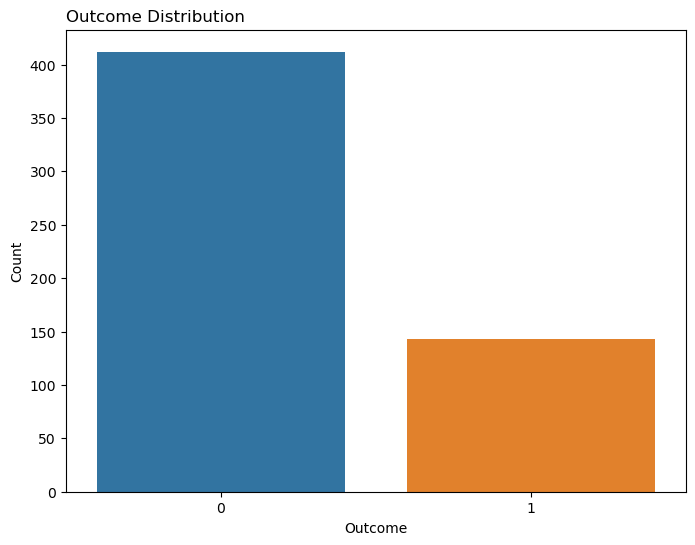

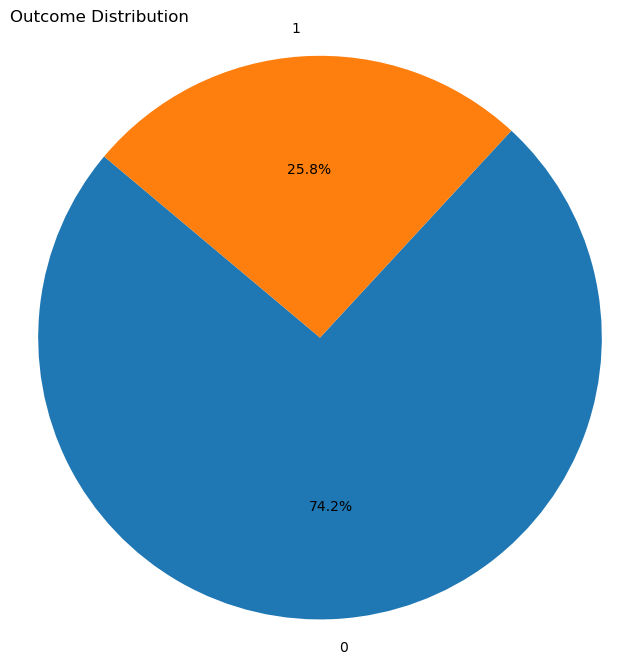

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming dataset_Final contains your dataset and 'Outcome' is a column in it

# Replace 1 with 'Diabetic' and 0 with 'Non-diabetic' in the 'Outcome' column
# dataset_Final['Outcome'] = dataset_Final['Outcome'].replace({1: 'Diabetic', 0: 'Non-diabetic'})

# Create countplot using Seaborn
plt.figure(figsize=(8, 6))
sns.countplot(x='Outcome', data=dataset_Final)
plt.title('Outcome Distribution', loc='left')  # Move the title to the left
plt.xlabel('Outcome')
plt.ylabel('Count')



# Create a pie chart from the same data
plt.figure(figsize=(8, 8))
outcome_counts = dataset_Final['Outcome'].value_counts()
plt.pie(outcome_counts, labels=outcome_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Outcome Distribution', loc='left')  # Move the title to the left
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show plots
plt.show()




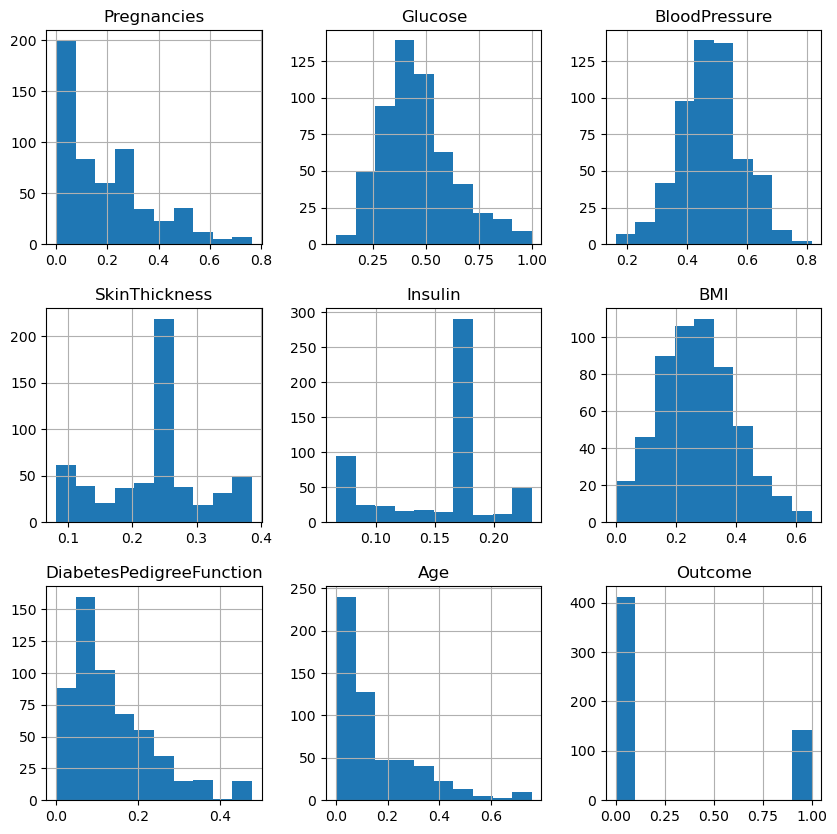

In [47]:
dataset_Final.hist(figsize = (10,10))
plt.show()

# Boxplot

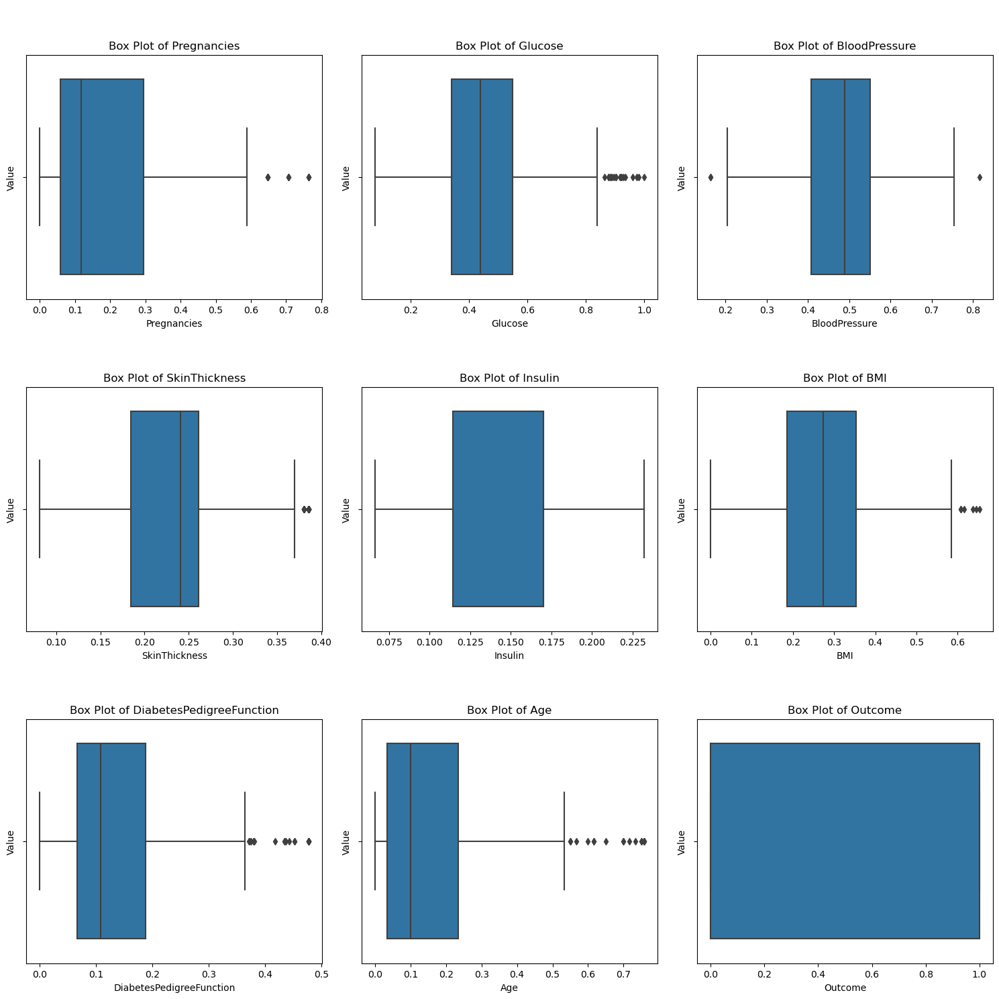

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming dataset_Final contains your dataset

# Get the numerical column names
numerical_columns = dataset_Final.select_dtypes(include=['float', 'int']).columns

# Calculate number of rows and columns for the grid
num_rows, num_cols = 3, 3
num_plots = num_rows * num_cols

# Create box plots for each numerical column arranged in a grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
for i, column in enumerate(numerical_columns[:num_plots]):
    row = i // num_cols
    col = i % num_cols
    sns.boxplot(x=column, data=dataset_Final, ax=axes[row][col])
    axes[row][col].set_title(f'\n\n\nBox Plot of {column}')
    axes[row][col].set_xlabel(column)
    axes[row][col].set_ylabel('Value')

# Adjust layout
plt.tight_layout()
plt.show()


# Pairplot of attributes

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


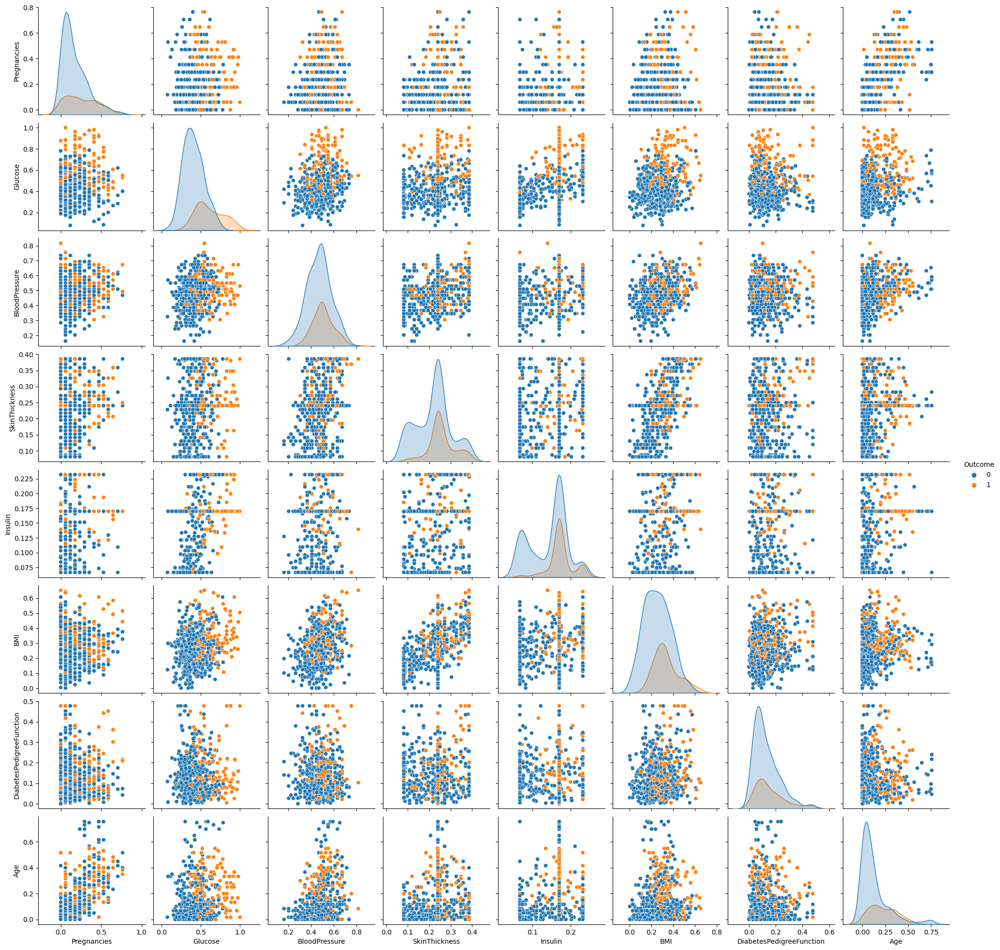

In [49]:
# Pairplot 
sns.pairplot(data = dataset_Final, hue = 'Outcome')
plt.show()

# Features and Outcome Correlation

# Pregnancies and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


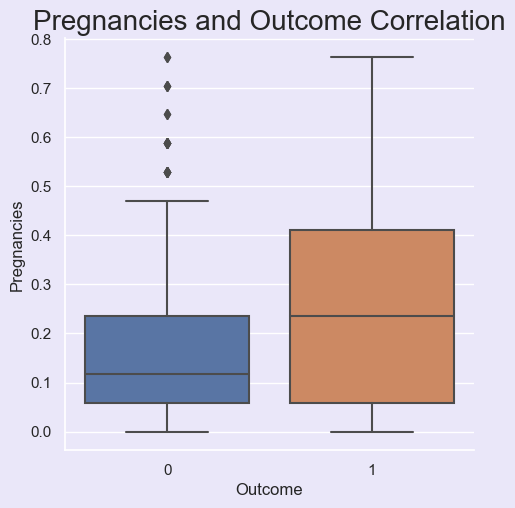

In [50]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="Pregnancies", data=dataset_Final, kind='box')
plt.title("Pregnancies and Outcome Correlation", size=20, y=1.0);

# Glucose and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


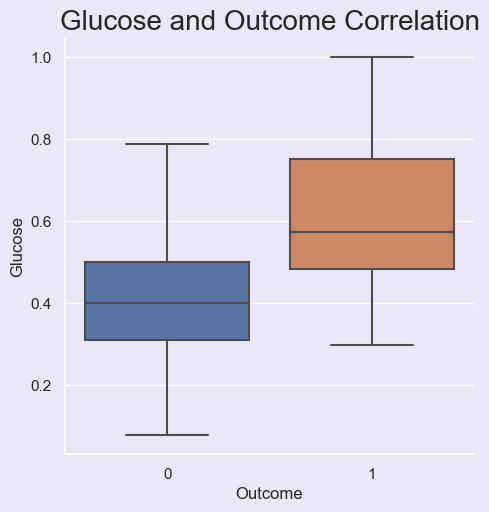

In [51]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="Glucose", data=dataset_Final, kind='box')
plt.title("Glucose and Outcome Correlation", size=20, y=1.0);

# BloodPressure and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


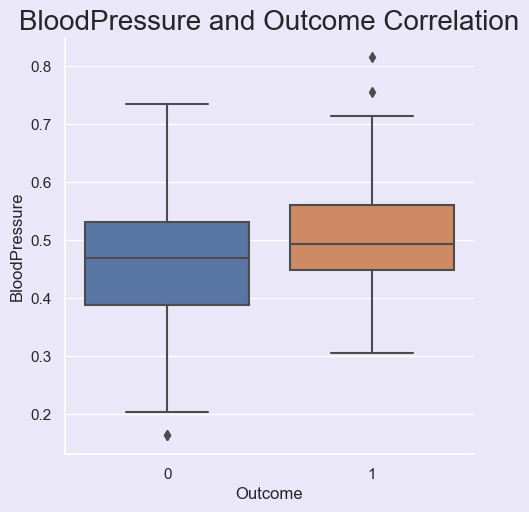

In [52]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="BloodPressure", data=dataset_Final, kind='box')
plt.title("BloodPressure and Outcome Correlation", size=20, y=1.0);

# SkinThickness and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


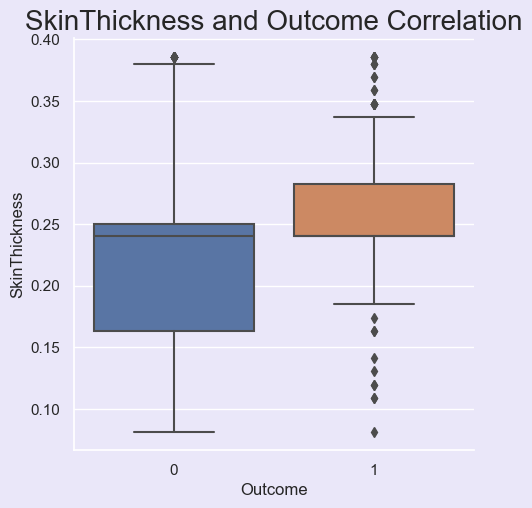

In [53]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="SkinThickness", data=dataset_Final, kind='box')
plt.title("SkinThickness and Outcome Correlation", size=20, y=1.0);

# Insulin and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


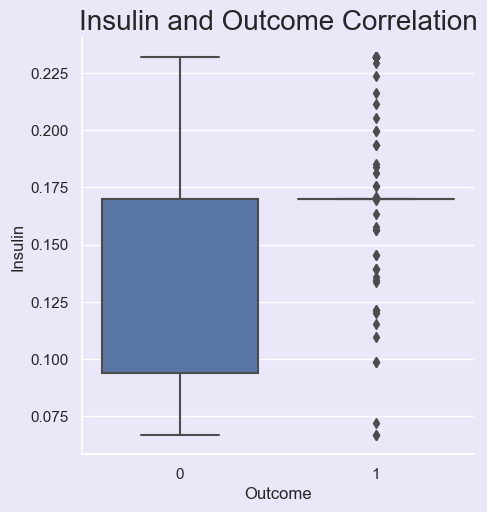

In [54]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="Insulin", data=dataset_Final, kind='box')
plt.title("Insulin and Outcome Correlation", size=20, y=1.0);

# BMI and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


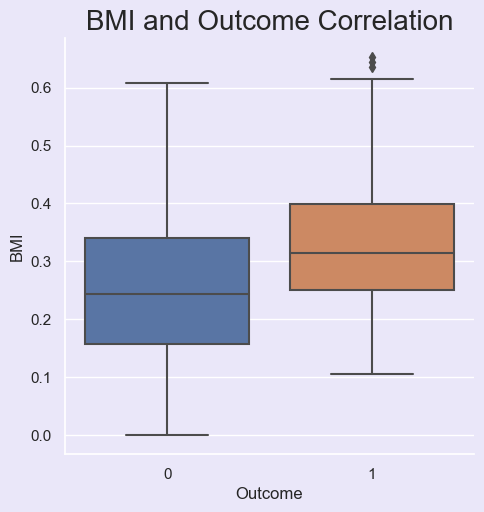

In [55]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="BMI", data=dataset_Final, kind='box')
plt.title("BMI and Outcome Correlation", size=20, y=1.0);

# DiabetesPedigreeFunction and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


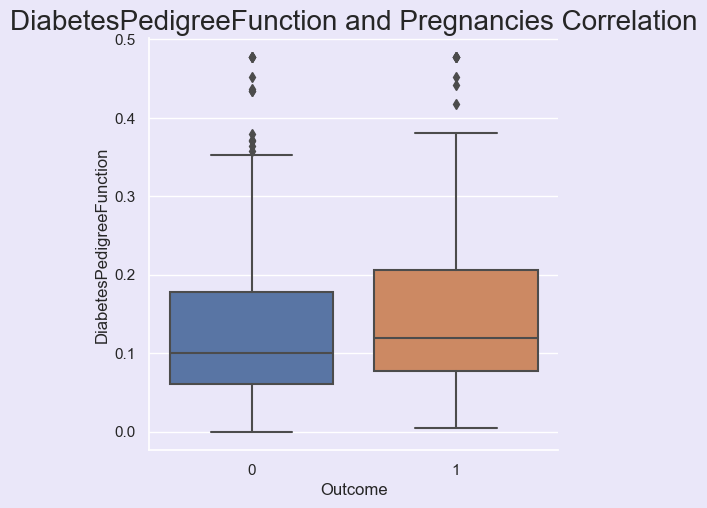

In [56]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="DiabetesPedigreeFunction", data=dataset_Final, kind='box')
plt.title("DiabetesPedigreeFunction and Pregnancies Correlation", size=20, y=1.0);

# Age and Outcome Correlation

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


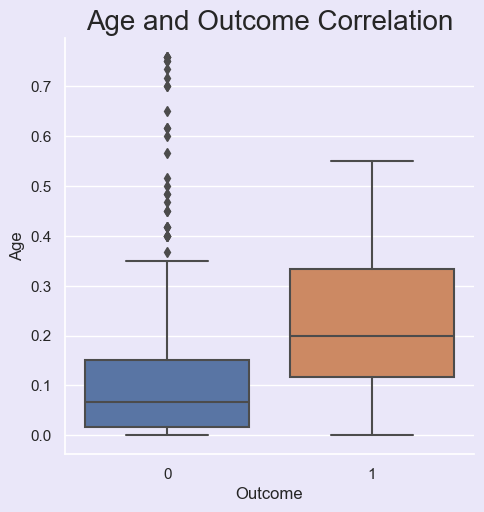

In [57]:
sns.set(rc={"axes.facecolor":"#EAE7F9","figure.facecolor":"#EAE7F9"})
p=sns.catplot(x="Outcome",y="Age", data=dataset_Final, kind='box')
plt.title("Age and Outcome Correlation", size=20, y=1.0);

# Correlation among attributes

In [58]:
x = dataset_Final.drop('Outcome', axis=1)

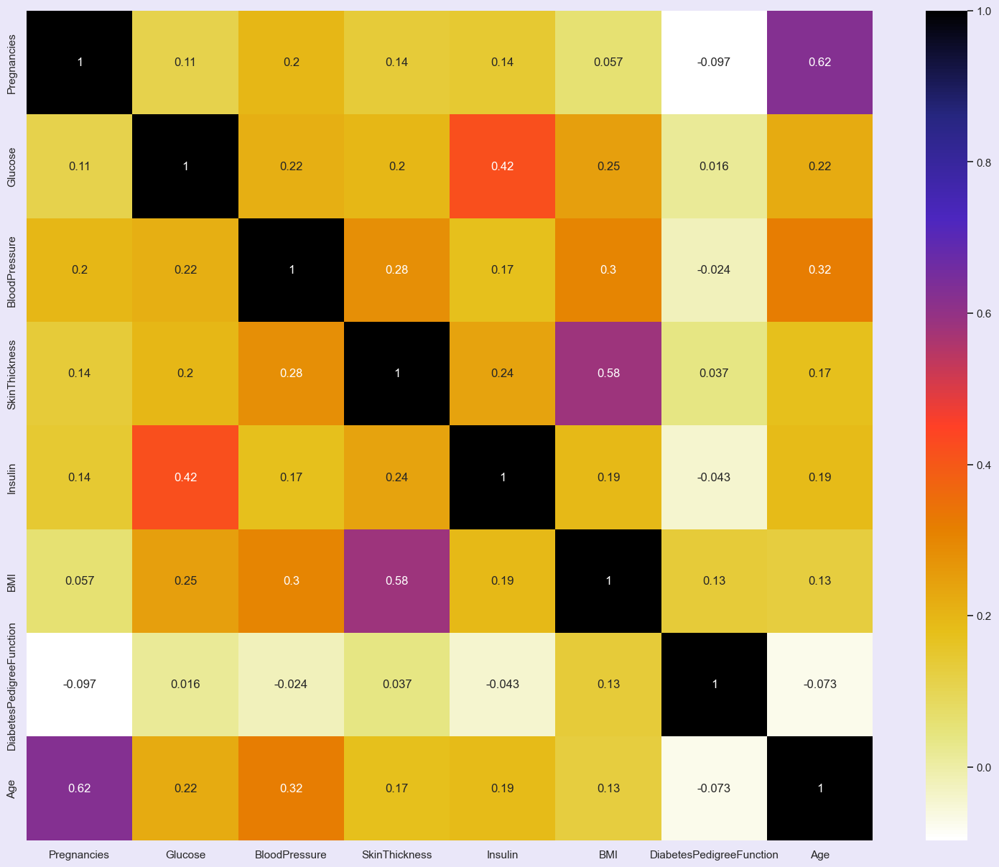

In [59]:
#Using Pearson Correlation
plt.figure(figsize=(19,15))
cor = x.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

# Feature Selection

# According to Correlation

In [141]:
def correlation(dataset, threshold):
    col_corr = set()  
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >= threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [142]:
corr_features = correlation(x, 0.20)
len(set(corr_features))

5

In [143]:
corr_features

{'Age', 'BMI', 'BloodPressure', 'Insulin', 'SkinThickness'}

In [144]:
dataset_Final.dtypes

Pregnancies                 float64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                         float64
Outcome                       int64
dtype: object

In [145]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

# List of columns to drop
#columns_to_drop = ['SkinThickness', 'Insulin', 'BMI']
#columns_to_drop = ['SkinThickness', 'DiabetesPedigreeFunction', 'Age', 'BloodPressure']
columns_to_drop = ['Pregnancies', 'Glucose', 'DiabetesPedigreeFunction'] # 5 features
# columns_to_drop = ['Pregnancies', 'Glucose'] # 6 features
# columns_to_drop = ['Pregnancies'] # 7 features
#columns_to_drop = ['SkinThickness']
# columns_to_drop = ['Pregnancies']    # 80
# columns_to_drop = ['Glucose']   # 74
# columns_to_drop = ['BloodPressure']   # 79
# columns_to_drop = ['SkinThickness']   # 80
# columns_to_drop = ['Insulin']    # 79
# columns_to_drop = ['BMI']    # 78
# columns_to_drop = ['DiabetesPedigreeFunction']  # 77
# columns_to_drop = ['Age']  # 79
# columns_to_drop = ['Glucose', 'DiabetesPedigreeFunction']

# Drop columns
df.drop(columns_to_drop, axis=1, inplace=True)
#df.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final1.csv")
df.head()
#print(df)

,BloodPressure,SkinThickness,Insulin,BMI,Age,Outcome
0,0.489796,0.304348,0.169998,0.314928,0.483333,1
1,0.428571,0.239130,0.169998,0.171779,0.166667,0
3,0.428571,0.173913,0.096154,0.202454,0.000000,0
5,0.510204,0.240712,0.169998,0.151329,0.150000,0
7,0.493753,0.240712,0.169998,0.349693,0.133333,0


In [146]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']


Train size: 0.9, Test size: 0.1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.74            0.70            0.25       0.07       -0.01      0.11       0.69           
Random Forest                  1.00            0.70            0.40       0.27       0.14       0.32       0.77           
Support Vector Machine         0.82            0.71            0.44       0.27       0.17       0.33       0.69           
Decision Tree                  1.00            0.68            0.40       0.40       0.18       0.40       0.59           
KNeighborsClassifier           0.84            0.71            0.46       0.40       0.24       0.43       0.75           
AdaBoost Classifier            0.85            0.75            0.54       0.47       0.34       0.50       0.73           
Gradient Boosting Classifier   0.92            0.71            0.45       0.33       0.21       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.75            0.71            0.00       0.00       -0.06      0.00       0.74           
Random Forest                  1.00            0.76            0.61       0.35       0.33       0.45       0.82           
Support Vector Machine         0.80            0.77            0.75       0.29       0.37       0.42       0.81           
Decision Tree                  1.00            0.75            0.54       0.61       0.40       0.58       0.71           
KNeighborsClassifier           0.83            0.79            0.64       0.58       0.47       0.61       0.80           
AdaBoost Classifier            0.85            0.79            0.67       0.52       0.45       0.58       0.78           
Gradient Boosting Classifier   0.92            0.77            0.62       0.48       0.40       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.76            0.71            0.25       0.02       -0.01      0.04       0.76           
Random Forest                  1.00            0.76            0.61       0.43       0.36       0.50       0.80           
Support Vector Machine         0.79            0.77            0.83       0.21       0.34       0.34       0.82           
Decision Tree                  1.00            0.69            0.45       0.43       0.23       0.44       0.61           
KNeighborsClassifier           0.84            0.78            0.63       0.57       0.45       0.60       0.82           
AdaBoost Classifier            0.85            0.75            0.57       0.45       0.34       0.50       0.81           
Gradient Boosting Classifier   0.94            0.78            0.65       0.47       0.41       0.

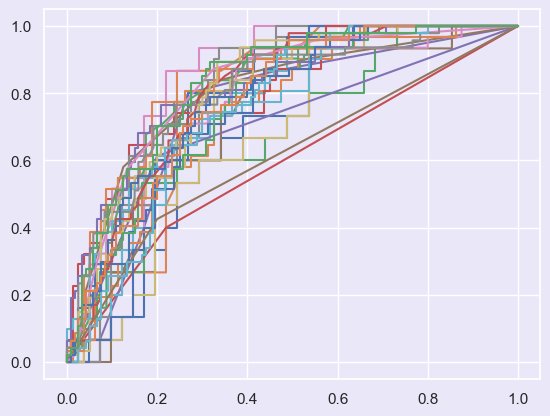

In [147]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.naive_bayes import GaussianNB  # Import Gaussian Naive Bayes
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef
from sklearn.naive_bayes import GaussianNB  # Import Gaussian Naive Bayes

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()
nb = GaussianNB()  # Initialize Naive Bayes classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp), ('nb', nb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Naive Bayes': nb,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')




Train size: 0.9, Test size: 0.1


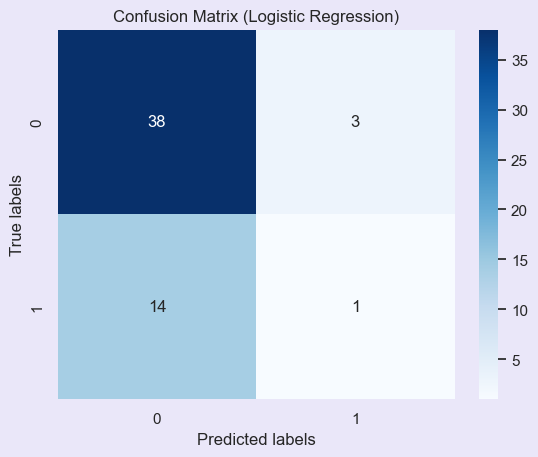

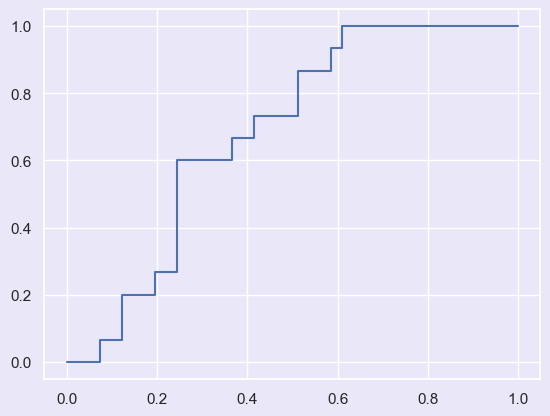

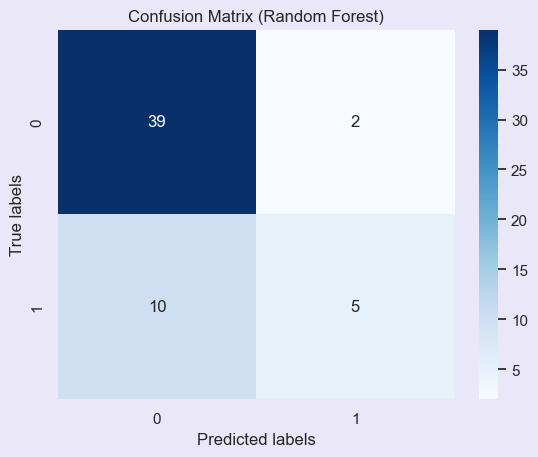

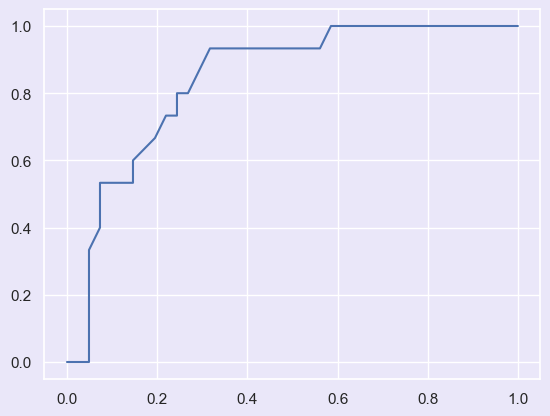

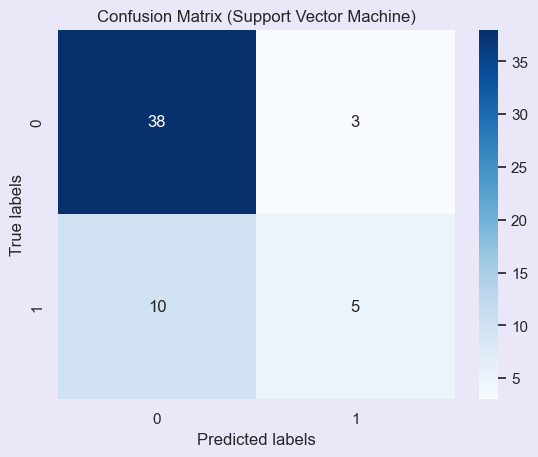

...

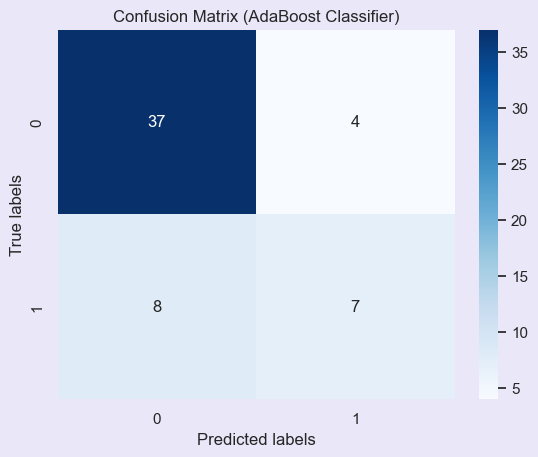

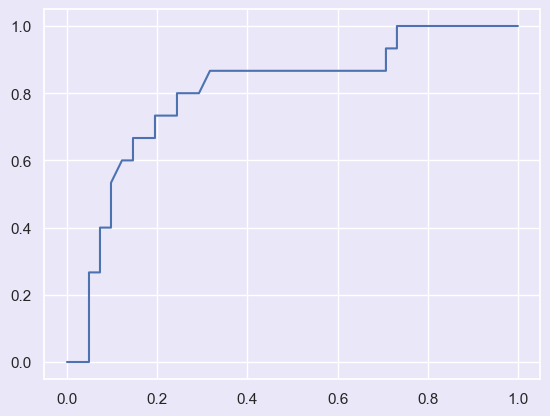

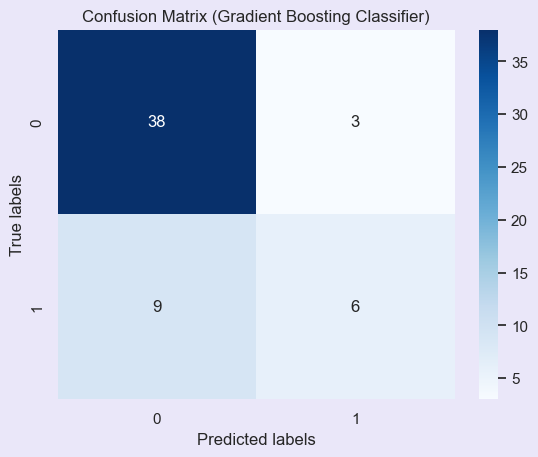

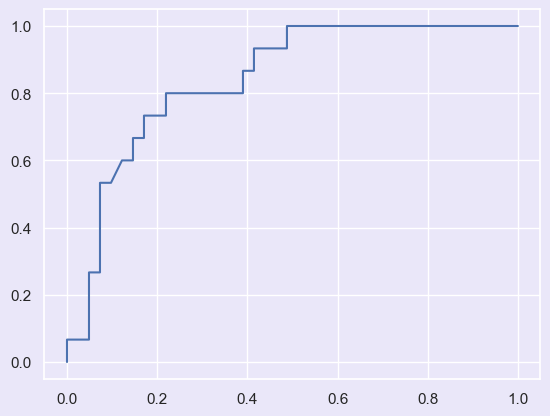

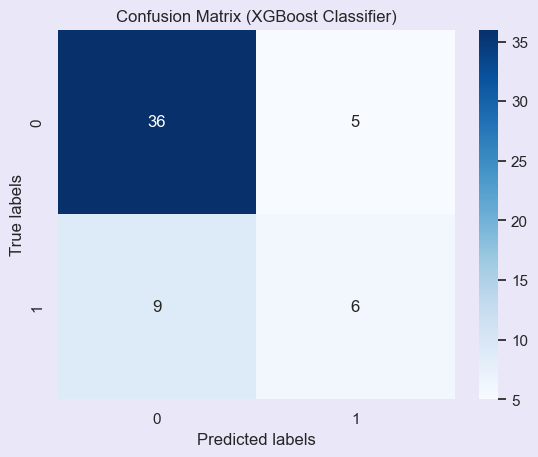

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


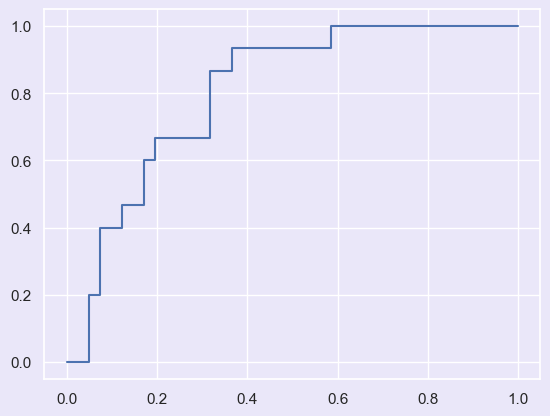

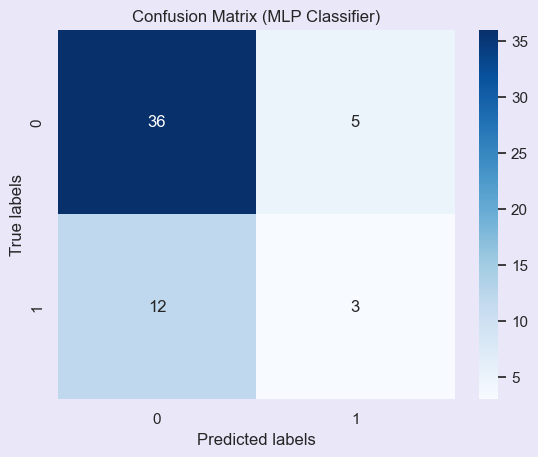

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


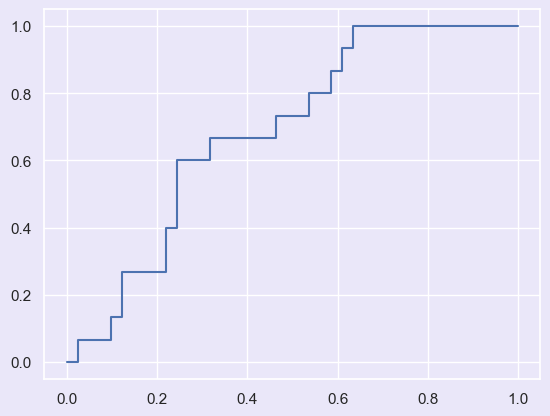

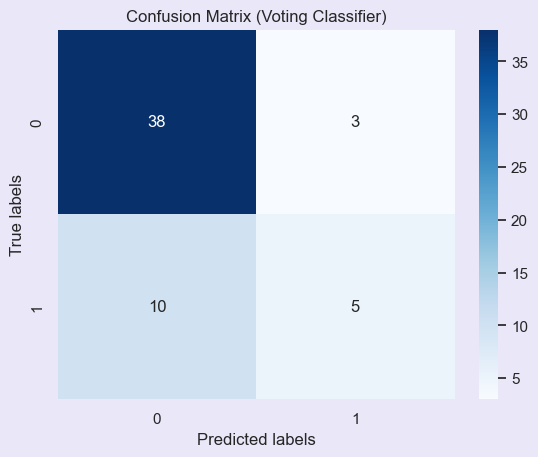

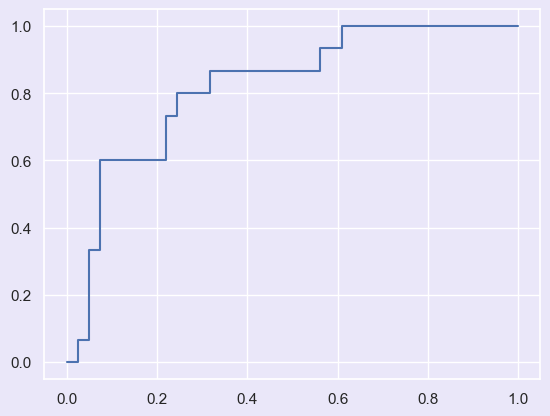

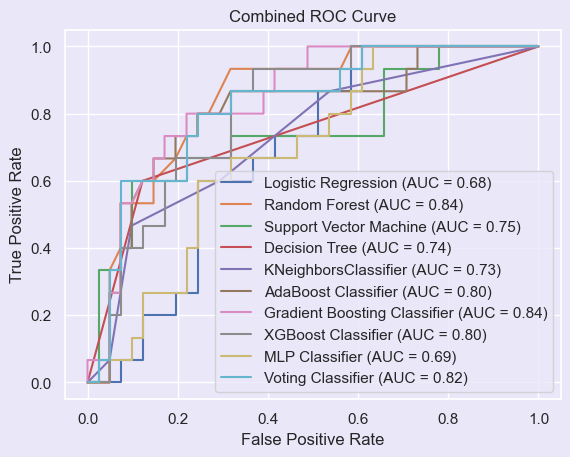

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.74            0.70            0.25       0.07       -0.01      0.11       0.68           
Random Forest                  1.00            0.79            0.71       0.33       0.38       0.45       0.84           
Support Vector Machine         0.83            0.77            0.62       0.33       0.33       0.43       0.75           
Decision Tree                  1.00            0.80            0.64       0.60       0.49       0.62       0.74           
KNeighborsClassifier           0.83            0.79            0.64       0.47       0.41       0.54       0.73           
AdaBoost Classifier            0.85            0.79            0.64       0.47       0.41       0.54       0.80           
Gradient Boosting Classifier   0.91            0.79            0.67       0.40       0.39       0.

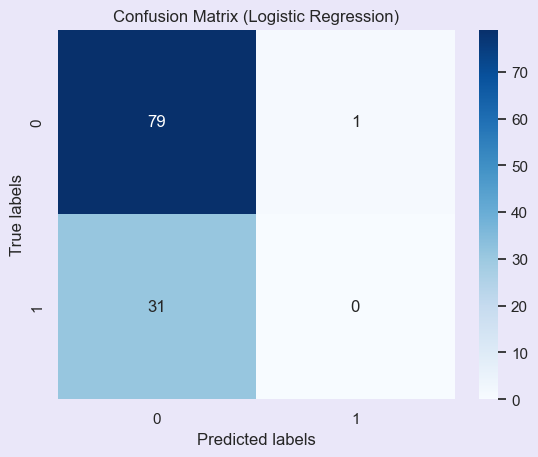

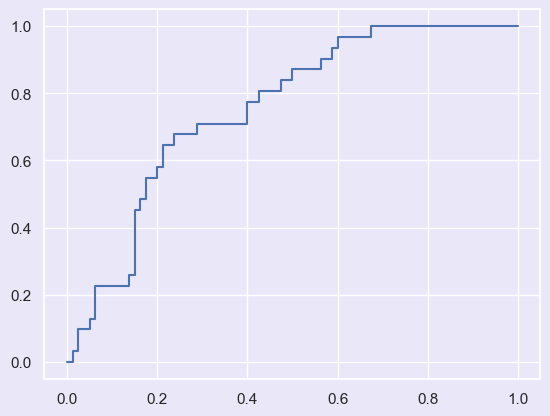

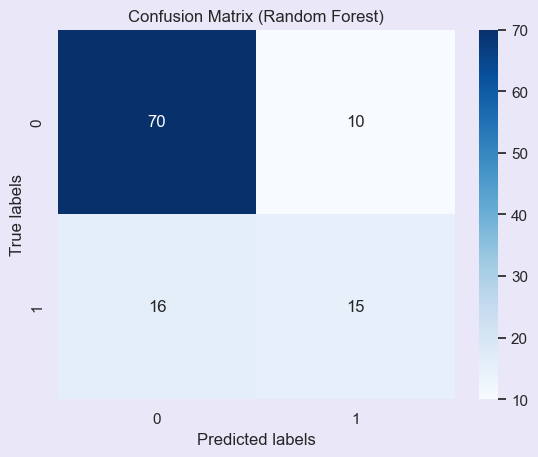

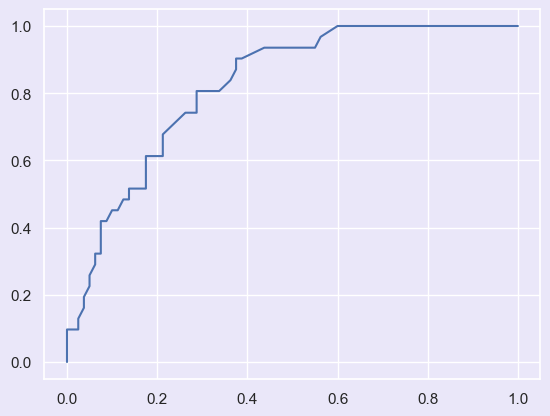

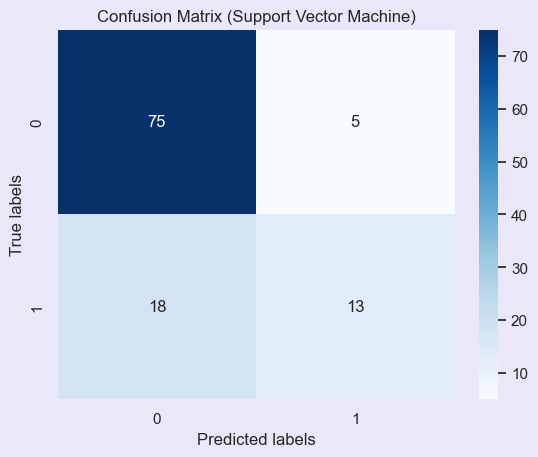

...

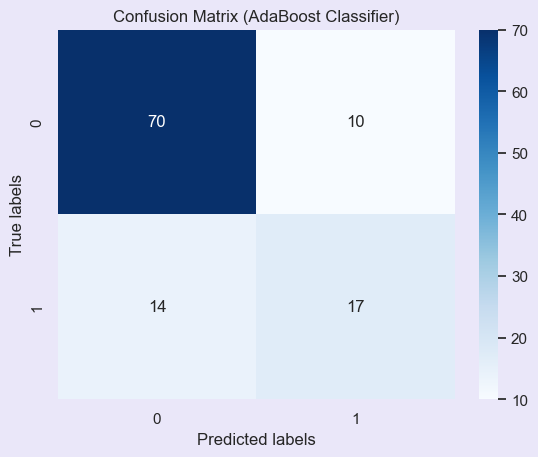

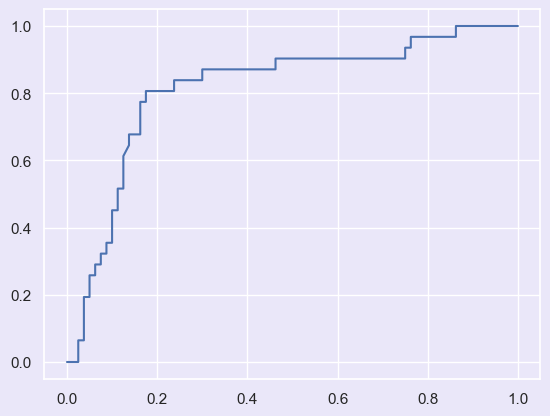

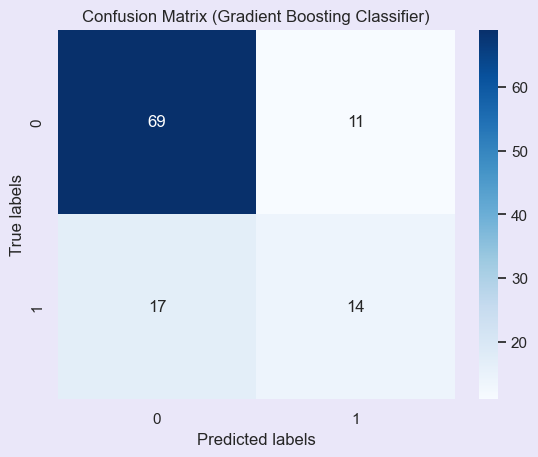

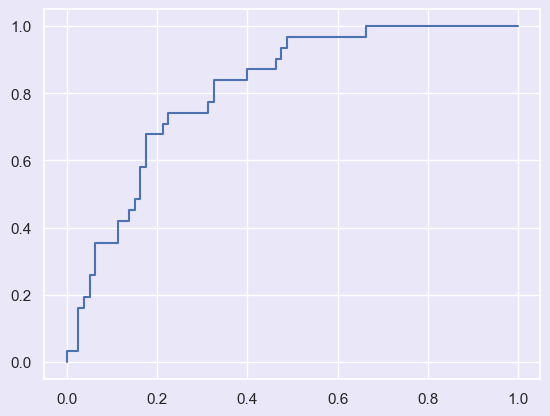

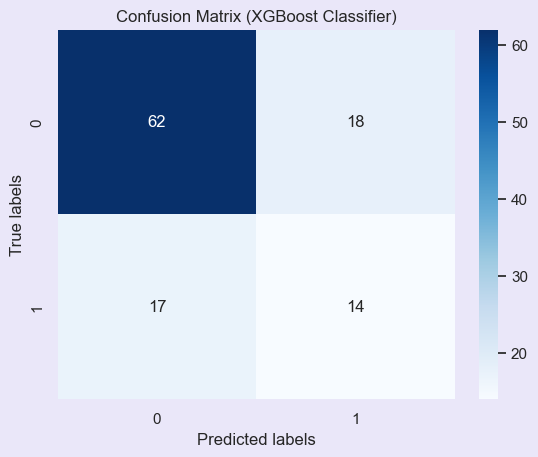

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


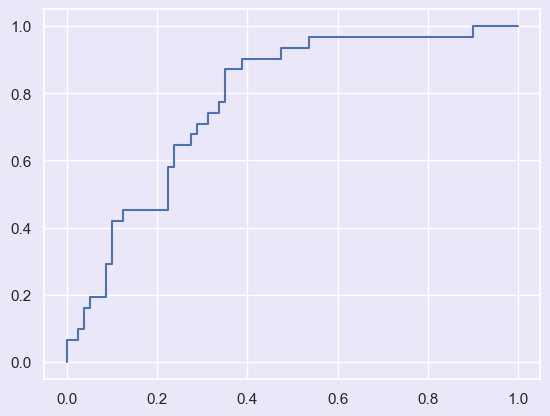

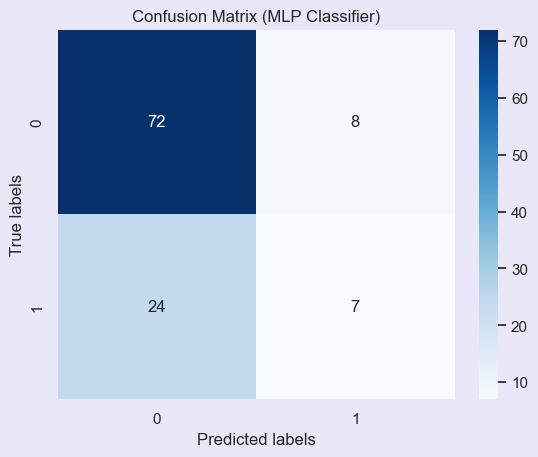

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


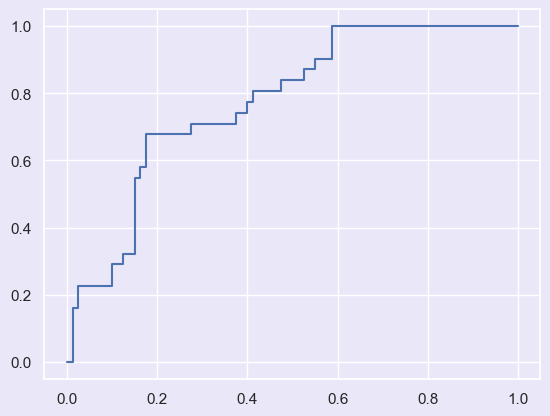

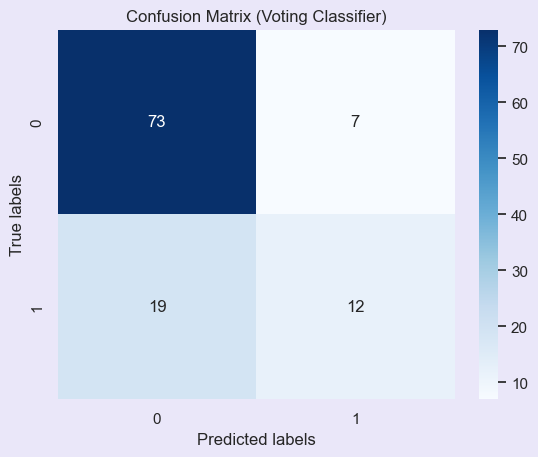

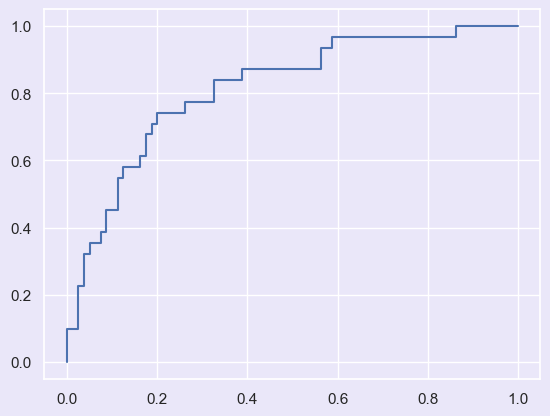

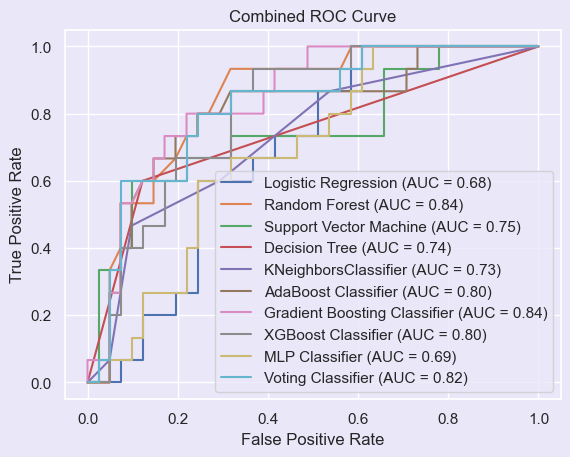

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.76            0.71            0.00       0.00       -0.06      0.00       0.75           
Random Forest                  1.00            0.77            0.60       0.48       0.39       0.54       0.82           
Support Vector Machine         0.82            0.79            0.72       0.42       0.43       0.53       0.79           
Decision Tree                  1.00            0.77            0.61       0.55       0.42       0.58       0.71           
KNeighborsClassifier           0.84            0.77            0.60       0.48       0.39       0.54       0.74           
AdaBoost Classifier            0.86            0.78            0.63       0.55       0.44       0.59       0.82           
Gradient Boosting Classifier   0.94            0.75            0.56       0.45       0.34       0.

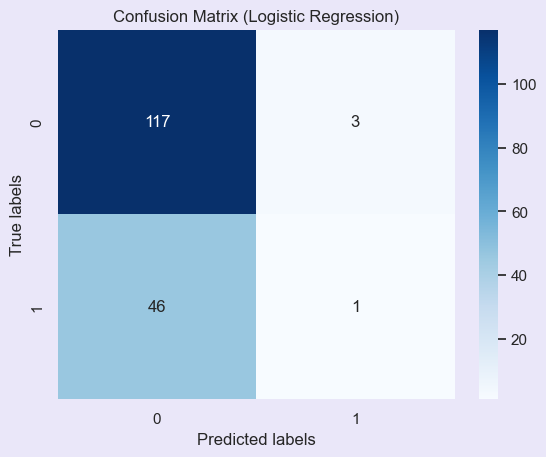

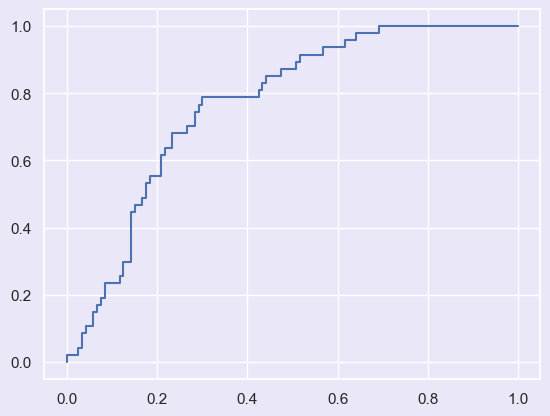

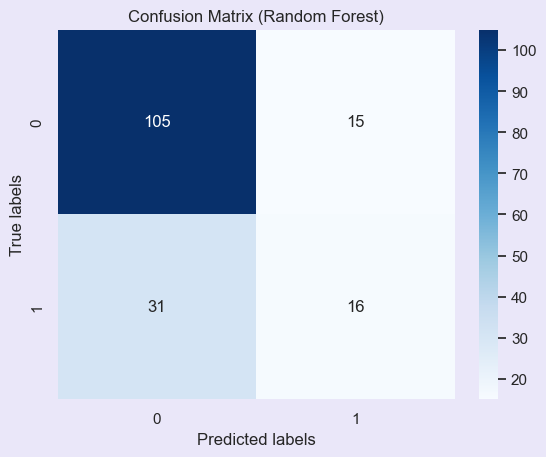

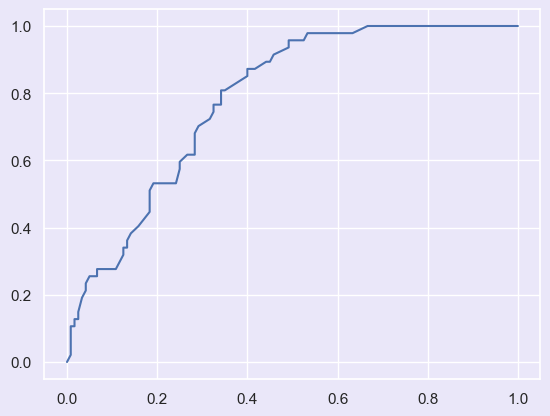

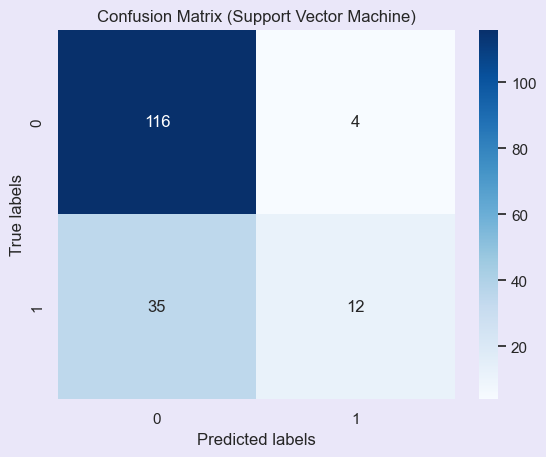

...

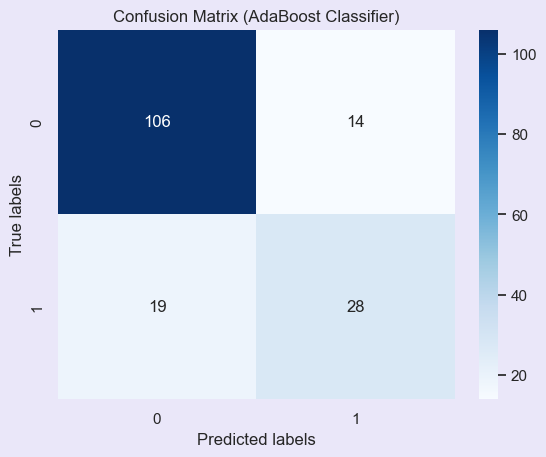

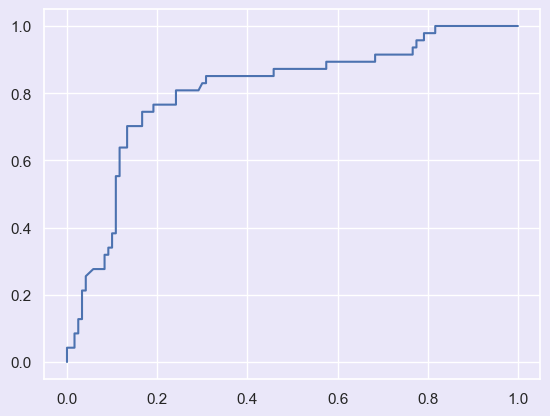

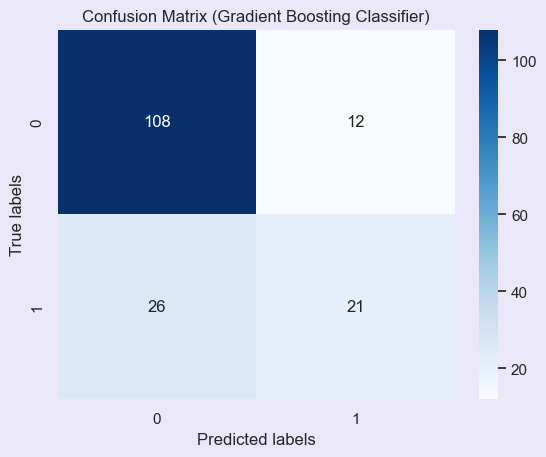

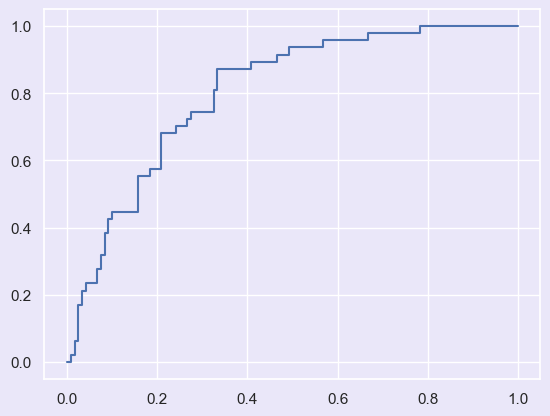

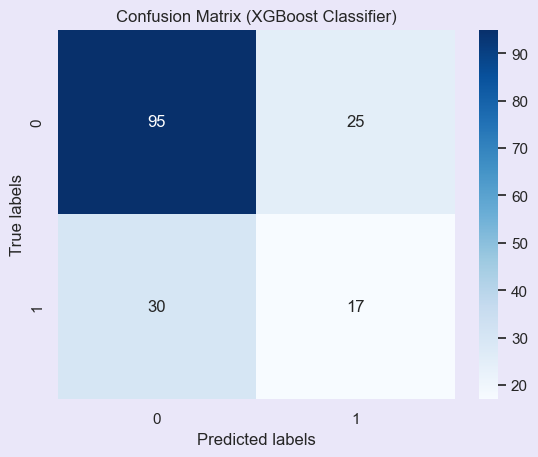

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


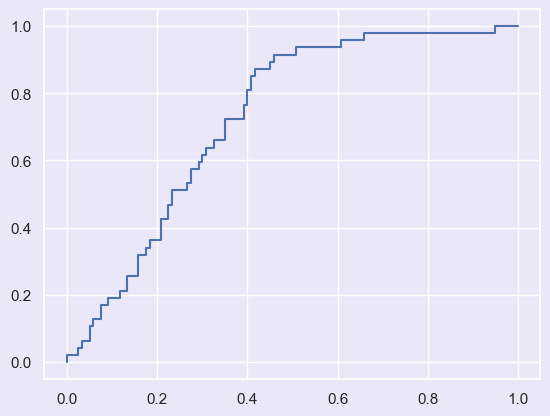

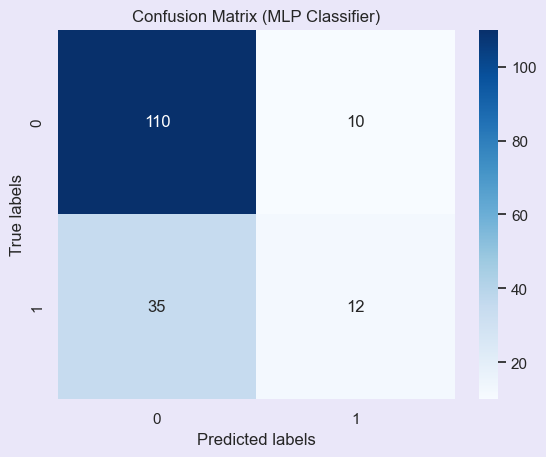

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


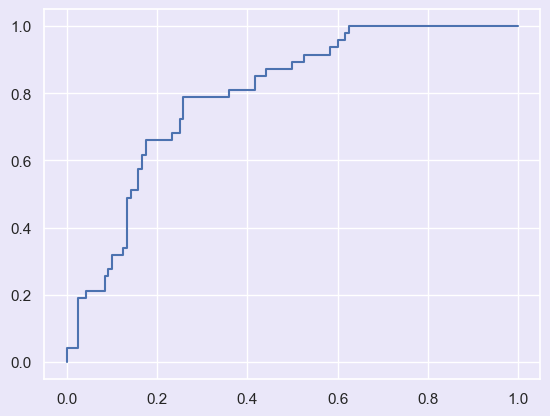

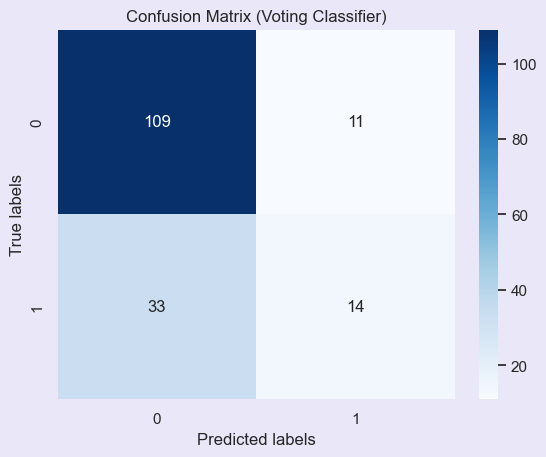

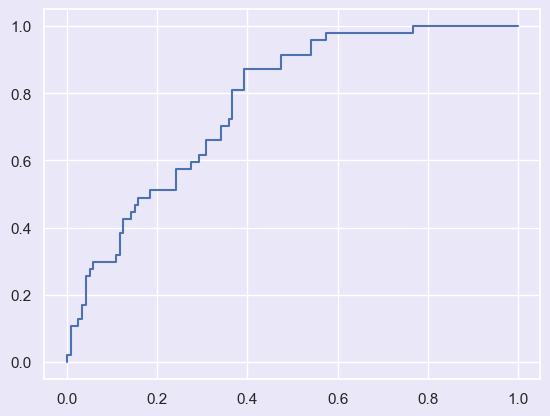

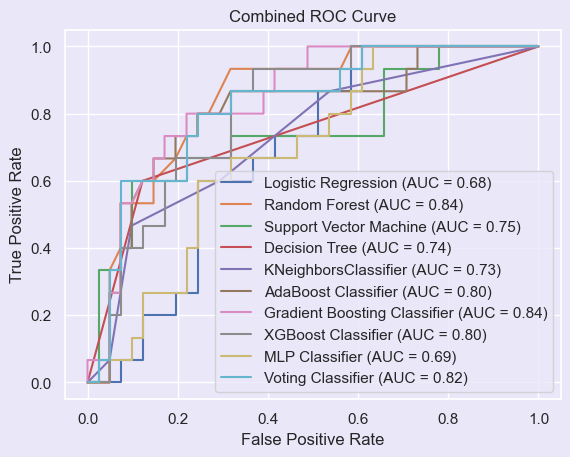

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.76            0.71            0.25       0.02       -0.01      0.04       0.77           
Random Forest                  1.00            0.72            0.52       0.34       0.25       0.41       0.78           
Support Vector Machine         0.82            0.77            0.75       0.26       0.34       0.38       0.77           
Decision Tree                  1.00            0.72            0.50       0.47       0.29       0.48       0.64           
KNeighborsClassifier           0.84            0.75            0.59       0.36       0.31       0.45       0.69           
AdaBoost Classifier            0.86            0.80            0.67       0.60       0.50       0.63       0.81           
Gradient Boosting Classifier   0.95            0.77            0.64       0.45       0.39       0.

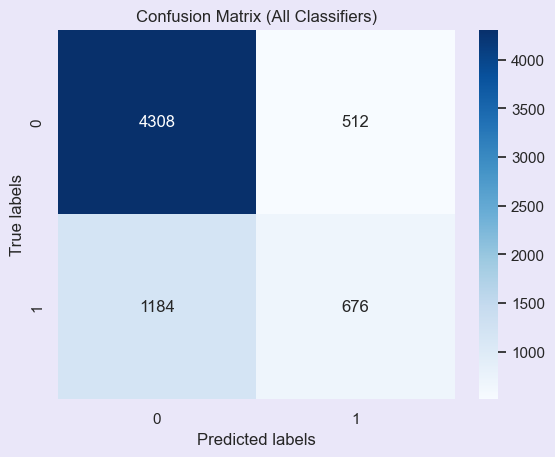

In [123]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()  # Initialize MLP classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.show()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')


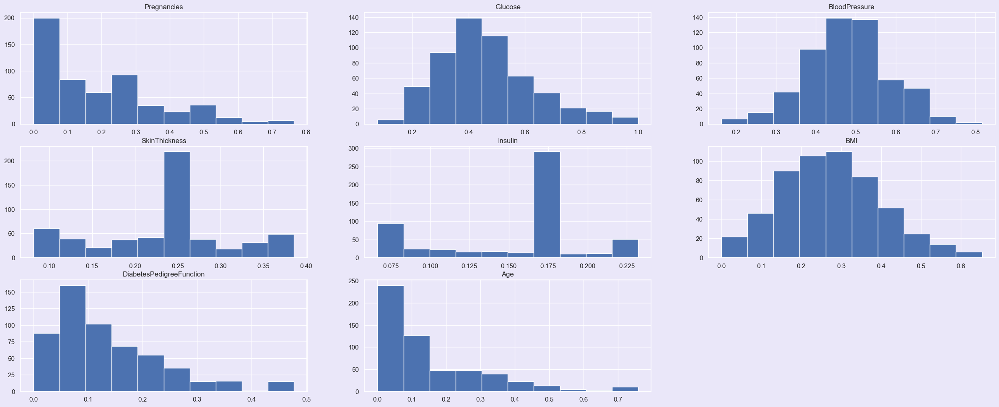

In [67]:
plt.figure(figsize=(30,20))
for i,feature in enumerate(x):
    plt.subplot(5,3,i+1)
    x[feature].hist()
    plt.title(feature)

# Chi-Square Test 

In [68]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
import numpy as np

# Assuming X contains your feature matrix and y contains your target variable
# X should be encoded categorical features
# y should be the target variable
feature_names=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI', 'DiabetesPedigreeFunction','Age',]

X = dataset_Final.drop('Outcome', axis=1)
y=dataset_Final['Outcome']
# Select the top 5 features based on chi-square test
k = 5
chi2_selector = SelectKBest(chi2, k=k)
X_new = chi2_selector.fit_transform(X, y)

# Get the selected feature indices
selected_feature_indices = chi2_selector.get_support(indices=True)

# Get the names of the selected features

selected_feature_names = [feature_names[i] for i in selected_feature_indices]

print("Selected features:", selected_feature_names)

Selected features: ['Pregnancies', 'Glucose', 'SkinThickness', 'BMI', 'Age']


In [69]:
dataset_Final.dtypes

Pregnancies                 float64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                         float64
Outcome                       int64
dtype: object

In [70]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

# List of columns to drop
#columns_to_drop = ['SkinThickness', 'Insulin', 'BMI']
#columns_to_drop = ['SkinThickness', 'DiabetesPedigreeFunction', 'Age', 'BloodPressure']
columns_to_drop = ['DiabetesPedigreeFunction', 'BloodPressure', 'Insulin']  # 5 features
# columns_to_drop = ['SkinThickness', 'BloodPressure']   # 6 features
# columns_to_drop = ['BloodPressure']   # 7 features
# Drop columns

df.drop(columns_to_drop, axis=1, inplace=True)
#df.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final1.csv")
df.head()
#print(df)

,Pregnancies,Glucose,SkinThickness,BMI,Age,Outcome
0,0.352941,0.670968,0.304348,0.314928,0.483333,1
1,0.058824,0.264516,0.239130,0.171779,0.166667,0
3,0.058824,0.290323,0.173913,0.202454,0.000000,0
5,0.294118,0.464516,0.240712,0.151329,0.150000,0
7,0.588235,0.458065,0.240712,0.349693,0.133333,0


In [71]:
columns_to_drop

['DiabetesPedigreeFunction', 'BloodPressure', 'Insulin']

In [72]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']

In [73]:
X.dtypes

Pregnancies      float64
Glucose          float64
SkinThickness    float64
BMI              float64
Age              float64
dtype: object

In [74]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import SelectKBest, chi2

# Assuming X contains your features and y contains your target variable

# Initialize SelectKBest with chi2 scoring function
k_best = SelectKBest(score_func=chi2, k='all')
k_best.fit(X, y)

# Get the chi-square scores and corresponding feature names
chi_scores = k_best.scores_
feature_names = X.columns  # Assuming you have feature names as column names in X

# Create a DataFrame to store the results
chi_square_df = pd.DataFrame({'Feature Name': feature_names, 'Chi-Square Score': chi_scores})

# Display the DataFrame with bold column heading
chi_square_df.style.set_caption("<b>Selected Features and Chi-Square Scores</b>")


,Feature Name,Chi-Square Score
0,Pregnancies,4.179318
1,Glucose,10.066585
2,SkinThickness,0.675273
3,BMI,2.689733
4,Age,7.306984


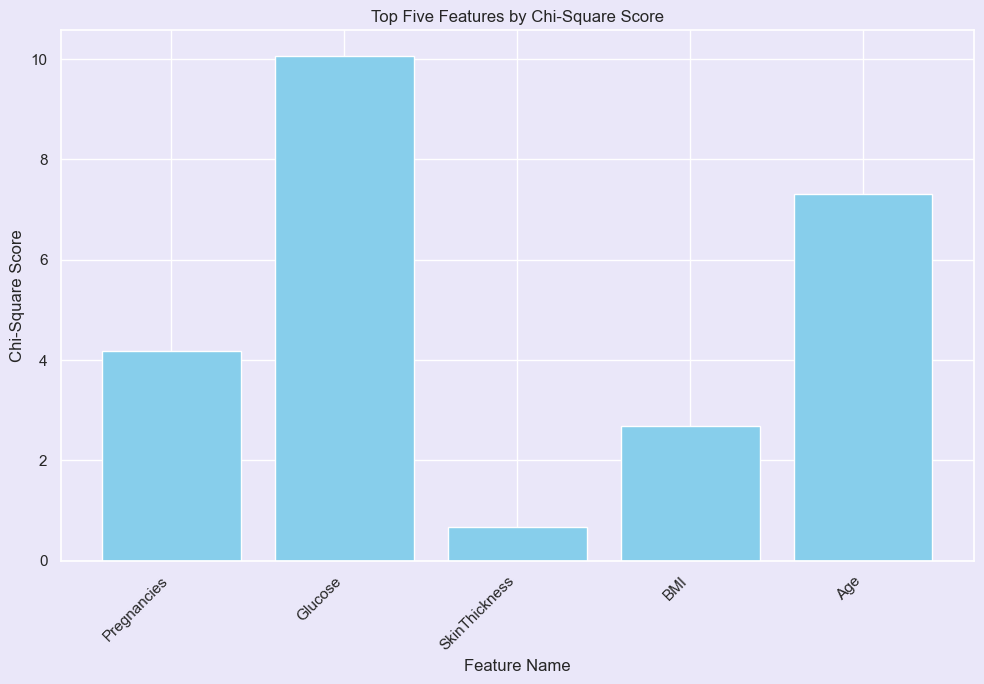

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest, chi2

# Assuming X contains your features and y contains your target variable

# Perform chi-square test
num_features = 5  # Number of top features to select
selector = SelectKBest(score_func=chi2, k=num_features)
selector.fit(X, y)

# Get the selected feature indices and their corresponding scores
feature_indices = selector.get_support(indices=True)
feature_names = X.columns[feature_indices]
chi_square_scores = selector.scores_[feature_indices]

# Create bar chart
plt.figure(figsize=(10, 7))
plt.bar(feature_names, chi_square_scores, color='skyblue')
plt.xlabel('Feature Name')
plt.ylabel('Chi-Square Score')
plt.title('Top Five Features by Chi-Square Score')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



Train size: 0.9, Test size: 0.1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.82            0.77            0.67       0.27       0.31       0.38       0.86           
Random Forest                  1.00            0.84            0.80       0.53       0.56       0.64       0.94           
Support Vector Machine         0.84            0.82            0.86       0.40       0.50       0.55       0.85           
Decision Tree                  1.00            0.77            0.57       0.53       0.40       0.55       0.69           
KNeighborsClassifier           0.90            0.89            1.00       0.60       0.72       0.75       0.96           
AdaBoost Classifier            0.88            0.84            0.80       0.53       0.56       0.64       0.92           
Gradient Boosting Classifier   0.96            0.80            0.70       0.47       0.45       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.82            0.79            0.83       0.32       0.43       0.47       0.87           
Random Forest                  1.00            0.86            0.89       0.55       0.62       0.68       0.94           
Support Vector Machine         0.85            0.80            0.76       0.42       0.46       0.54       0.90           
Decision Tree                  1.00            0.77            0.62       0.42       0.37       0.50       0.66           
KNeighborsClassifier           0.89            0.90            0.92       0.71       0.75       0.80       0.96           
AdaBoost Classifier            0.90            0.86            0.86       0.58       0.62       0.69       0.90           
Gradient Boosting Classifier   0.97            0.85            0.94       0.48       0.60       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.81            0.89       0.36       0.49       0.52       0.90           
Random Forest                  1.00            0.83            0.88       0.45       0.54       0.59       0.94           
Support Vector Machine         0.85            0.83            0.95       0.40       0.55       0.57       0.91           
Decision Tree                  1.00            0.81            0.71       0.57       0.52       0.64       0.74           
KNeighborsClassifier           0.90            0.87            0.86       0.64       0.66       0.73       0.90           
AdaBoost Classifier            0.89            0.83            0.78       0.53       0.54       0.63       0.88           
Gradient Boosting Classifier   0.96            0.85            0.87       0.55       0.61       0.

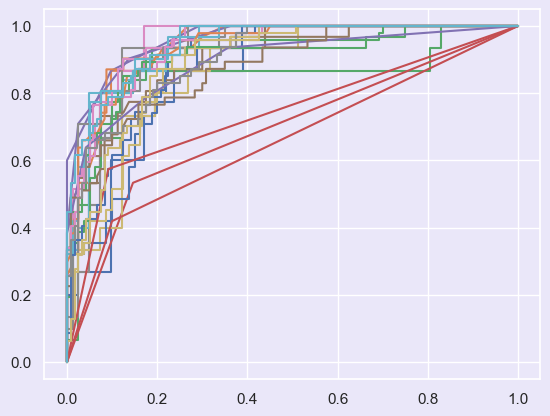

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()  # Initialize MLP classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')



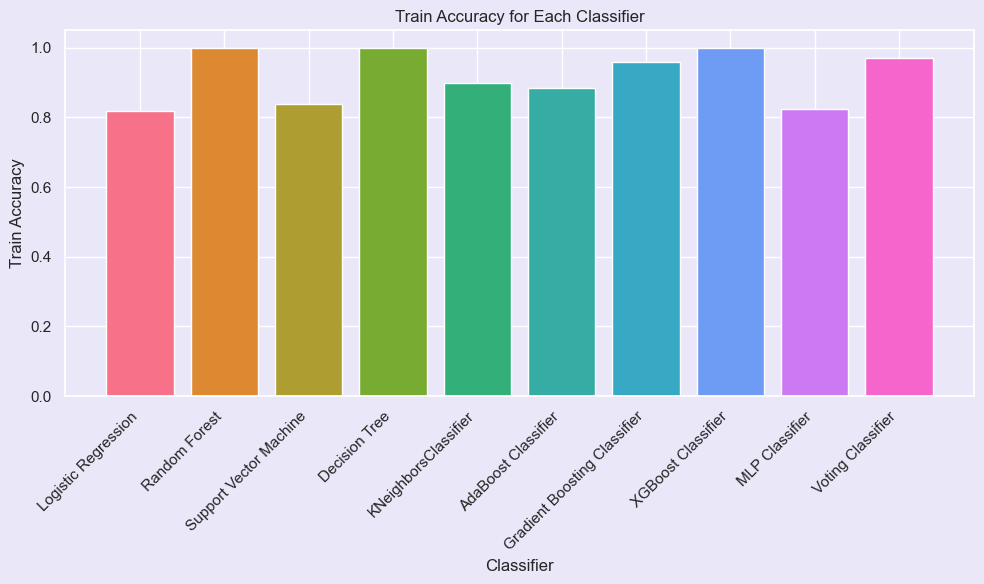

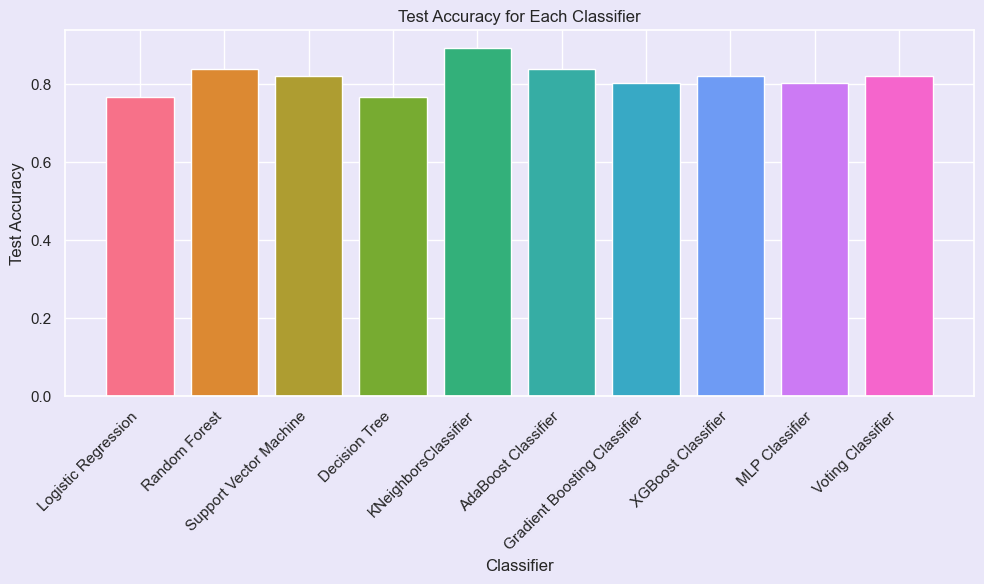

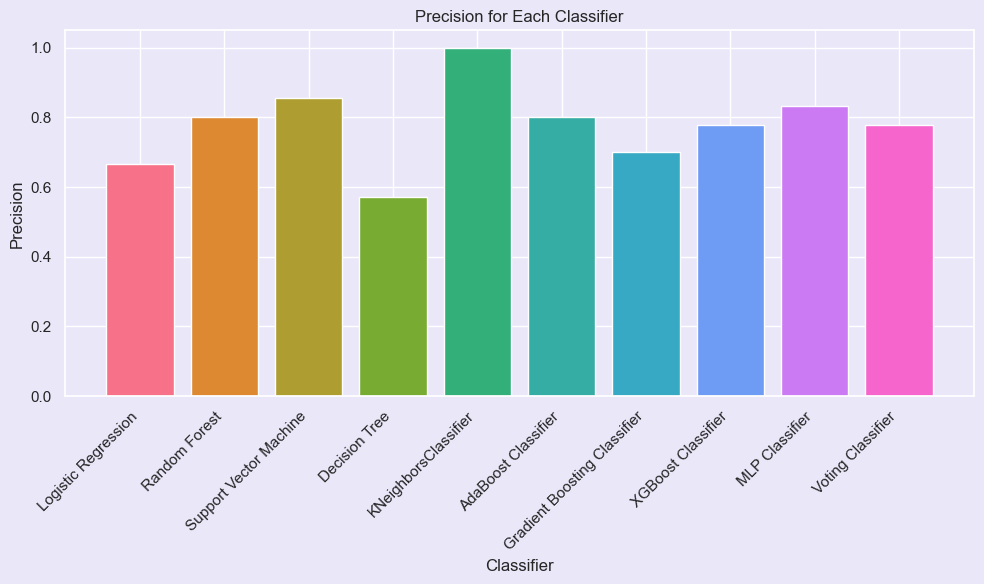

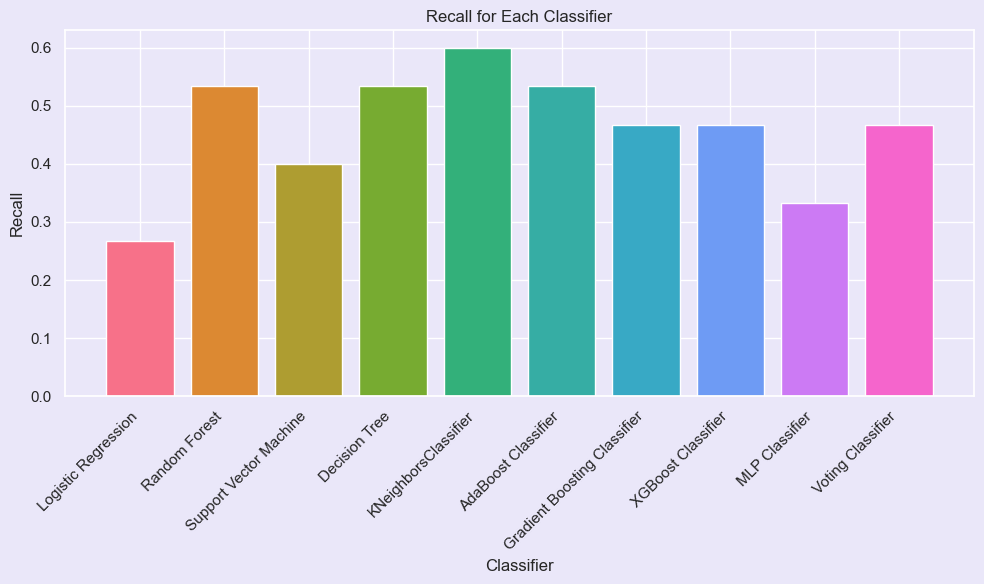

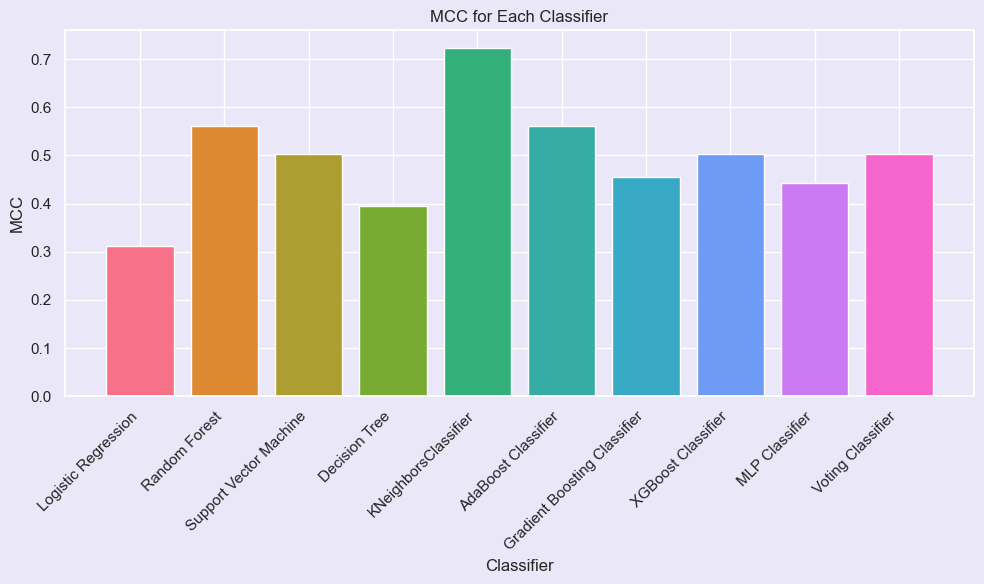

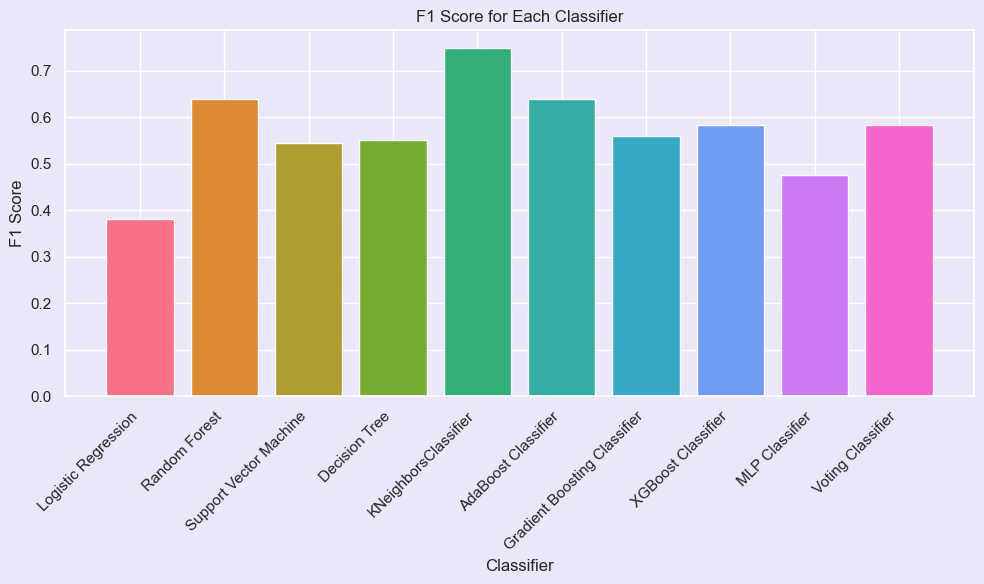

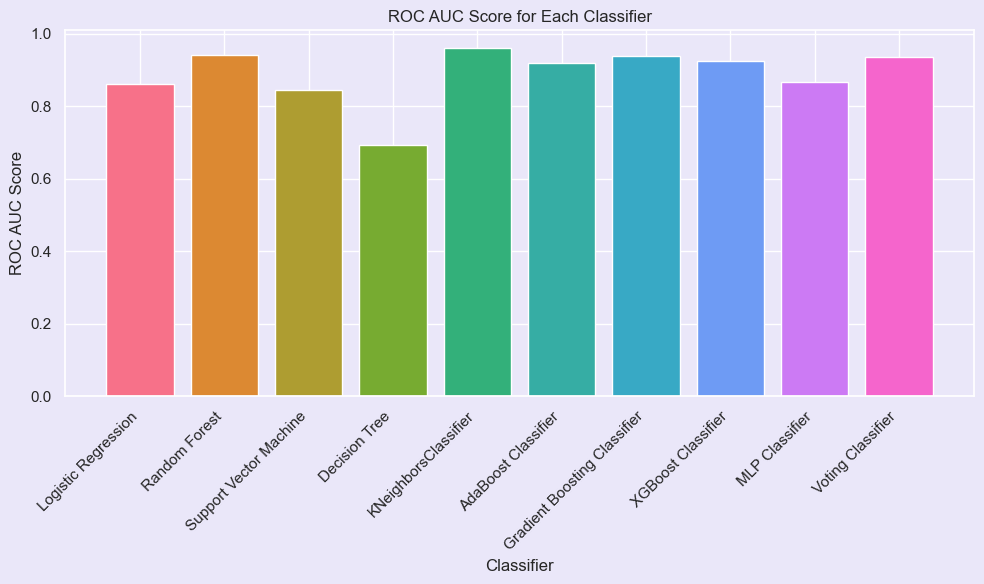

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a color palette for the classifiers
classifier_colors = sns.color_palette("husl", len(classifiers))

# Function to plot performance metrics for each classifier
def plot_performance_metrics(metrics, metric_name):
    plt.figure(figsize=(10, 6))
    classifiers = list(metrics.keys())
    values = list(metrics.values())
    for i, classifier in enumerate(classifiers):
        plt.bar(classifier, values[i], color=classifier_colors[i])
    plt.xlabel('Classifier')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} for Each Classifier')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot performance metrics for each classifier
for metric_name, metric_values in combined_metrics.items():
    plot_performance_metrics({classifier: metric for classifier, metric in zip(classifiers.keys(), metric_values)}, metric_name)


In [78]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = dataset_Final.drop('Outcome', axis = 1)
y = dataset_Final['Outcome']

In [79]:
dataset_Final

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0.171779,0.116567,0.166667,0
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0
5,0.294118,0.464516,0.510204,0.240712,0.169998,0.151329,0.052519,0.150000,0
7,0.588235,0.458065,0.493753,0.240712,0.169998,0.349693,0.023911,0.133333,0
10,0.235294,0.425806,0.693878,0.240712,0.169998,0.396728,0.048249,0.150000,0
15,0.411765,0.361290,0.493753,0.240712,0.169998,0.241309,0.173356,0.183333,1
16,0.000000,0.477419,0.612245,0.385870,0.232085,0.564417,0.201964,0.166667,1
17,0.411765,0.406452,0.510204,0.240712,0.169998,0.233129,0.075149,0.166667,1
19,0.058824,0.458065,0.469388,0.250000,0.098558,0.335378,0.192570,0.183333,1


In [80]:
X.dtypes


Pregnancies                 float64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                         float64
dtype: object

# Minimum Redundancy and Maximum Relevancy (mRMR) Test

In [81]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

In [82]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']

In [83]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

def mrmr_feature_selection(data, target_column, num_features):
    # Split data into features and target
#     X = data.drop(columns=[target_column])
#     y = data[target_column]
    
    # Calculate mutual information between each feature and the target
    mi = mutual_info_classif(X, y)
    
    # Calculate redundancy matrix
    redundancy_matrix = pd.DataFrame(columns=X.columns, index=X.columns)
    for i, feature_i in enumerate(X.columns):
        for j, feature_j in enumerate(X.columns):
            if i != j:
                redundancy_matrix.loc[feature_i, feature_j] = mi[i] + mi[j] - 2 * mutual_info_classif(X[[feature_i, feature_j]], y)[1]
            else:
                redundancy_matrix.loc[feature_i, feature_j] = mi[i]

    # Initialize mRMR scores
    mrmr_scores = mi.copy()
    
    # Update mRMR scores with redundancy
    for i, feature in enumerate(X.columns):
        mrmr_scores[i] -= sum(redundancy_matrix.loc[feature, :]) / (len(X.columns) - 1)
    
    # Sort features by mRMR score
    sorted_features = sorted(zip(X.columns, mrmr_scores), key=lambda x: x[1], reverse=True)
    
    # Select top features
    selected_features = [feature[0] for feature in sorted_features[:num_features]]
    
    return selected_features

# Example usage
# Assuming 'data' is your pandas DataFrame and 'target_column' is the name of the target column
# num_features is the number of features you want to select
selected_features = mrmr_feature_selection(data, target_column='target', num_features=5)
print("Selected features:", selected_features)


Selected features: ['DiabetesPedigreeFunction', 'Pregnancies', 'SkinThickness', 'BloodPressure', 'Insulin']


In [84]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

# List of columns to drop
#columns_to_drop = ['SkinThickness', 'Insulin', 'BMI']
#columns_to_drop = ['SkinThicknesDiabetesPedigreeFunctions', 'DiabetesPedigreeFunction', 'Age', 'BloodPressure']
columns_to_drop = ['BMI', 'DiabetesPedigreeFunction', 'Age']  # 5 features
# columns_to_drop = ['DiabetesPedigreeFunction', 'Age']  # 6 features

# Drop columns
df.drop(columns_to_drop, axis=1, inplace=True)
#df.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final1.csv")
df.head()
#print(df)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.169998,1
1,0.058824,0.264516,0.428571,0.239130,0.169998,0
3,0.058824,0.290323,0.428571,0.173913,0.096154,0
5,0.294118,0.464516,0.510204,0.240712,0.169998,0
7,0.588235,0.458065,0.493753,0.240712,0.169998,0



Train size: 0.9, Test size: 0.1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.79            1.00       0.20       0.39       0.33       0.86           
Random Forest                  1.00            0.82            0.78       0.47       0.50       0.58       0.93           
Support Vector Machine         0.86            0.79            0.80       0.27       0.38       0.40       0.88           
Decision Tree                  1.00            0.79            0.60       0.60       0.45       0.60       0.73           
KNeighborsClassifier           0.90            0.91            0.92       0.73       0.77       0.81       0.93           
AdaBoost Classifier            0.91            0.84            0.80       0.53       0.56       0.64       0.88           
Gradient Boosting Classifier   0.96            0.80            0.70       0.47       0.45       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.80            0.91       0.32       0.47       0.48       0.88           
Random Forest                  1.00            0.86            0.89       0.55       0.62       0.68       0.93           
Support Vector Machine         0.86            0.81            0.78       0.45       0.49       0.57       0.91           
Decision Tree                  1.00            0.77            0.59       0.52       0.40       0.55       0.69           
KNeighborsClassifier           0.90            0.89            0.88       0.71       0.72       0.79       0.96           
AdaBoost Classifier            0.93            0.81            0.73       0.52       0.50       0.60       0.88           
Gradient Boosting Classifier   0.97            0.84            0.81       0.55       0.57       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.81            0.86       0.38       0.49       0.53       0.90           
Random Forest                  1.00            0.85            0.84       0.57       0.61       0.68       0.93           
Support Vector Machine         0.85            0.83            0.91       0.45       0.56       0.60       0.92           
Decision Tree                  1.00            0.80            0.71       0.51       0.48       0.59       0.71           
KNeighborsClassifier           0.91            0.87            0.82       0.68       0.66       0.74       0.93           
AdaBoost Classifier            0.93            0.80            0.67       0.60       0.50       0.63       0.86           
Gradient Boosting Classifier   0.98            0.84            0.86       0.53       0.59       0.

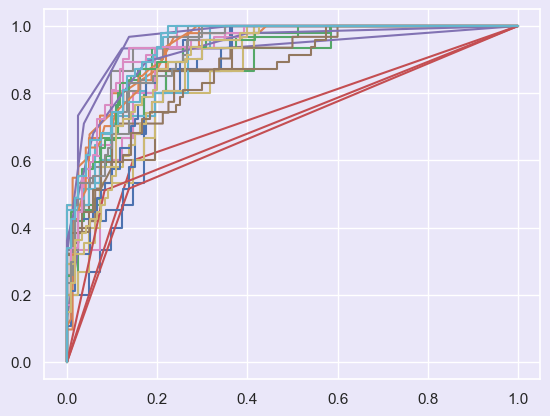

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()  # Initialize MLP classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')


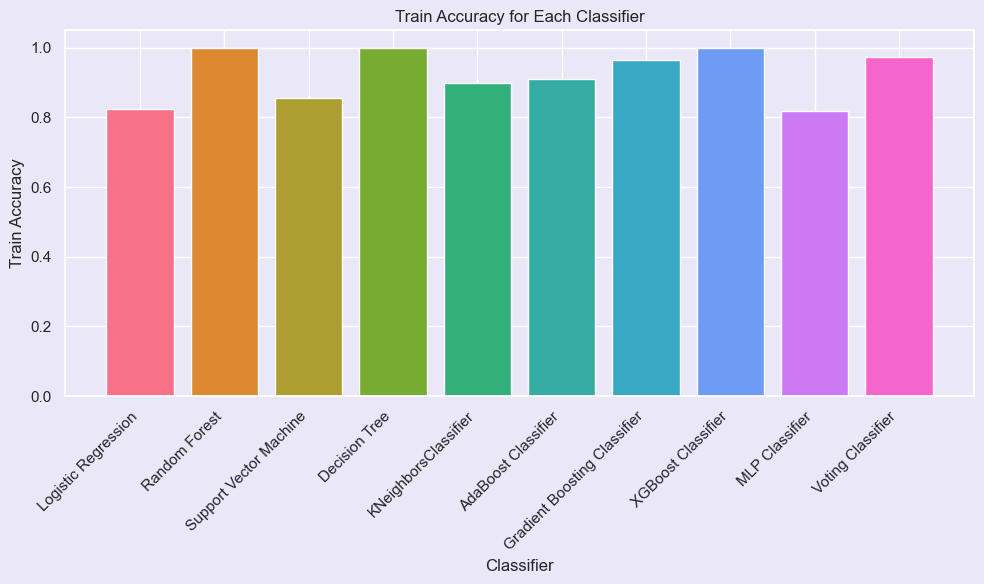

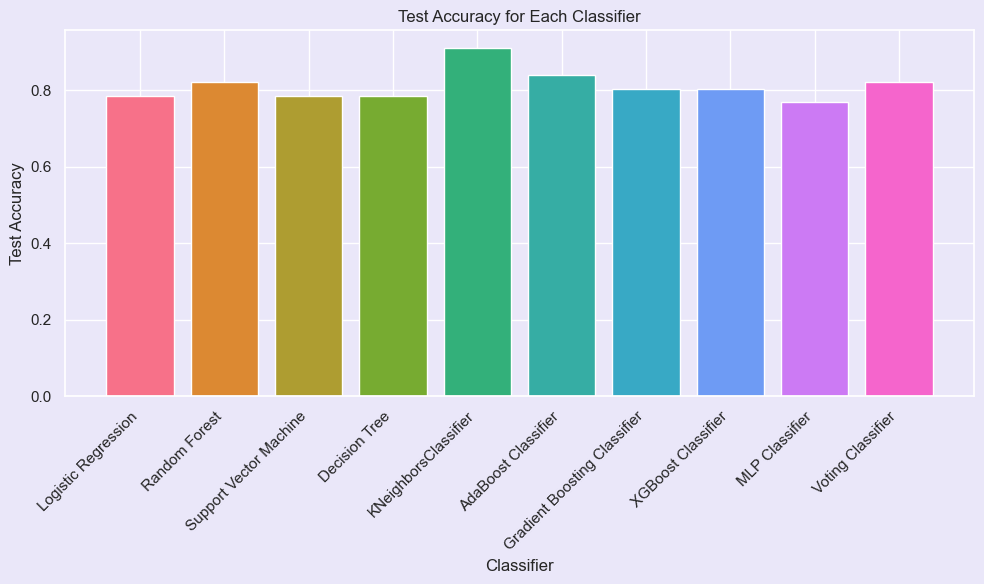

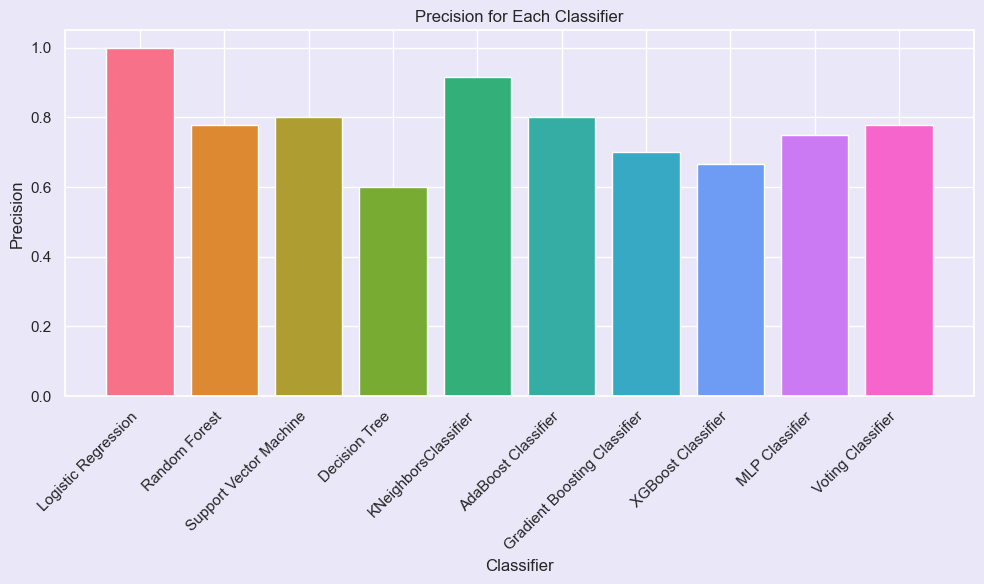

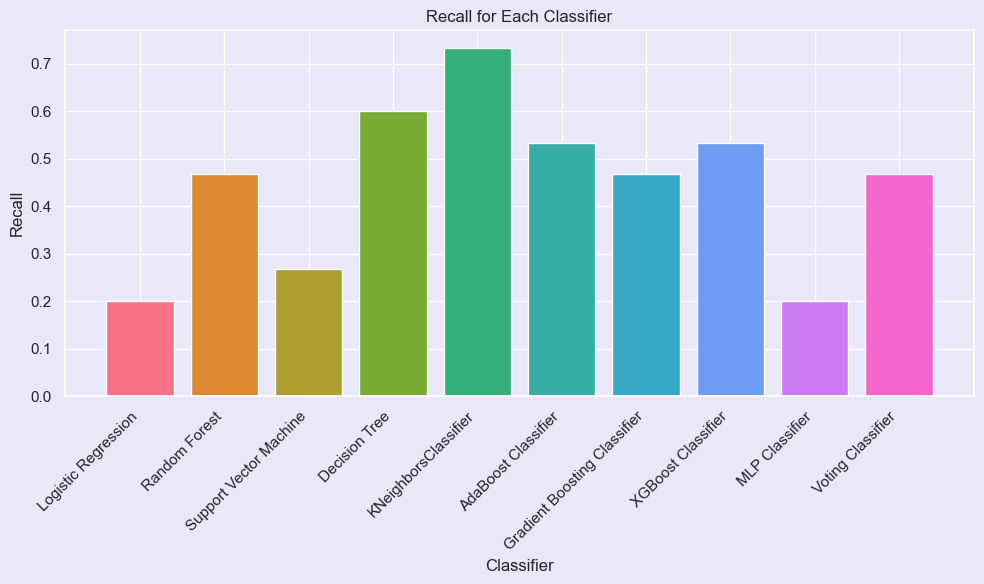

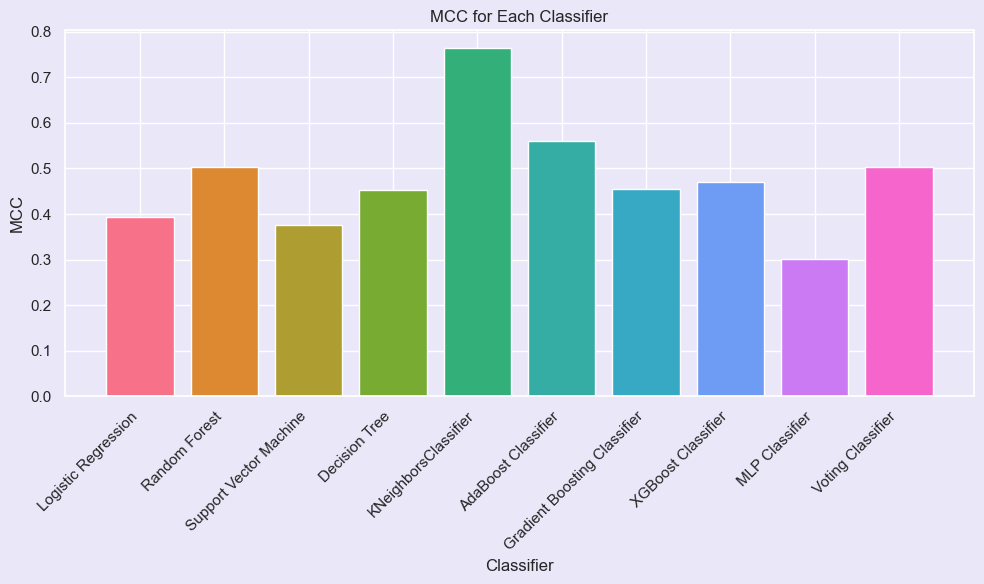

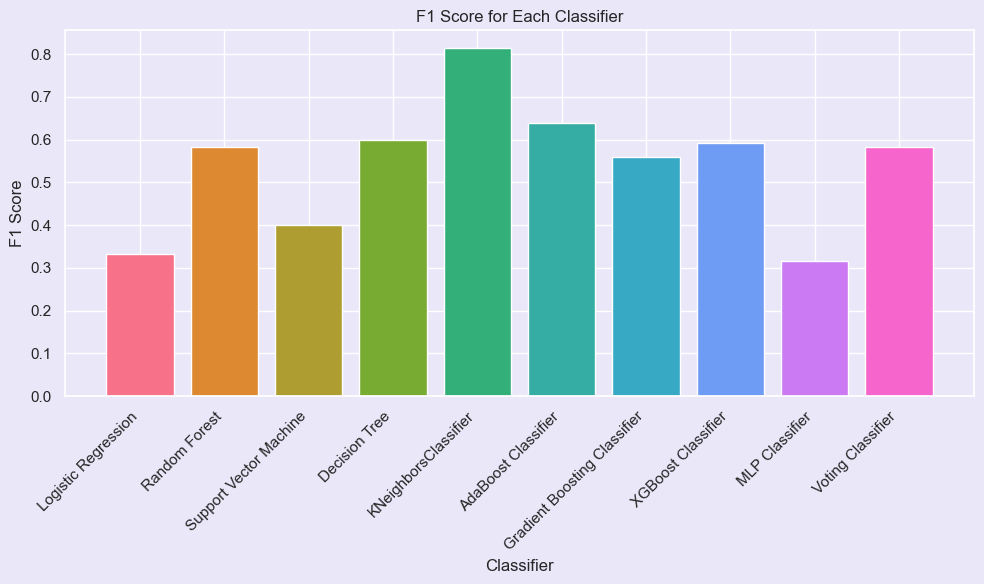

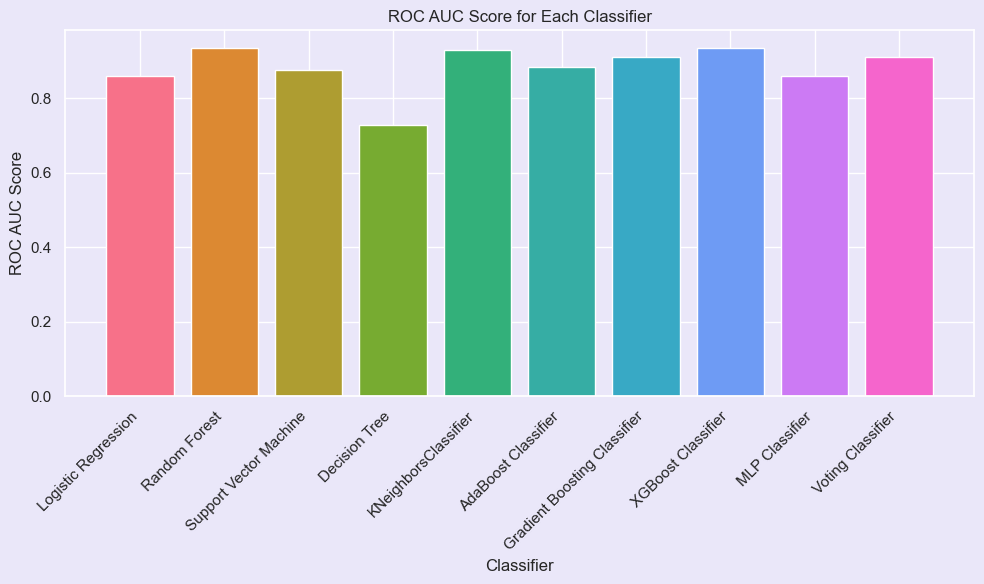

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a color palette for the classifiers
classifier_colors = sns.color_palette("husl", len(classifiers))

# Function to plot performance metrics for each classifier
def plot_performance_metrics(metrics, metric_name):
    plt.figure(figsize=(10, 6))
    classifiers = list(metrics.keys())
    values = list(metrics.values())
    for i, classifier in enumerate(classifiers):
        plt.bar(classifier, values[i], color=classifier_colors[i])
    plt.xlabel('Classifier')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} for Each Classifier')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot performance metrics for each classifier
for metric_name, metric_values in combined_metrics.items():
    plot_performance_metrics({classifier: metric for classifier, metric in zip(classifiers.keys(), metric_values)}, metric_name)


# Recursive Feature Elimination based on Random Forest (RFE-RF) Test

In [87]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

In [88]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']

In [89]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE

def rfe_rf_feature_selection(data, target_column, num_features):
    # Split data into features and target
#     X = data.drop(columns=[target_column])
#     y = data[target_column]
    
    # Create a Random Forest classifier
    rf = RandomForestClassifier()
    
    # Initialize RFE
    rfe = RFE(estimator=rf, n_features_to_select=num_features)
    
    # Fit RFE
    rfe.fit(X, y)
    
    # Get selected features
    selected_features = X.columns[rfe.support_].tolist()
    
    return selected_features

# Example usage
# Assuming 'data' is your pandas DataFrame and 'target_column' is the name of the target column
# num_features is the number of features you want to select
selected_features = rfe_rf_feature_selection(data, target_column='target', num_features=5)
print("Selected features:", selected_features)


Selected features: ['Pregnancies', 'Glucose', 'BMI', 'DiabetesPedigreeFunction', 'Age']


In [90]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

# List of columns to drop
#columns_to_drop = ['SkinThickness', 'Insulin', 'BMI']
#columns_to_drop = ['SkinThicknesDiabetesPedigreeFunctions', 'DiabetesPedigreeFunction', 'Age', 'BloodPressure']
columns_to_drop = ['BloodPressure', 'SkinThickness', 'Insulin'] # 5 features
# columns_to_drop = ['SkinThickness', 'Insulin'] # 6 features

# Drop columns
df.drop(columns_to_drop, axis=1, inplace=True)
#df.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final1.csv")
df.head()
#print(df)

,Pregnancies,Glucose,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.314928,0.234415,0.483333,1
1,0.058824,0.264516,0.171779,0.116567,0.166667,0
3,0.058824,0.290323,0.202454,0.038002,0.000000,0
5,0.294118,0.464516,0.151329,0.052519,0.150000,0
7,0.588235,0.458065,0.349693,0.023911,0.133333,0



Train size: 0.9, Test size: 0.1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.79            1.00       0.20       0.39       0.33       0.86           
Random Forest                  1.00            0.84            0.88       0.47       0.56       0.61       0.93           
Support Vector Machine         0.86            0.79            0.80       0.27       0.38       0.40       0.88           
Decision Tree                  1.00            0.75            0.53       0.53       0.36       0.53       0.68           
KNeighborsClassifier           0.90            0.91            0.92       0.73       0.77       0.81       0.93           
AdaBoost Classifier            0.91            0.84            0.80       0.53       0.56       0.64       0.88           
Gradient Boosting Classifier   0.96            0.80            0.70       0.47       0.45       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.80            0.91       0.32       0.47       0.48       0.88           
Random Forest                  1.00            0.83            0.83       0.48       0.54       0.61       0.93           
Support Vector Machine         0.86            0.81            0.78       0.45       0.49       0.57       0.91           
Decision Tree                  1.00            0.79            0.65       0.55       0.46       0.60       0.72           
KNeighborsClassifier           0.90            0.89            0.88       0.71       0.72       0.79       0.96           
AdaBoost Classifier            0.93            0.81            0.73       0.52       0.50       0.60       0.88           
Gradient Boosting Classifier   0.97            0.84            0.81       0.55       0.57       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.81            0.86       0.38       0.49       0.53       0.90           
Random Forest                  1.00            0.84            0.81       0.55       0.57       0.66       0.93           
Support Vector Machine         0.85            0.83            0.91       0.45       0.56       0.60       0.92           
Decision Tree                  1.00            0.78            0.67       0.47       0.43       0.55       0.69           
KNeighborsClassifier           0.91            0.87            0.82       0.68       0.66       0.74       0.93           
AdaBoost Classifier            0.93            0.80            0.67       0.60       0.50       0.63       0.86           
Gradient Boosting Classifier   0.98            0.84            0.86       0.53       0.59       0.

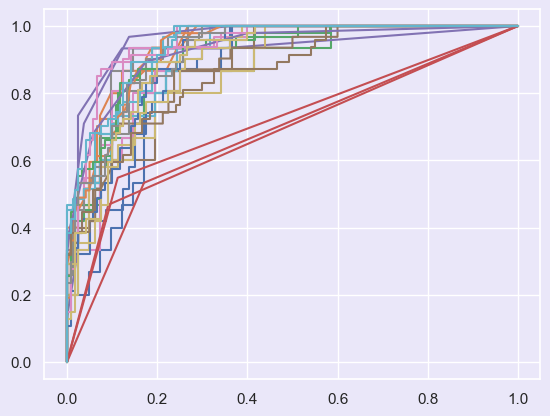

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()  # Initialize MLP classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')


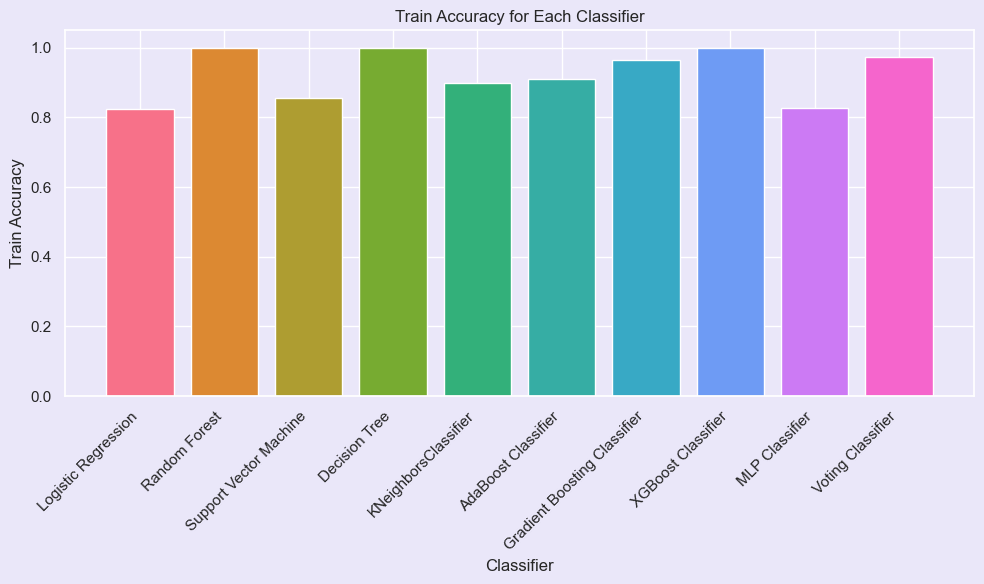

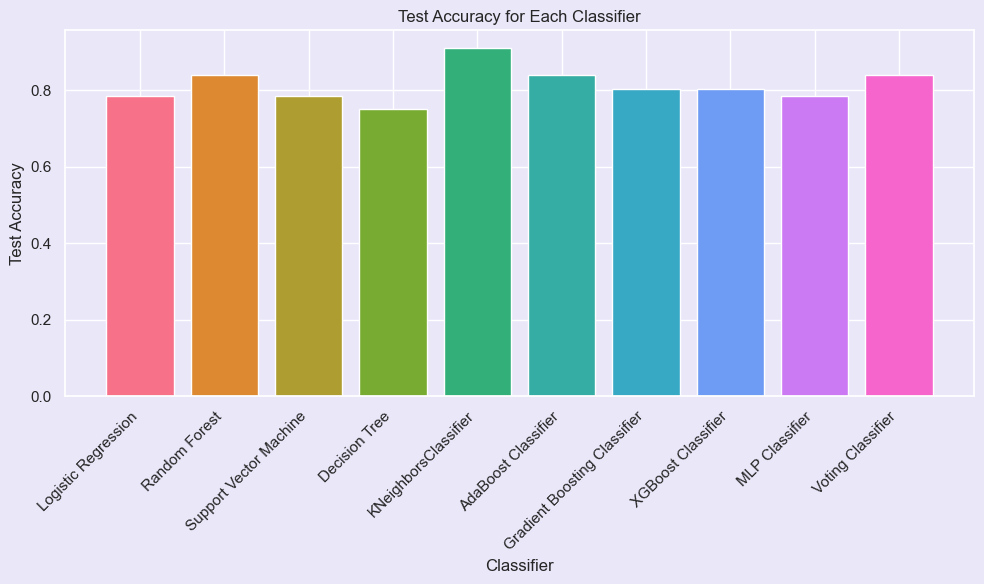

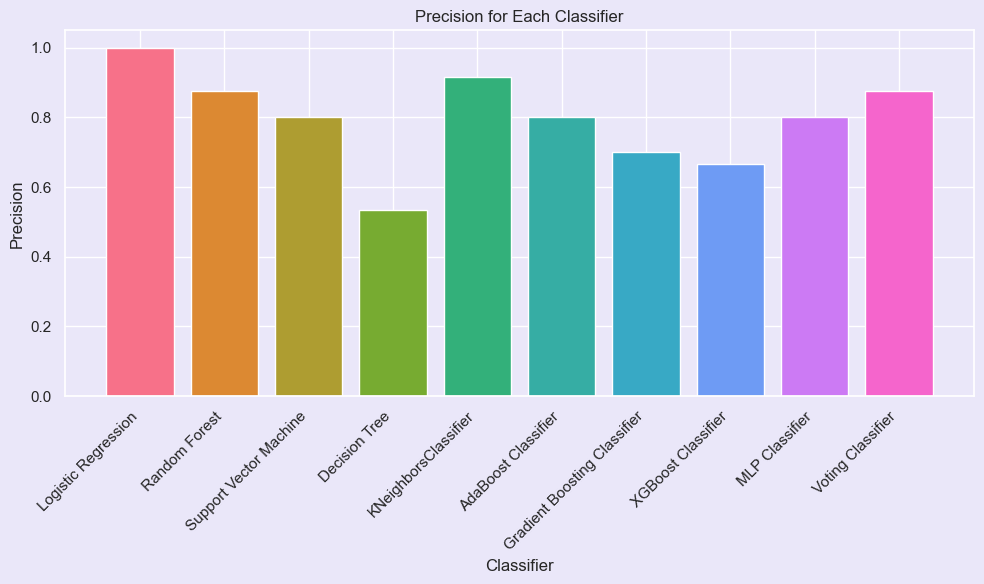

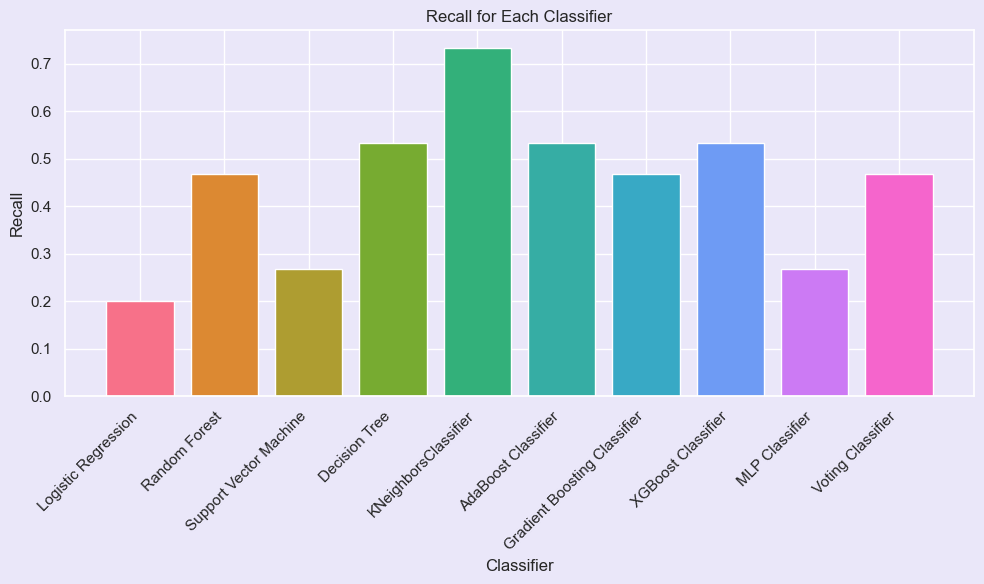

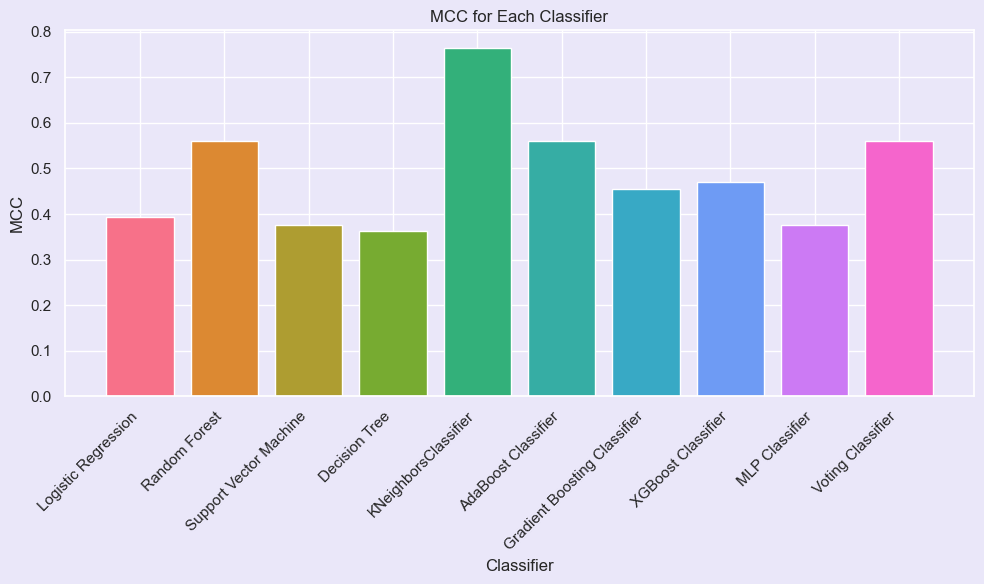

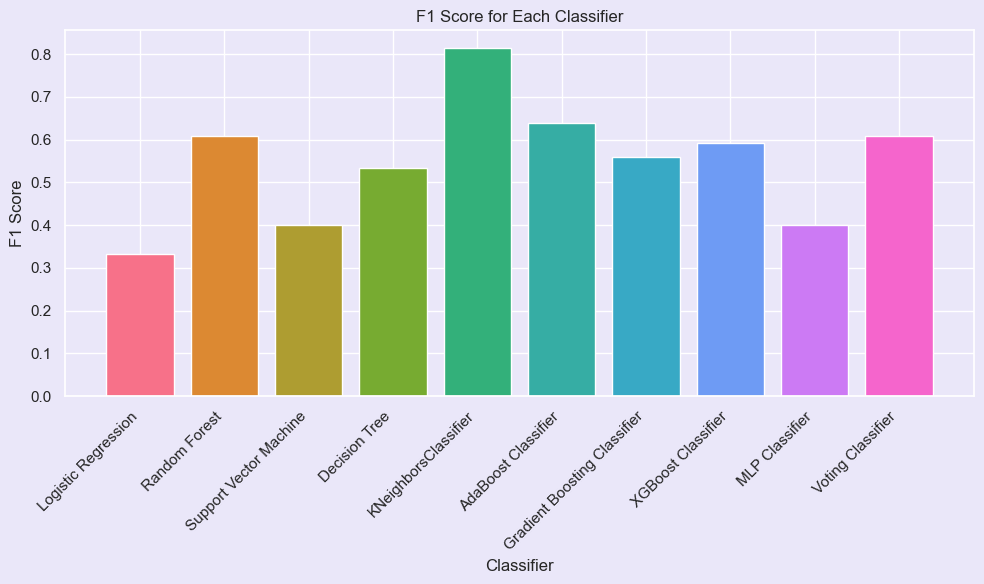

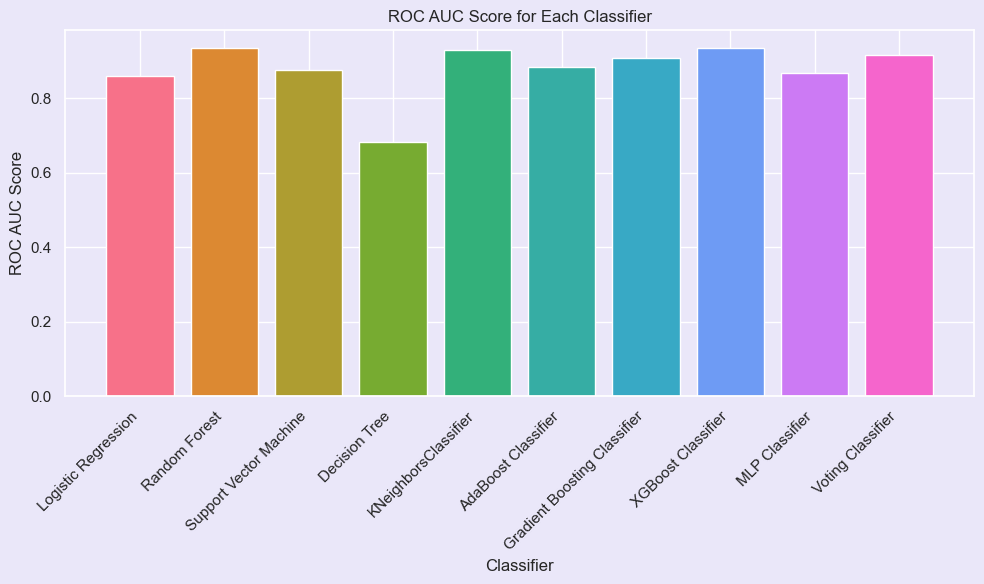

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a color palette for the classifiers
classifier_colors = sns.color_palette("husl", len(classifiers))

# Function to plot performance metrics for each classifier
def plot_performance_metrics(metrics, metric_name):
    plt.figure(figsize=(10, 6))
    classifiers = list(metrics.keys())
    values = list(metrics.values())
    for i, classifier in enumerate(classifiers):
        plt.bar(classifier, values[i], color=classifier_colors[i])
    plt.xlabel('Classifier')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} for Each Classifier')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot performance metrics for each classifier
for metric_name, metric_values in combined_metrics.items():
    plot_performance_metrics({classifier: metric for classifier, metric in zip(classifiers.keys(), metric_values)}, metric_name)


# Lasso Regression Feature Selection

In [93]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

In [94]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']

In [95]:
import pandas as pd
from sklearn.linear_model import Lasso

def lasso_top_features(data, target_column, alpha=1.0, top_n=6):
    # Split data into features and target
#     X = data.drop(columns=[target_column])
#     y = data[target_column]
    
    # Create a Lasso Regression model
    lasso = Lasso(alpha=alpha, max_iter=10000)
    
    # Fit the model
    lasso.fit(X, y)
    
    # Get the absolute coefficients
    coef_abs = abs(lasso.coef_)
    
    # Get indices of top_n features
    top_indices = coef_abs.argsort()[-top_n:][::-1]
    
    # Get the names of top_n features
    selected_features = X.columns[top_indices].tolist()
    
    return selected_features

# Example usage
# Assuming 'data' is your pandas DataFrame and 'target_column' is the name of the target column
selected_features = lasso_top_features(data, target_column='target', alpha=0.1, top_n=5)
print("Top 6 features:", selected_features)


Top 6 features: ['Age', 'DiabetesPedigreeFunction', 'BMI', 'Insulin', 'SkinThickness']


In [96]:
# Create a sample dataframe
data = dataset_Final
df = pd.DataFrame(data)

# List of columns to drop
#columns_to_drop = ['SkinThickness', 'Insulin', 'BMI']
#columns_to_drop = ['SkinThickness', 'DiabetesPedigreeFunction', 'Age', 'BloodPressure']
# columns_to_drop = ['Pregnancies', 'Glucose'] 
columns_to_drop = ['Pregnancies', 'Glucose','BloodPressure'] 
# Drop columns
df.drop(columns_to_drop, axis=1, inplace=True)
df.to_csv("I:\Masters in Jagannath University\Thesis\Datasets/dataset_Final1.csv")
df.head()
#print(df)

,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.304348,0.169998,0.314928,0.234415,0.483333,1
1,0.239130,0.169998,0.171779,0.116567,0.166667,0
3,0.173913,0.096154,0.202454,0.038002,0.000000,0
5,0.240712,0.169998,0.151329,0.052519,0.150000,0
7,0.240712,0.169998,0.349693,0.023911,0.133333,0



Train size: 0.9, Test size: 0.1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.79            1.00       0.20       0.39       0.33       0.86           
Random Forest                  1.00            0.89            1.00       0.60       0.72       0.75       0.93           
Support Vector Machine         0.86            0.79            0.80       0.27       0.38       0.40       0.88           
Decision Tree                  1.00            0.80            0.62       0.67       0.51       0.65       0.76           
KNeighborsClassifier           0.90            0.91            0.92       0.73       0.77       0.81       0.93           
AdaBoost Classifier            0.91            0.84            0.80       0.53       0.56       0.64       0.88           
Gradient Boosting Classifier   0.96            0.80            0.70       0.47       0.45       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.80            0.91       0.32       0.47       0.48       0.88           
Random Forest                  1.00            0.84            0.81       0.55       0.57       0.65       0.92           
Support Vector Machine         0.86            0.81            0.78       0.45       0.49       0.57       0.91           
Decision Tree                  1.00            0.77            0.62       0.52       0.41       0.56       0.70           
KNeighborsClassifier           0.90            0.89            0.88       0.71       0.72       0.79       0.96           
AdaBoost Classifier            0.93            0.81            0.73       0.52       0.50       0.60       0.88           
Gradient Boosting Classifier   0.97            0.84            0.81       0.55       0.57       0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.83            0.81            0.86       0.38       0.49       0.53       0.90           
Random Forest                  1.00            0.83            0.81       0.53       0.56       0.64       0.92           
Support Vector Machine         0.85            0.83            0.91       0.45       0.56       0.60       0.92           
Decision Tree                  1.00            0.79            0.68       0.49       0.44       0.57       0.70           
KNeighborsClassifier           0.91            0.87            0.82       0.68       0.66       0.74       0.93           
AdaBoost Classifier            0.93            0.80            0.67       0.60       0.50       0.63       0.86           
Gradient Boosting Classifier   0.97            0.86            0.90       0.57       0.64       0.

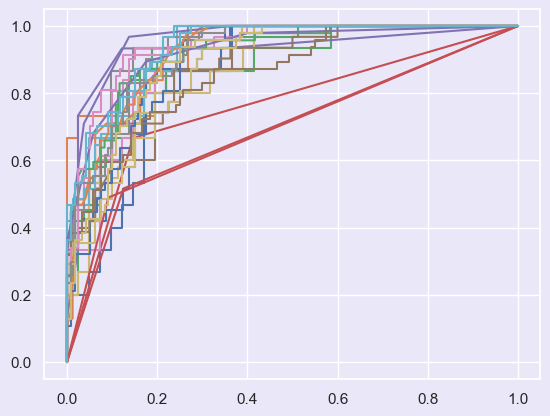

In [97]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier  # Import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
mlp = MLPClassifier()  # Initialize MLP classifier

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb), ('mlp', mlp)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 'MLP Classifier': mlp,
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')


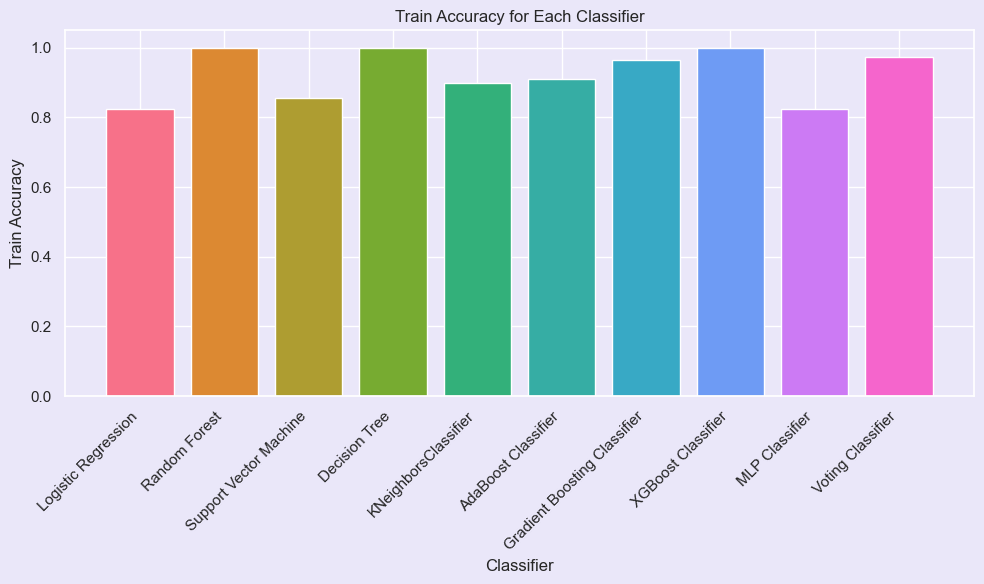

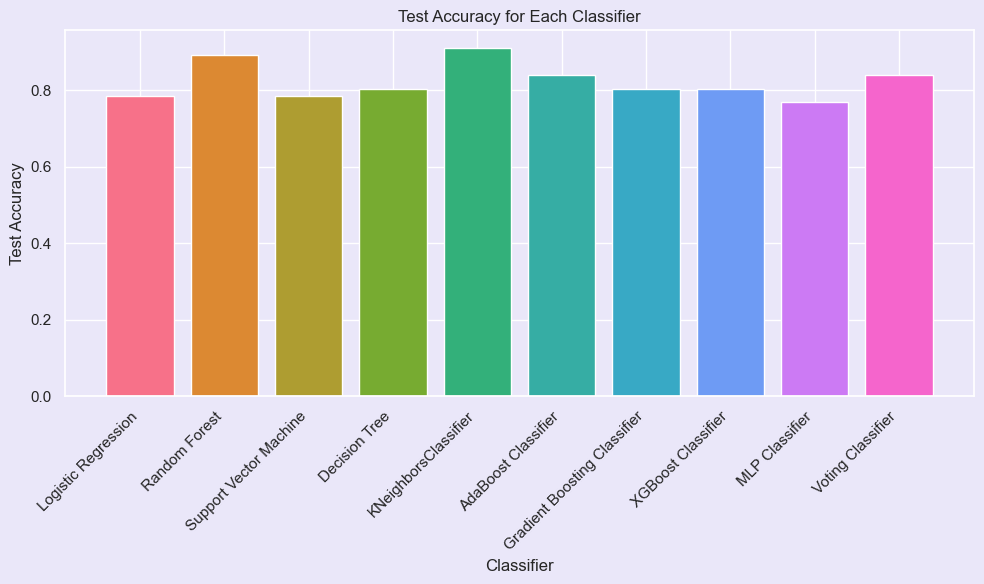

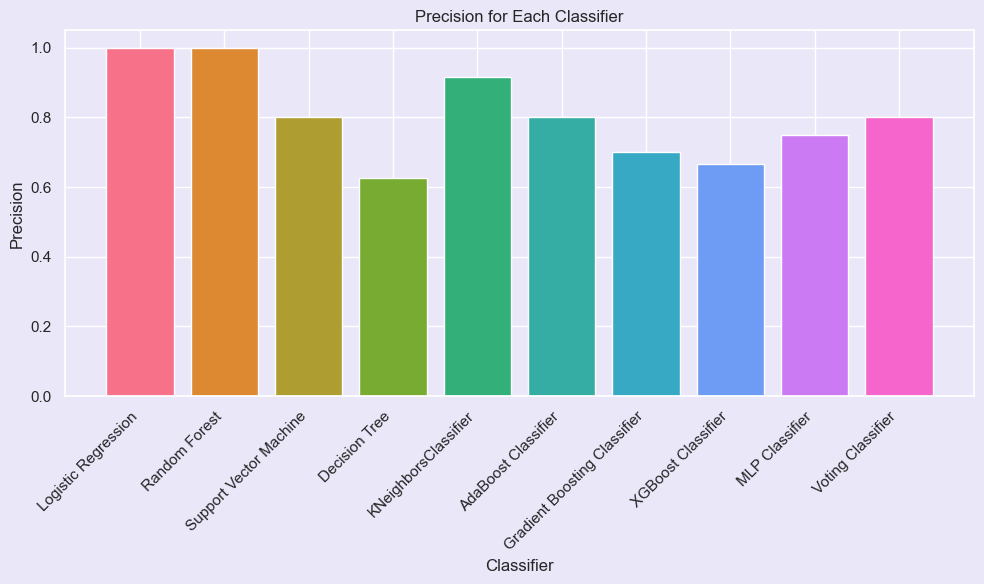

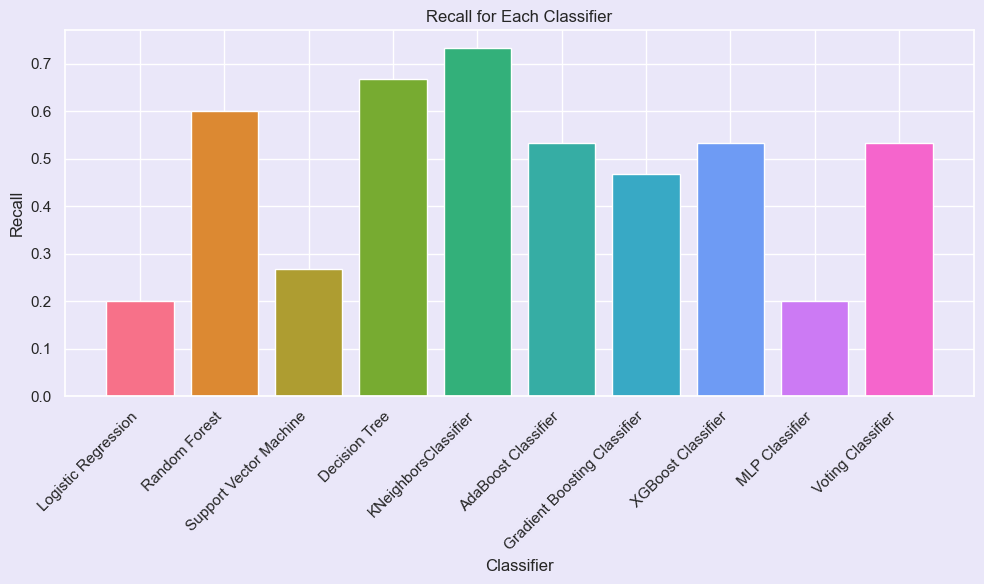

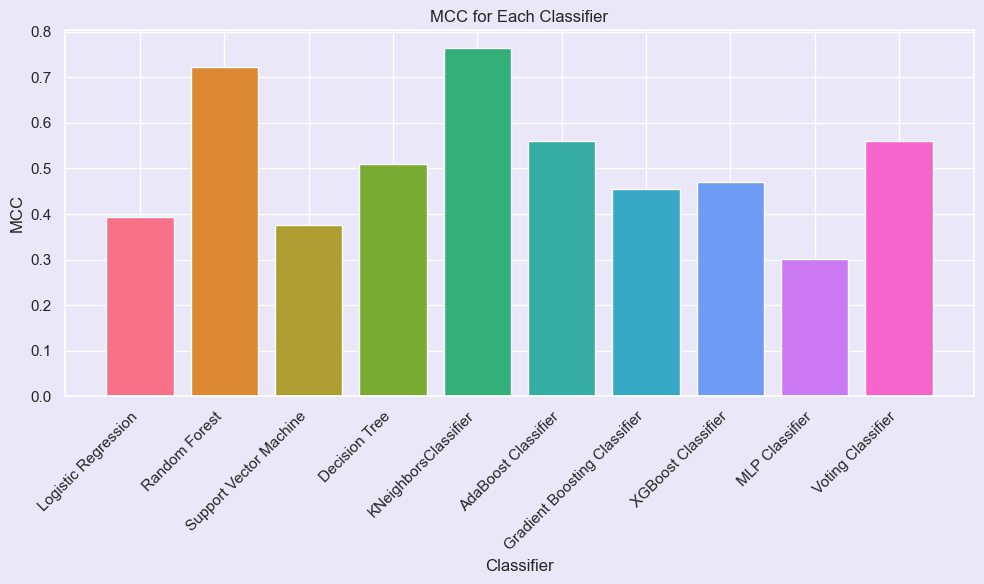

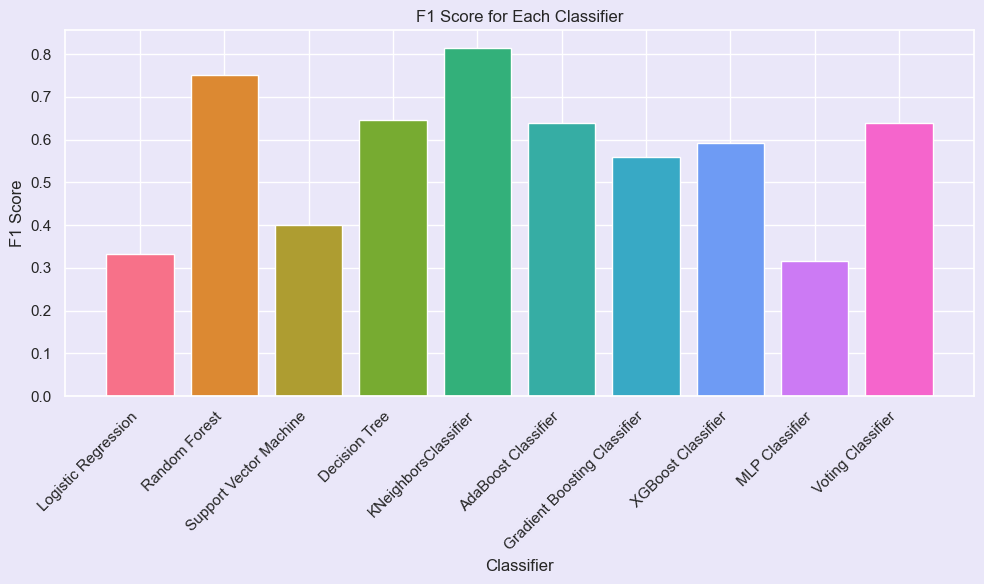

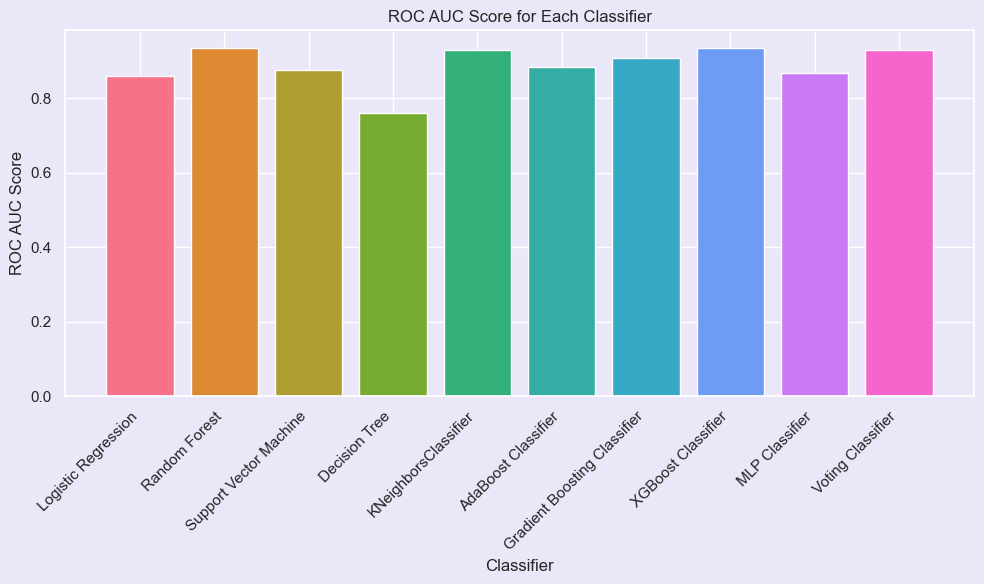

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a color palette for the classifiers
classifier_colors = sns.color_palette("husl", len(classifiers))

# Function to plot performance metrics for each classifier
def plot_performance_metrics(metrics, metric_name):
    plt.figure(figsize=(10, 6))
    classifiers = list(metrics.keys())
    values = list(metrics.values())
    for i, classifier in enumerate(classifiers):
        plt.bar(classifier, values[i], color=classifier_colors[i])
    plt.xlabel('Classifier')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} for Each Classifier')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot performance metrics for each classifier
for metric_name, metric_values in combined_metrics.items():
    plot_performance_metrics({classifier: metric for classifier, metric in zip(classifiers.keys(), metric_values)}, metric_name)


# Get `input` and `target` columns

In [99]:
#X = df_Non_Outlier.drop('Outcome', axis = 1)
X = df.drop('Outcome', axis = 1)
y = df['Outcome']

In [100]:
X.dtypes

SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                         float64
dtype: object

# Splitting data for the Training and Testing part 


Train size: 0.9, Test size: 0.1
Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.74            0.70            0.25       0.07       -0.01      0.11       0.68           
Random Forest                  1.00            0.77            0.62       0.33       0.33       0.43       0.87           
Support Vector Machine         0.83            0.77            0.62       0.33       0.33       0.43       0.75           
Decision Tree                  1.00            0.79            0.60       0.60       0.45       0.60       0.73           
KNeighborsClassifier           0.83            0.79            0.64       0.47       0.41       0.54       0.73           
AdaBoost Classifier            0.85            0.79            0.64       0.47       0.41       0.54       0.80           
Gradient Boosting Classifier   0.91            0.79            0.

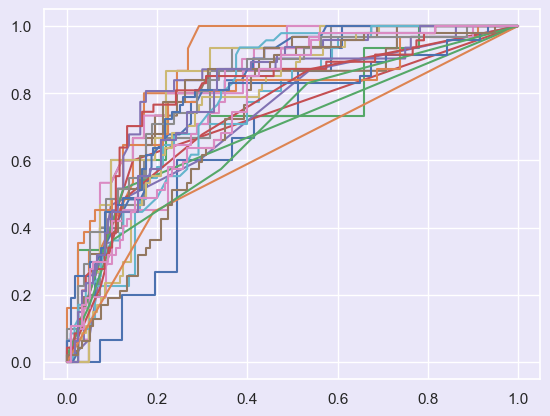

In [101]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Initialize confusion matrix and ROC curve
cm_combined = np.zeros((2, 2))
fpr_combined = []
tpr_combined = []
roc_auc_combined = []

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    global cm_combined
    cm_combined += cm
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.close()

     
# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    global fpr_combined, tpr_combined, roc_auc_combined
    fpr_combined.append(fpr)
    tpr_combined.append(tpr)
    roc_auc_combined.append(roc_auc)
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\n\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot combined ROC curve
    plt.figure()
    for fpr, tpr, roc_auc, name in zip(fpr_combined, tpr_combined, roc_auc_combined, classifiers.keys()):
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Combined ROC Curve')
    plt.legend()
    plt.close()
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))

# Combine confusion matrix and plot
print("\033[1m\nCombined Confusion Matrix\033[0m")
plot_confusion_matrix(cm_combined, 'All Classifiers')


Train size: 0.9, Test size: 0.1


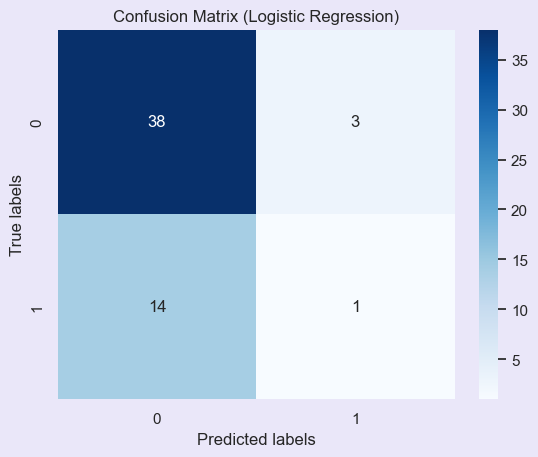

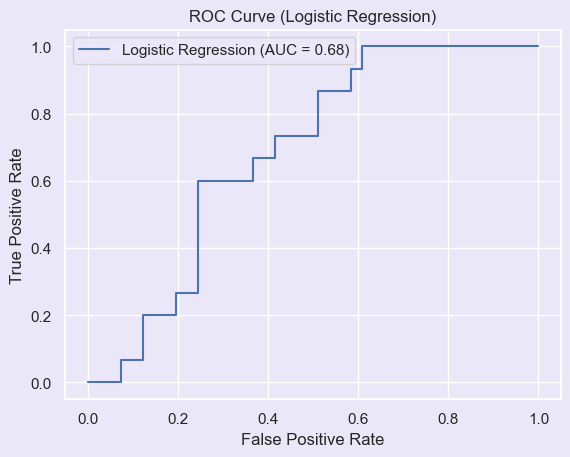

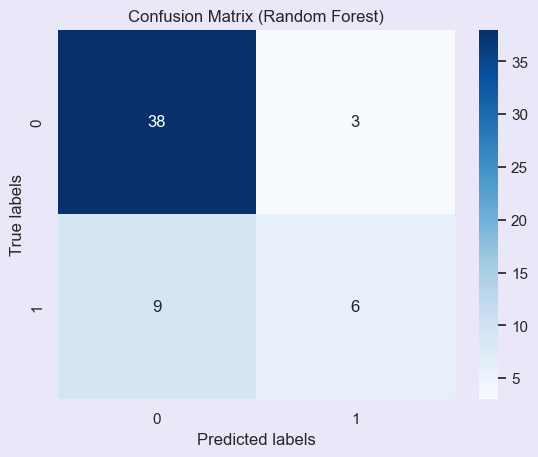

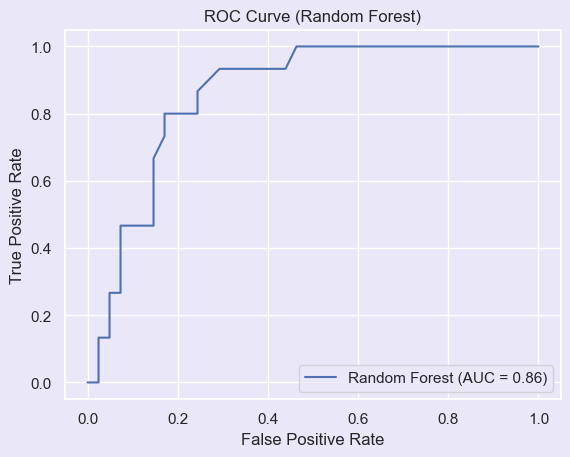

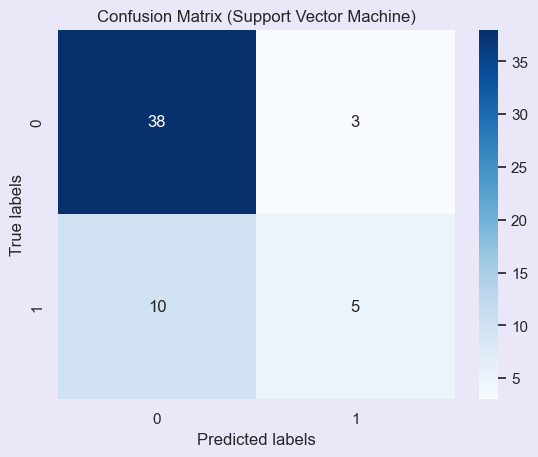

...

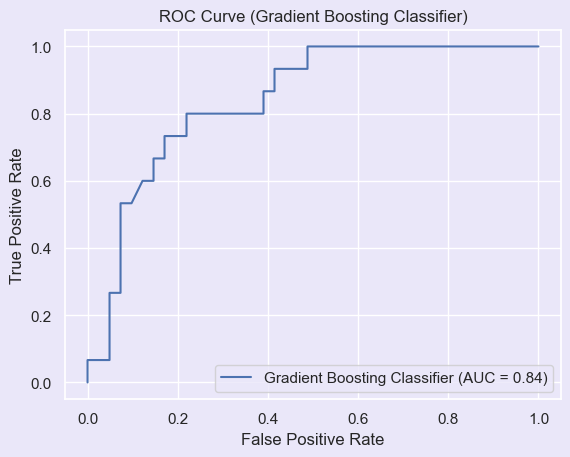

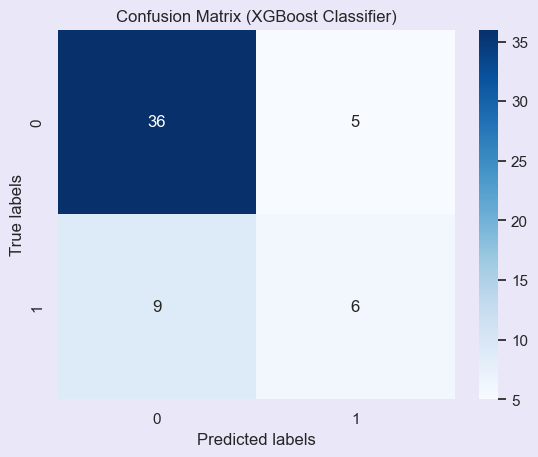

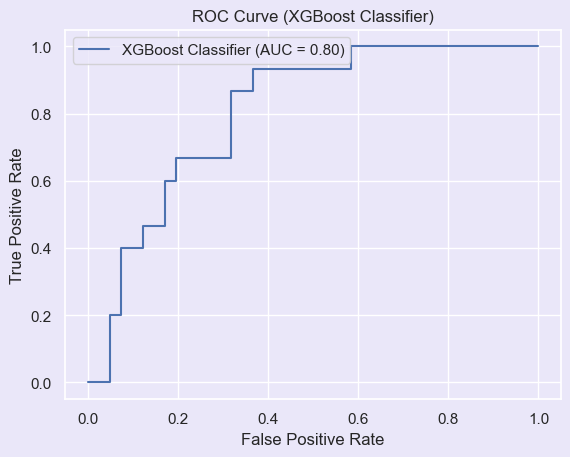

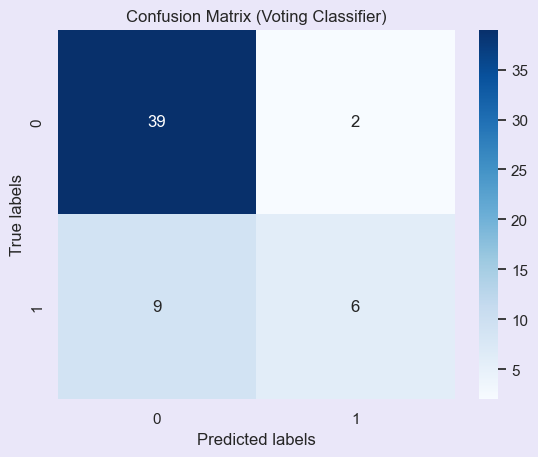

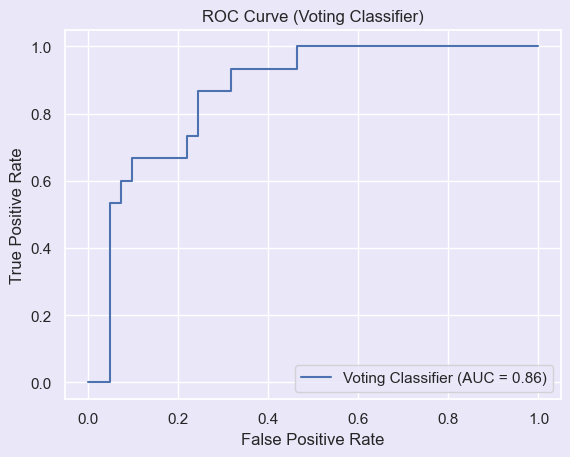

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.74            0.70            0.25       0.07       -0.01      0.11       0.68           
Random Forest                  1.00            0.79            0.67       0.40       0.39       0.50       0.86           
Support Vector Machine         0.83            0.77            0.62       0.33       0.33       0.43       0.75           
Decision Tree                  1.00            0.79            0.62       0.53       0.43       0.57       0.71           
KNeighborsClassifier           0.83            0.79            0.64       0.47       0.41       0.54       0.73           
AdaBoost Classifier            0.85            0.79            0.64       0.47       0.41       0.54       0.80           
Gradient Boosting Classifier   0.91            0.79            0.67       0.40       0.39       0.

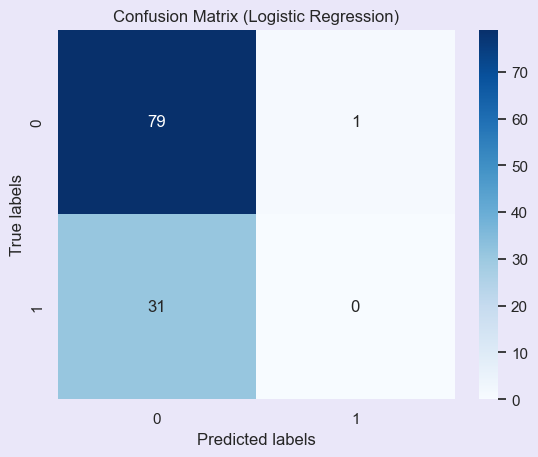

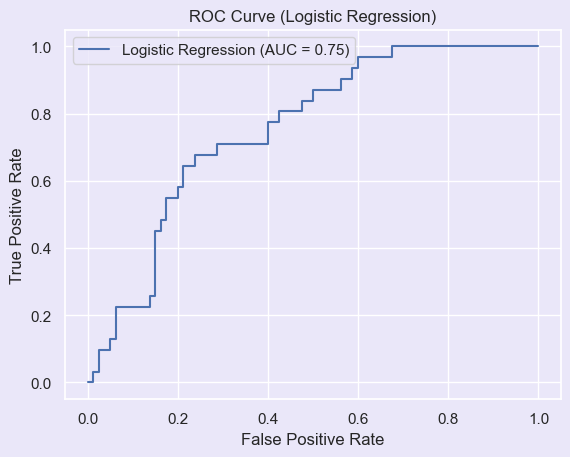

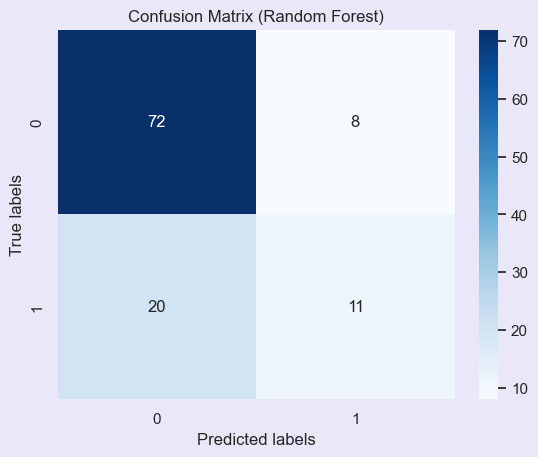

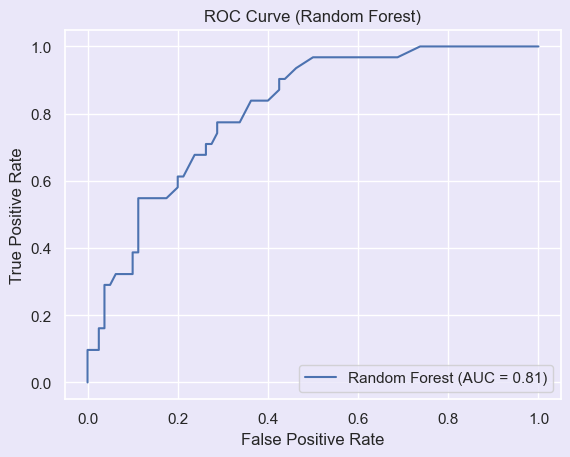

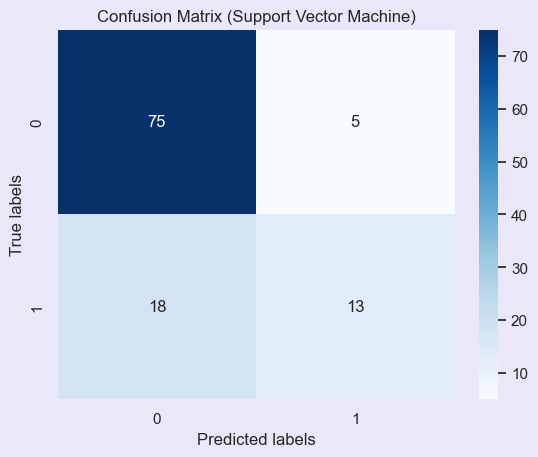

...

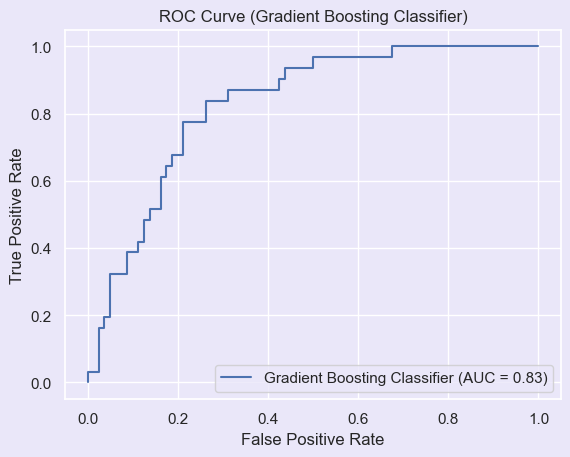

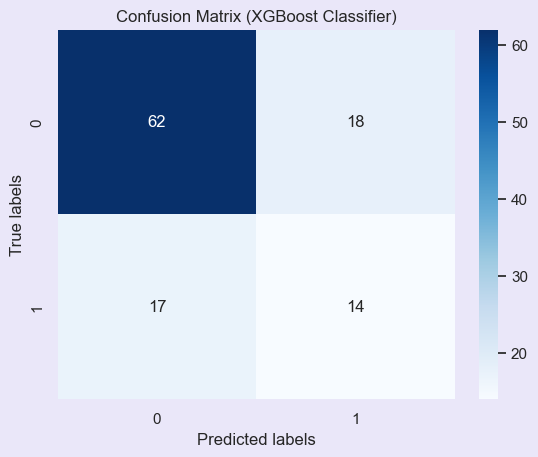

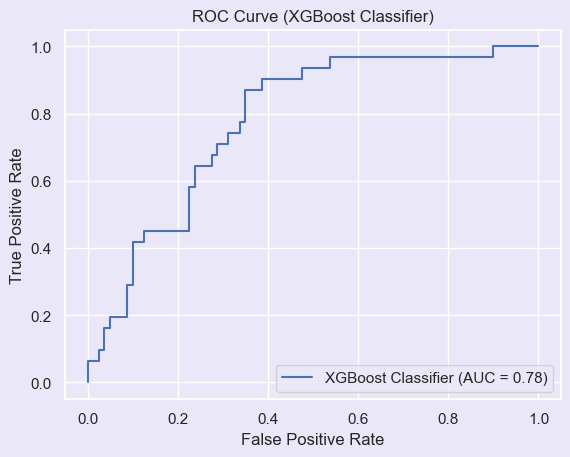

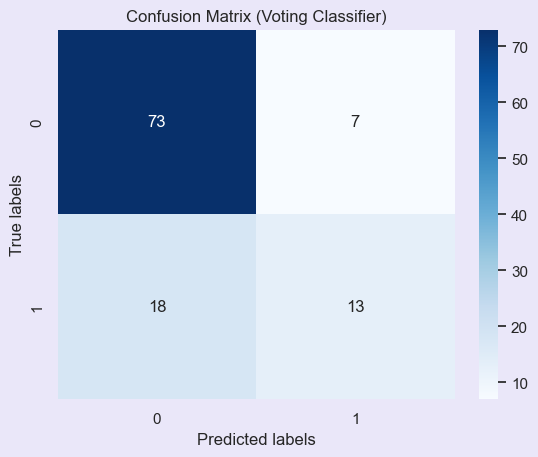

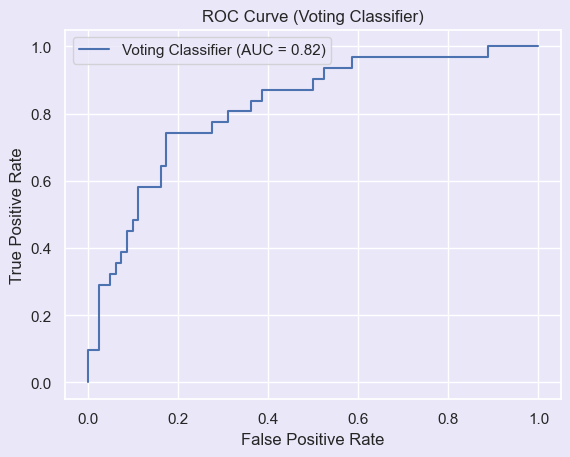

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.76            0.71            0.00       0.00       -0.06      0.00       0.75           
Random Forest                  1.00            0.75            0.58       0.35       0.30       0.44       0.81           
Support Vector Machine         0.82            0.79            0.72       0.42       0.43       0.53       0.79           
Decision Tree                  1.00            0.75            0.55       0.52       0.36       0.53       0.68           
KNeighborsClassifier           0.84            0.77            0.60       0.48       0.39       0.54       0.74           
AdaBoost Classifier            0.86            0.78            0.63       0.55       0.44       0.59       0.82           
Gradient Boosting Classifier   0.94            0.77            0.59       0.52       0.40       0.

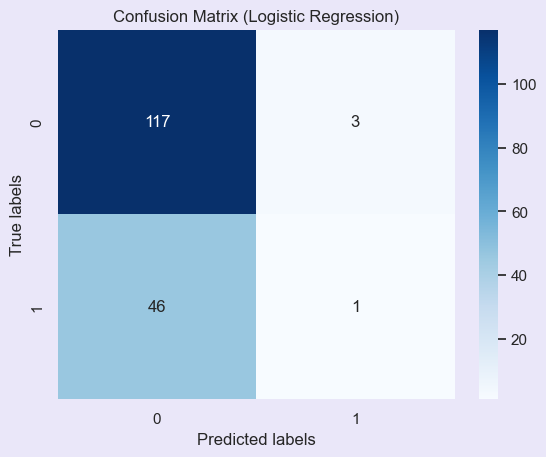

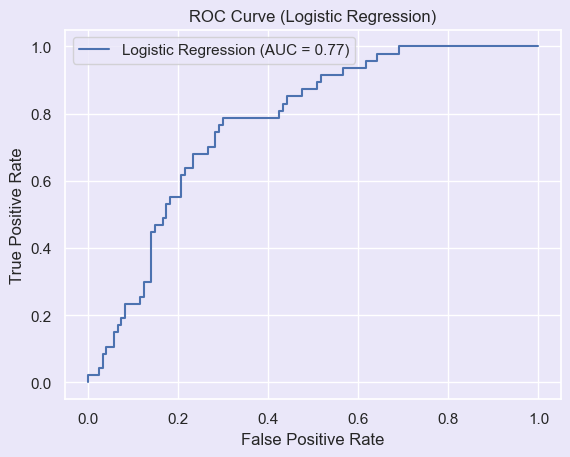

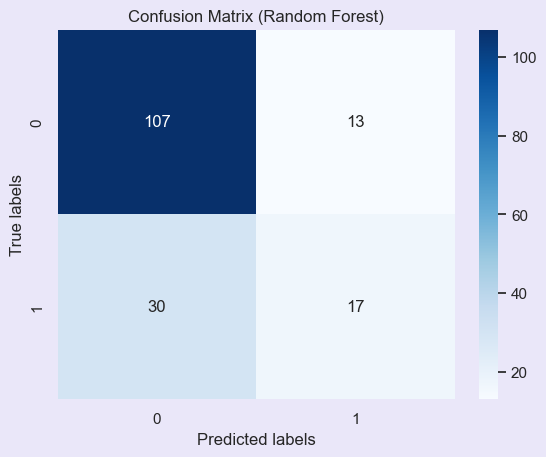

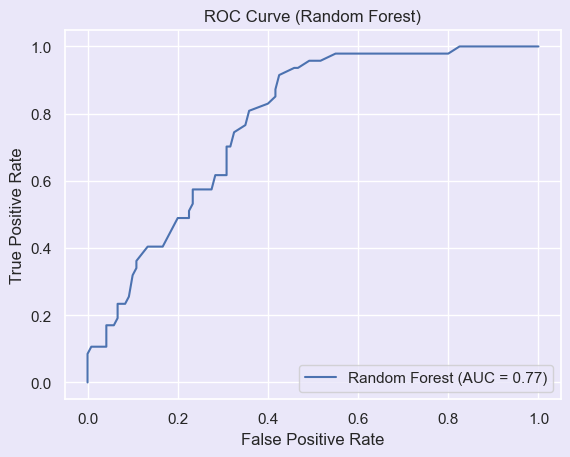

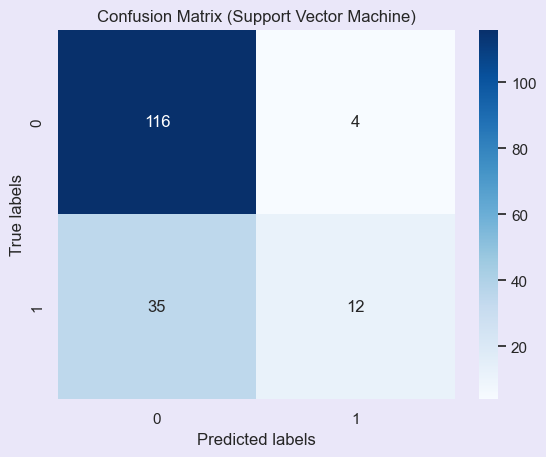

...

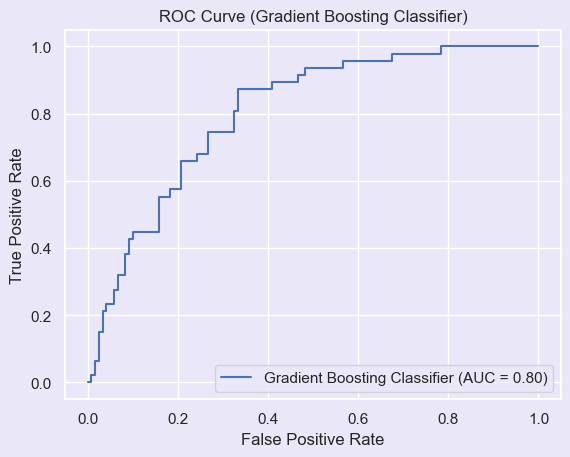

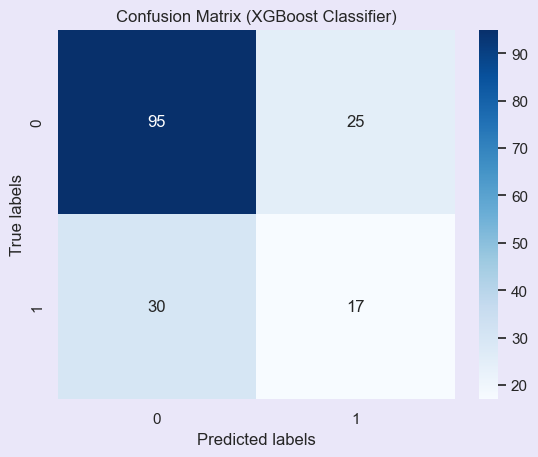

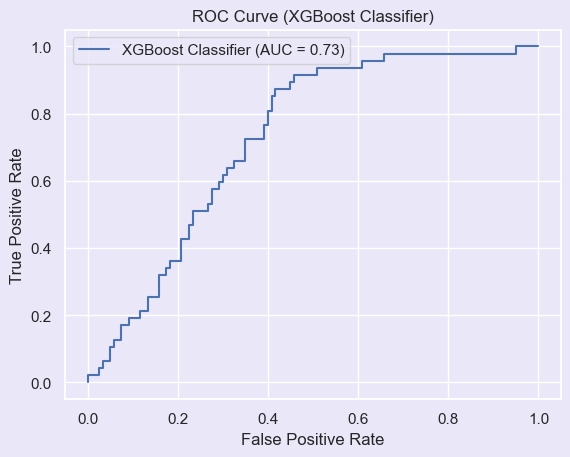

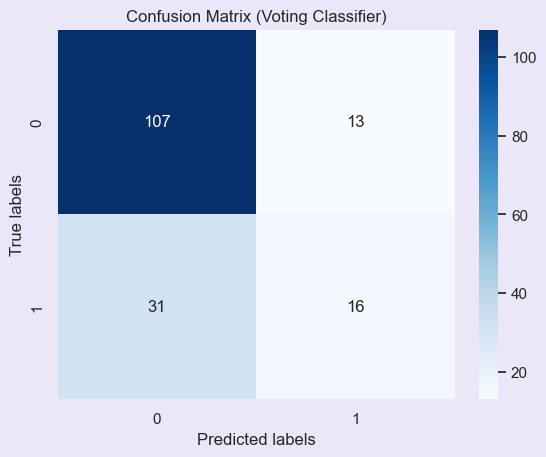

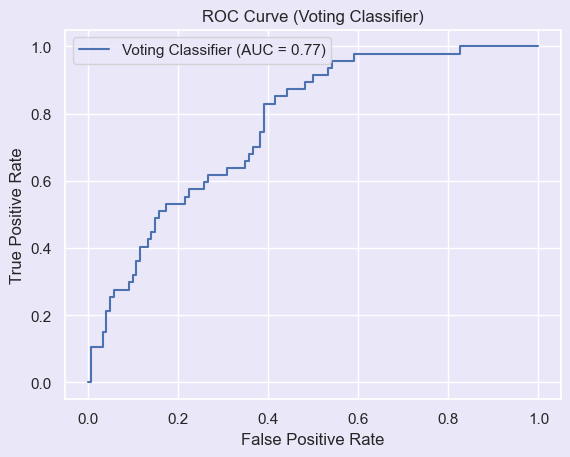

Performance metrics for each classifier:
Classifier                     Train Accuracy  Test Accuracy   Precision  Recall     MCC        F1 Score   ROC AUC Score  
Logistic Regression            0.76            0.71            0.25       0.02       -0.01      0.04       0.77           
Random Forest                  1.00            0.74            0.57       0.36       0.30       0.44       0.77           
Support Vector Machine         0.82            0.77            0.75       0.26       0.34       0.38       0.77           
Decision Tree                  1.00            0.71            0.49       0.45       0.27       0.47       0.63           
KNeighborsClassifier           0.84            0.75            0.59       0.36       0.31       0.45       0.69           
AdaBoost Classifier            0.86            0.80            0.67       0.60       0.50       0.63       0.81           
Gradient Boosting Classifier   0.95            0.77            0.64       0.45       0.39       0.

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, matthews_corrcoef

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 
               'Voting Classifier': voting}

# Initialize lists to store combined performance metrics
combined_metrics = {'Train Accuracy': [], 'Test Accuracy': [], 'Precision': [], 'Recall': [], 'MCC': [], 'F1 Score': [], 'ROC AUC Score': []}

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')
    plt.show()

# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({classifier_name})')
    plt.legend()
    plt.show()

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        mcc = matthews_corrcoef(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, mcc, f1, roc_auc))
        
        # Combine performance metrics
        combined_metrics['Train Accuracy'].append(accuracy_train)
        combined_metrics['Test Accuracy'].append(accuracy_test)
        combined_metrics['Precision'].append(precision)
        combined_metrics['Recall'].append(recall)
        combined_metrics['MCC'].append(mcc)
        combined_metrics['F1 Score'].append(f1)
        combined_metrics['ROC AUC Score'].append(roc_auc)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Print results
    print("\033[1mPerformance metrics for each classifier:\033[0m")
    print("{:<30} {:<15} {:<15} {:<10} {:<10} {:<10} {:<10} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "MCC", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<10.2f} {:<15.2f}".format(*result))


# 1. Training Part 90 % and Testing Part 10%

In [103]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.8
test_size = 0.2

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Define train-test split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, train_size=0.9, random_state=42)

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Train classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Dictionary to store performance metrics
performance_metrics = {}

# Iterate over classifiers
for name, clf in classifiers.items():
    # Train the classifier
    clf.fit(X_train, y_train)
    
    # Predictions
    y_pred = clf.predict(X_test)
    y_pred_prob = clf.predict_proba(X_test)[:, 1]

    # Performance metrics
    accuracy_train = clf.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve - {}'.format(name))
    plt.legend(loc="lower right")
    plt.close()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix - {}".format(name))
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()

    # Store performance metrics
    performance_metrics[name] = {
        "Training Accuracy": "{:.2f} %".format(accuracy_train * 100),
        "Testing Accuracy": "{:.2f} %".format(accuracy_test * 100),
        "Precision": "{:.2f} %".format(precision * 100),
        "Recall": "{:.2f} %".format(recall * 100),
        "F1 Score": "{:.2f} %".format(f1 * 100),
        "ROC AUC Score": "{:.2f} %".format(roc_auc * 100)
    }

# Print performance metrics in bold
for name, metrics in performance_metrics.items():
    print(f"\033[1mPerformance metrics (Training Part 90 % and Testing Part 10 %) for {name}:\033[0m")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value}")
    print("\n")


Performance metrics (Training Part 90 % and Testing Part 10 %) for Logistic Regression:
Training Accuracy: 75.68 %
Testing Accuracy: 71.17 %
Precision: 0.00 %
Recall: 0.00 %
F1 Score: 0.00 %
ROC AUC Score: 75.40 %


Performance metrics (Training Part 90 % and Testing Part 10 %) for Random Forest:
Training Accuracy: 100.00 %
Testing Accuracy: 77.48 %
Precision: 62.50 %
Recall: 48.39 %
F1 Score: 54.55 %
ROC AUC Score: 82.20 %


Performance metrics (Training Part 90 % and Testing Part 10 %) for Decision Tree:
Training Accuracy: 100.00 %
Testing Accuracy: 72.97 %
Precision: 51.61 %
Recall: 51.61 %
F1 Score: 51.61 %
ROC AUC Score: 66.43 %


Performance metrics (Training Part 90 % and Testing Part 10 %) for KNeighborsClassifier:
Training Accuracy: 84.01 %
Testing Accuracy: 76.58 %
Precision: 60.00 %
Recall: 48.39 %
F1 Score: 53.57 %
ROC AUC Score: 74.44 %


Performance metrics (Training Part 90 % and Testing Part 10 %) for AdaBoost Classifier:
Training Accuracy: 85.59 %
Testing Accuracy: 78.

# 1. Training Part 90 % and Testing Part 10% (Support Vector Machine)

In [104]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.9
test_size = 0.1

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Initialize Support Vector Machine Classifier
svm_classifier = SVC()

# Fitting the SVM classifier to the training data
svm_classifier.fit(X_train, y_train)

# Predicting on the test data
y_pred = svm_classifier.predict(X_test)
y_pred_prob = svm_classifier.decision_function(X_test)

# Measuring performance
accuracy_train = svm_classifier.score(X_train, y_train)
accuracy_test = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plotting the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Support Vector Machine Classifier')
plt.legend(loc="lower right")
plt.close()

# Plotting confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Support Vector Machine Classifier")
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.close()

# Printing performance metrics
print("\033[1mPerformance metrics (Training Part 90 % and Testing Part 10%) for Support Vector Machine Classifier:\033[0m")
#print(f"\033[1mPerformance metrics (Training Part 90 % and Testing Part 10%) for Support Vector Machine Classifier: for {name}:\033[0m")
print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
print("Precision:", "{:.2f}%".format(precision * 100))
print("Recall:", "{:.2f}%".format(recall * 100))
print("F1 Score:", "{:.2f}%".format(f1 * 100))
print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))


Performance metrics (Training Part 90 % and Testing Part 10%) for Support Vector Machine Classifier:
Training Accuracy: 82.57%
Testing Accuracy: 76.79%
Precision: 62.50%
Recall: 33.33%
F1 Score: 43.48%
ROC AUC Score: 74.80%


# 2. Training Part 80 % and Testing Part 20%

In [105]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.8
test_size = 0.2

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Define train-test split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, train_size=0.9, random_state=42)

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Train classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Dictionary to store performance metrics
performance_metrics = {}

# Iterate over classifiers
for name, clf in classifiers.items():
    # Train the classifier
    clf.fit(X_train, y_train)
    
    # Predictions
    y_pred = clf.predict(X_test)
    y_pred_prob = clf.predict_proba(X_test)[:, 1]

    # Performance metrics
    accuracy_train = clf.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve - {}'.format(name))
    plt.legend(loc="lower right")
    plt.close()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix - {}".format(name))
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()

    # Store performance metrics
    performance_metrics[name] = {
        "Training Accuracy": "{:.2f} %".format(accuracy_train * 100),
        "Testing Accuracy": "{:.2f} %".format(accuracy_test * 100),
        "Precision": "{:.2f} %".format(precision * 100),
        "Recall": "{:.2f} %".format(recall * 100),
        "F1 Score": "{:.2f} %".format(f1 * 100),
        "ROC AUC Score": "{:.2f} %".format(roc_auc * 100)
    }

# Print performance metrics in bold
for name, metrics in performance_metrics.items():
    print(f"\033[1mPerformance metrics for {name}:\033[0m")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value}")
    print("\n")


Performance metrics for Logistic Regression:
Training Accuracy: 75.68 %
Testing Accuracy: 71.17 %
Precision: 0.00 %
Recall: 0.00 %
F1 Score: 0.00 %
ROC AUC Score: 75.40 %


Performance metrics for Random Forest:
Training Accuracy: 100.00 %
Testing Accuracy: 76.58 %
Precision: 61.90 %
Recall: 41.94 %
F1 Score: 50.00 %
ROC AUC Score: 80.65 %


Performance metrics for Decision Tree:
Training Accuracy: 100.00 %
Testing Accuracy: 76.58 %
Precision: 58.62 %
Recall: 54.84 %
F1 Score: 56.67 %
ROC AUC Score: 69.92 %


Performance metrics for KNeighborsClassifier:
Training Accuracy: 84.01 %
Testing Accuracy: 76.58 %
Precision: 60.00 %
Recall: 48.39 %
F1 Score: 53.57 %
ROC AUC Score: 74.44 %


Performance metrics for AdaBoost Classifier:
Training Accuracy: 85.59 %
Testing Accuracy: 78.38 %
Precision: 62.96 %
Recall: 54.84 %
F1 Score: 58.62 %
ROC AUC Score: 81.51 %


Performance metrics for Gradient Boosting Classifier:
Training Accuracy: 93.92 %
Testing Accuracy: 76.58 %
Precision: 59.26 %
Recall

# 2. Training Part 80 % and Testing Part 20% (Support Vector Machine)

In [106]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.8
test_size = 0.2

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Initialize Support Vector Machine Classifier
svm_classifier = SVC()

# Fitting the SVM classifier to the training data
svm_classifier.fit(X_train, y_train)

# Predicting on the test data
y_pred = svm_classifier.predict(X_test)
y_pred_prob = svm_classifier.decision_function(X_test)

# Measuring performance
accuracy_train = svm_classifier.score(X_train, y_train)
accuracy_test = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plotting the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Support Vector Machine Classifier')
plt.legend(loc="lower right")
plt.close()

# Plotting confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Support Vector Machine Classifier")
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.close()

# Printing performance metrics
print("\033[1mPerformance metrics (Training Part 80 % and Testing Part 20%) for Support Vector Machine Classifier:\033[0m")
#print("Performance metrics (Training Part 80 % and Testing Part 20%) for Support Vector Machine Classifier:")
print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
print("Precision:", "{:.2f}%".format(precision * 100))
print("Recall:", "{:.2f}%".format(recall * 100))
print("F1 Score:", "{:.2f}%".format(f1 * 100))
print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))


Performance metrics (Training Part 80 % and Testing Part 20%) for Support Vector Machine Classifier:
Training Accuracy: 82.43%
Testing Accuracy: 79.28%
Precision: 72.22%
Recall: 41.94%
F1 Score: 53.06%
ROC AUC Score: 79.44%


# 3. Training Part 70 % and Testing Part 30%

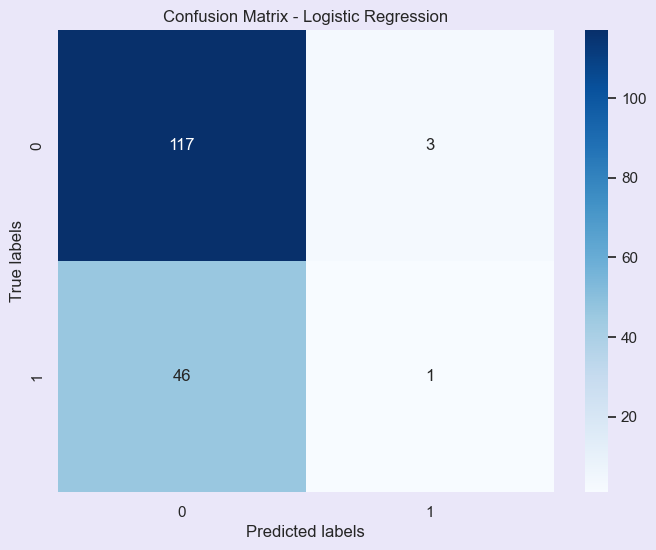

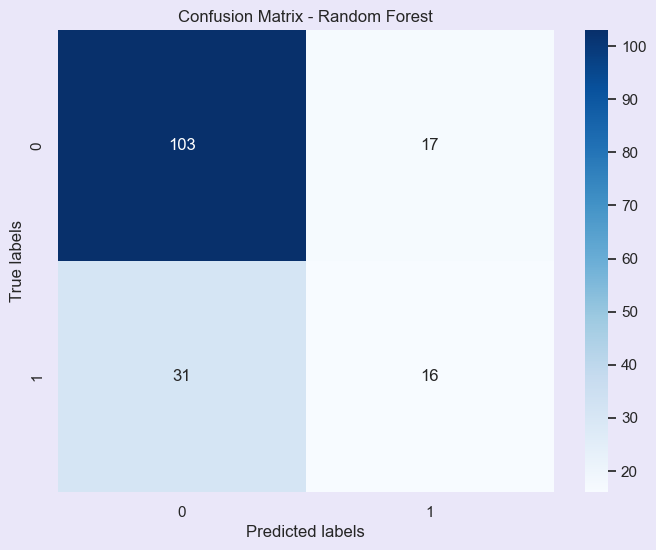

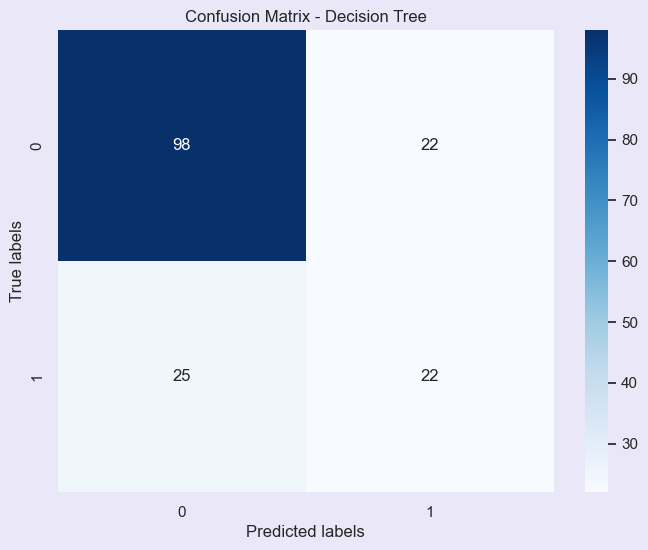

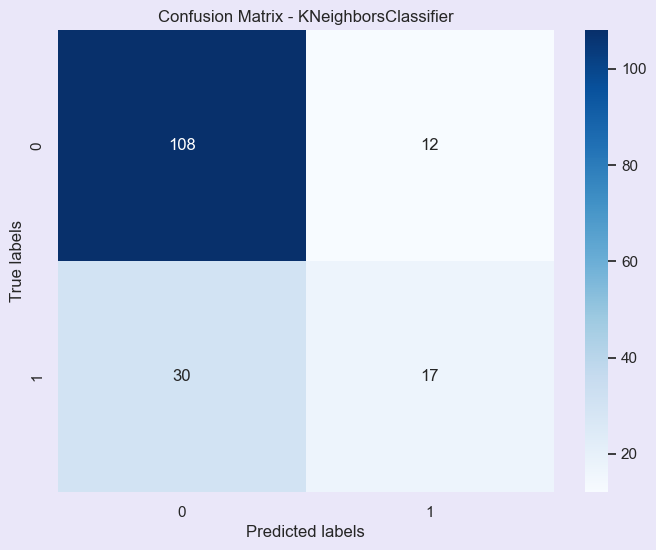

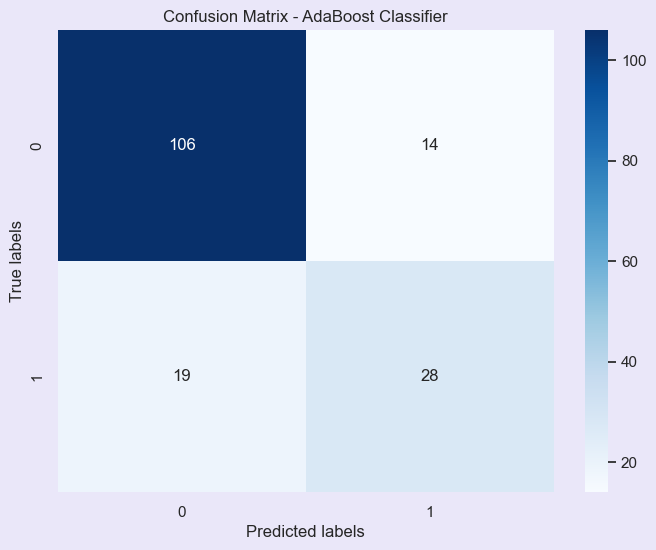

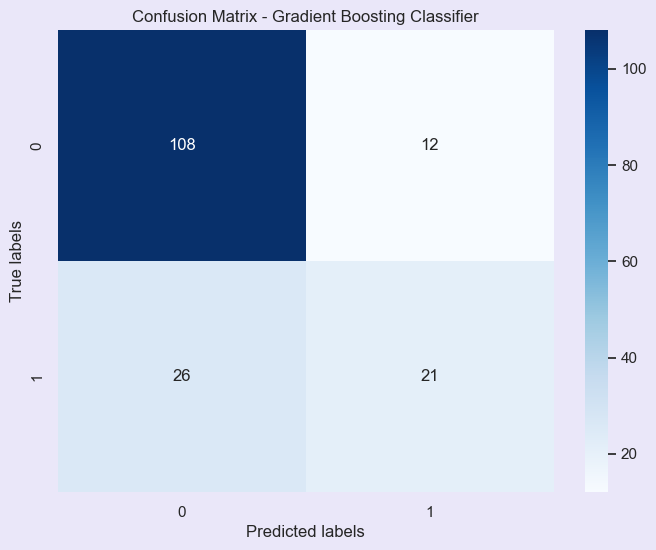

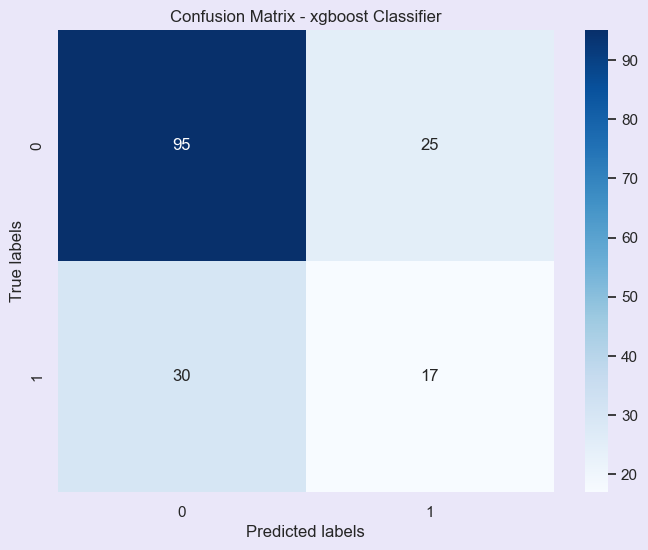

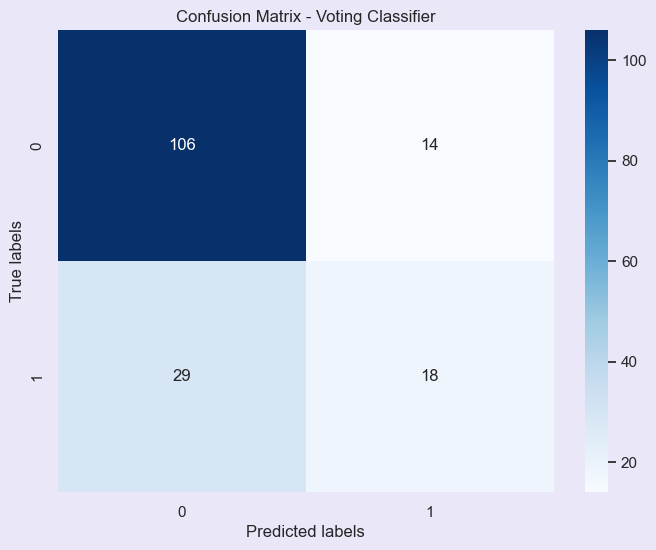

Performance metrics for Logistic Regression:
Training Accuracy: 76.03 %
Testing Accuracy: 70.66 %
Precision: 25.00 %
Recall: 2.13 %
F1 Score: 3.92 %
ROC AUC Score: 76.99 %


Performance metrics for Random Forest:
Training Accuracy: 100.00 %
Testing Accuracy: 71.26 %
Precision: 48.48 %
Recall: 34.04 %
F1 Score: 40.00 %
ROC AUC Score: 76.69 %


Performance metrics for Decision Tree:
Training Accuracy: 100.00 %
Testing Accuracy: 71.86 %
Precision: 50.00 %
Recall: 46.81 %
F1 Score: 48.35 %
ROC AUC Score: 64.24 %


Performance metrics for KNeighborsClassifier:
Training Accuracy: 84.28 %
Testing Accuracy: 74.85 %
Precision: 58.62 %
Recall: 36.17 %
F1 Score: 44.74 %
ROC AUC Score: 69.27 %


Performance metrics for AdaBoost Classifier:
Training Accuracy: 86.08 %
Testing Accuracy: 80.24 %
Precision: 66.67 %
Recall: 59.57 %
F1 Score: 62.92 %
ROC AUC Score: 80.81 %


Performance metrics for Gradient Boosting Classifier:
Training Accuracy: 95.36 %
Testing Accuracy: 77.25 %
Precision: 63.64 %
Recal

In [107]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.7
test_size = 0.3

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Define train-test split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, train_size=0.9, random_state=42)

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Train classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Dictionary to store performance metrics
performance_metrics = {}

# Iterate over classifiers
for name, clf in classifiers.items():
    # Train the classifier
    clf.fit(X_train, y_train)
    
    # Predictions
    y_pred = clf.predict(X_test)
    y_pred_prob = clf.predict_proba(X_test)[:, 1]

    # Performance metrics
    accuracy_train = clf.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve - {}'.format(name))
    plt.legend(loc="lower right")
    plt.close()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix - {}".format(name))
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.show()

    # Store performance metrics
    performance_metrics[name] = {
        "Training Accuracy": "{:.2f} %".format(accuracy_train * 100),
        "Testing Accuracy": "{:.2f} %".format(accuracy_test * 100),
        "Precision": "{:.2f} %".format(precision * 100),
        "Recall": "{:.2f} %".format(recall * 100),
        "F1 Score": "{:.2f} %".format(f1 * 100),
        "ROC AUC Score": "{:.2f} %".format(roc_auc * 100)
    }

# Print performance metrics in bold
for name, metrics in performance_metrics.items():
    print(f"\033[1mPerformance metrics for {name}:\033[0m")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value}")
    print("\n")


# 3. Training Part 70 % and Testing Part 30% (Support Vector Machine)

In [108]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test split
train_size = 0.7
test_size = 0.3

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

# Initialize Support Vector Machine Classifier
svm_classifier = SVC()

# Fitting the SVM classifier to the training data
svm_classifier.fit(X_train, y_train)

# Predicting on the test data
y_pred = svm_classifier.predict(X_test)
y_pred_prob = svm_classifier.decision_function(X_test)

# Measuring performance
accuracy_train = svm_classifier.score(X_train, y_train)
accuracy_test = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plotting the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Support Vector Machine Classifier')
plt.legend(loc="lower right")
plt.close()

# Plotting confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Support Vector Machine Classifier")
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.close()

# Printing performance metrics
print("\033[1mPerformance metrics (Training Part 70 % and Testing Part 30%) for Support Vector Machine Classifier:\033[0m")
#print("Performance metrics (Training Part 70 % and Testing Part 30%) for Support Vector Machine Classifier:")
print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
print("Precision:", "{:.2f}%".format(precision * 100))
print("Recall:", "{:.2f}%".format(recall * 100))
print("F1 Score:", "{:.2f}%".format(f1 * 100))
print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))


Performance metrics (Training Part 70 % and Testing Part 30%) for Support Vector Machine Classifier:
Training Accuracy: 82.22%
Testing Accuracy: 76.65%
Precision: 75.00%
Recall: 25.53%
F1 Score: 38.10%
ROC AUC Score: 77.27%


# Machine Learning models (Combinedly) splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

In [109]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Train classifiers and evaluate performance
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    for name, clf in classifiers.items():
        # Train the classifier
        clf.fit(X_train, y_train)
        
        # Predictions
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        
        # ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        
        # Print performance metrics
        print(f"\n\033[1mPerformance metrics for {name}:\033[0m")
        print("\033[1mTraining Accuracy\033[0m: {:.2f}%".format(accuracy_train * 100))
        print("\033[1mTesting Accuracy\033[0m: {:.2f}%".format(accuracy_test * 100))
        print("\033[1mPrecision\033[0m: {:.2f}%".format(precision * 100))
        print("\033[1mRecall\033[0m: {:.2f}%".format(recall * 100))
        print("\033[1mF1 Score\033[0m: {:.2f}%".format(f1 * 100))
        print("\033[1mROC AUC Score\033[0m: {:.2f}%".format(roc_auc * 100))
        
        # Plot ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {name}')
        plt.legend(loc="lower right")
        plt.close()
        
        # Plot confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix - {name}")
        plt.xlabel("Predicted labels")
        plt.ylabel("True labels")
        plt.close()


Train size: 0.9, Test size: 0.1

Performance metrics for Logistic Regression:
Training Accuracy: 74.35%
Testing Accuracy: 69.64%
Precision: 25.00%
Recall: 6.67%
F1 Score: 10.53%
ROC AUC Score: 68.46%

Performance metrics for Random Forest:
Training Accuracy: 100.00%
Testing Accuracy: 78.57%
Precision: 71.43%
Recall: 33.33%
F1 Score: 45.45%
ROC AUC Score: 83.82%

Performance metrics for Decision Tree:
Training Accuracy: 100.00%
Testing Accuracy: 80.36%
Precision: 66.67%
Recall: 53.33%
F1 Score: 59.26%
ROC AUC Score: 71.79%

Performance metrics for KNeighborsClassifier:
Training Accuracy: 83.37%
Testing Accuracy: 78.57%
Precision: 63.64%
Recall: 46.67%
F1 Score: 53.85%
ROC AUC Score: 73.01%

Performance metrics for AdaBoost Classifier:
Training Accuracy: 85.37%
Testing Accuracy: 78.57%
Precision: 63.64%
Recall: 46.67%
F1 Score: 53.85%
ROC AUC Score: 80.16%

Performance metrics for Gradient Boosting Classifier:
Training Accuracy: 91.18%
Testing Accuracy: 78.57%
Precision: 66.67%
Recall: 4

In [110]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Train classifiers and evaluate performance
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    for name, clf in classifiers.items():
        # Train the classifier
        clf.fit(X_train, y_train)
        
        # Predictions
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        
        # ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        
        # Print performance metrics
        print(f"\n\033[1mPerformance metrics for {name}:\033[0m")
        print("\033[1mTraining Accuracy\033[0m: {:.2f}%".format(accuracy_train * 100))
        print("\033[1mTesting Accuracy\033[0m: {:.2f}%".format(accuracy_test * 100))
        print("\033[1mPrecision\033[0m: {:.2f}%".format(precision * 100))
        print("\033[1mRecall\033[0m: {:.2f}%".format(recall * 100))
        print("\033[1mF1 Score\033[0m: {:.2f}%".format(f1 * 100))
        print("\033[1mROC AUC Score\033[0m: {:.2f}%".format(roc_auc * 100))
        
        # Plot ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {name}')
        plt.legend(loc="lower right")
        plt.close()
        
        # Plot confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix - {name}")
        plt.xlabel("Predicted labels")
        plt.ylabel("True labels")
        plt.close()


Train size: 0.9, Test size: 0.1

Performance metrics for Logistic Regression:
Training Accuracy: 74.35%
Testing Accuracy: 69.64%
Precision: 25.00%
Recall: 6.67%
F1 Score: 10.53%
ROC AUC Score: 68.46%

Performance metrics for Random Forest:
Training Accuracy: 100.00%
Testing Accuracy: 75.00%
Precision: 55.56%
Recall: 33.33%
F1 Score: 41.67%
ROC AUC Score: 83.90%

Performance metrics for Decision Tree:
Training Accuracy: 100.00%
Testing Accuracy: 76.79%
Precision: 57.14%
Recall: 53.33%
F1 Score: 55.17%
ROC AUC Score: 69.35%

Performance metrics for KNeighborsClassifier:
Training Accuracy: 83.37%
Testing Accuracy: 78.57%
Precision: 63.64%
Recall: 46.67%
F1 Score: 53.85%
ROC AUC Score: 73.01%

Performance metrics for AdaBoost Classifier:
Training Accuracy: 85.37%
Testing Accuracy: 78.57%
Precision: 63.64%
Recall: 46.67%
F1 Score: 53.85%
ROC AUC Score: 80.16%

Performance metrics for Gradient Boosting Classifier:
Training Accuracy: 91.18%
Testing Accuracy: 78.57%
Precision: 66.67%
Recall: 4

Train size: 0.9, Test size: 0.1


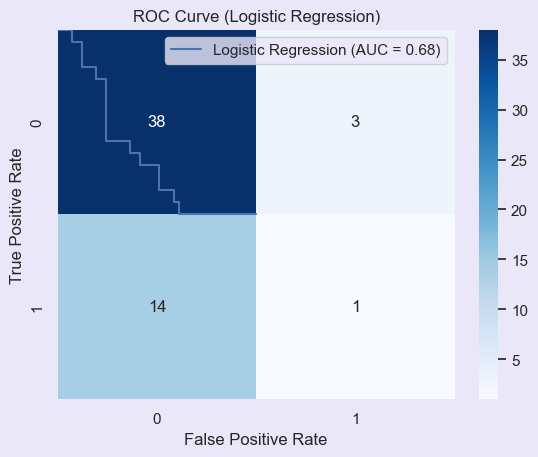

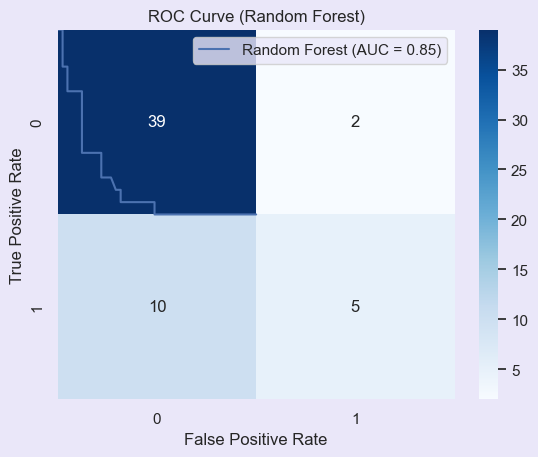

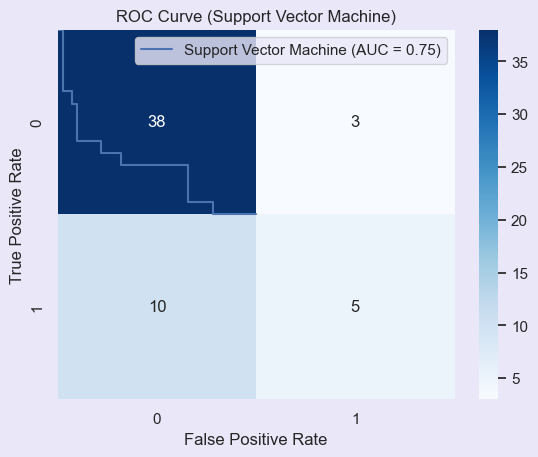

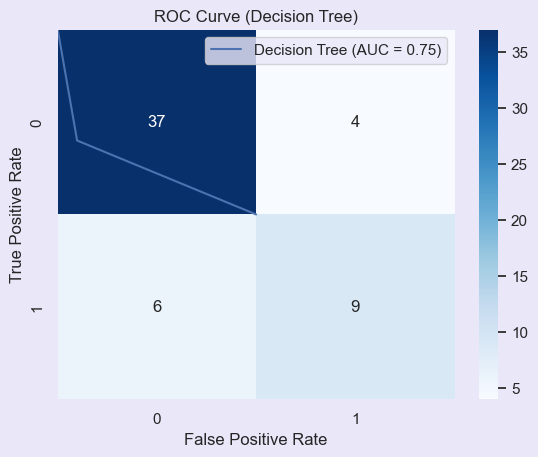

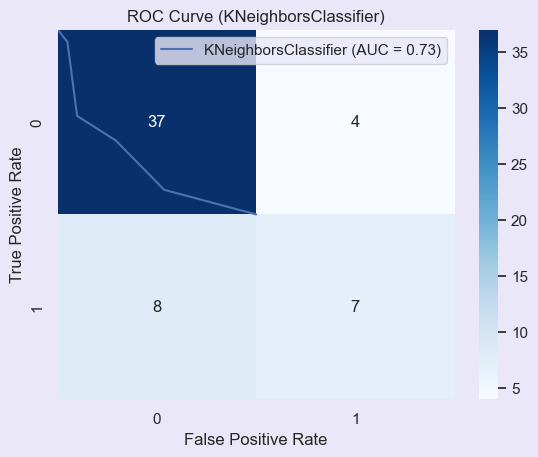

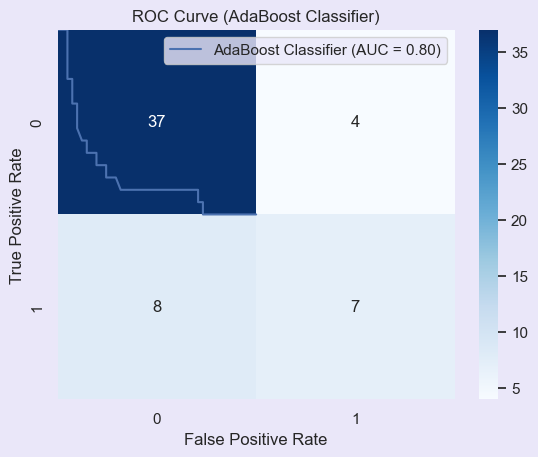

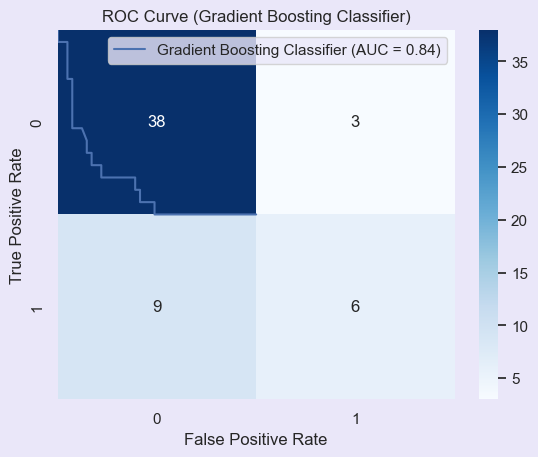

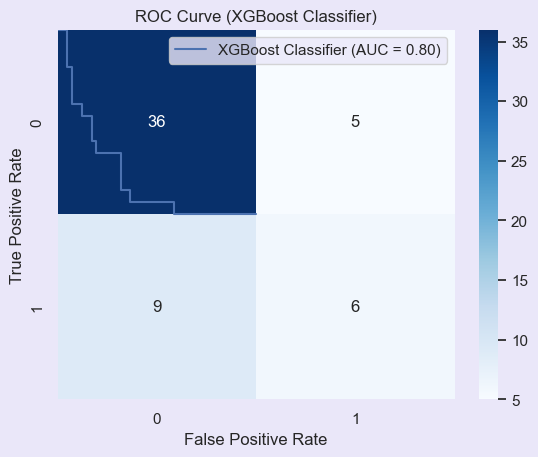

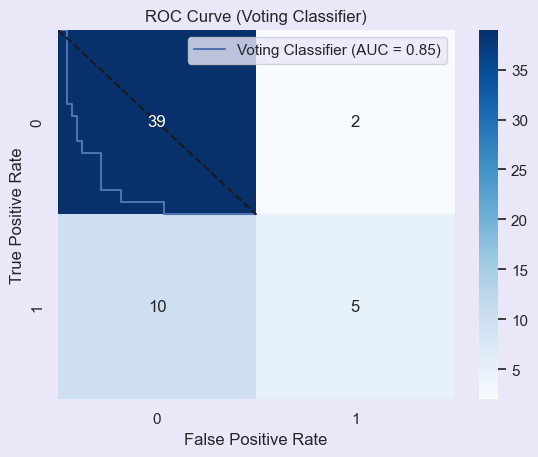

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.74            0.70            0.25            0.07            0.11            0.68           
Random Forest                  1.00            0.79            0.71            0.33            0.45            0.85           
Support Vector Machine         0.83            0.77            0.62            0.33            0.43            0.75           
Decision Tree                  1.00            0.82            0.69            0.60            0.64            0.75           
KNeighborsClassifier           0.83            0.79            0.64            0.47            0.54            0.73           
AdaBoost Classifier            0.85            0.79            0.64            0.47            0.54            0.80           
Gradient Boosting Classifier   0.91            0.79            0.67            0.40       

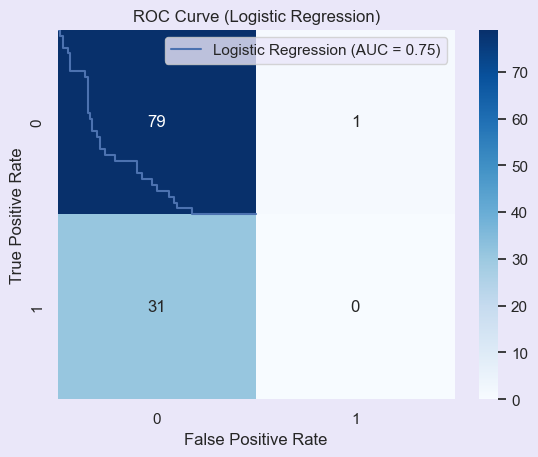

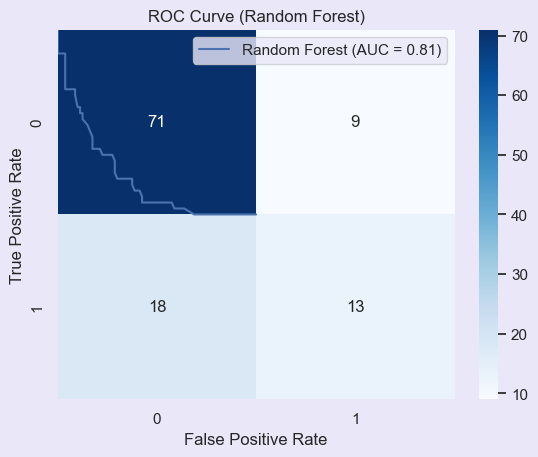

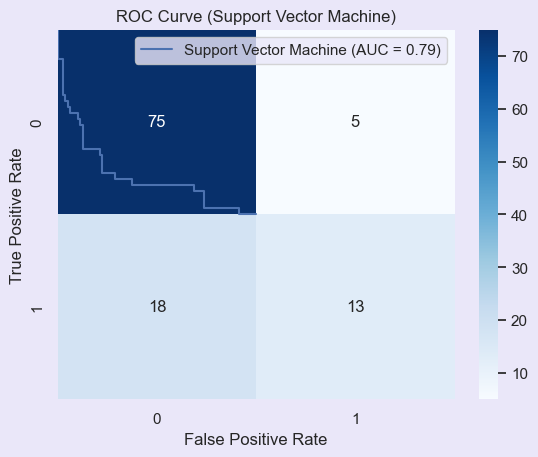

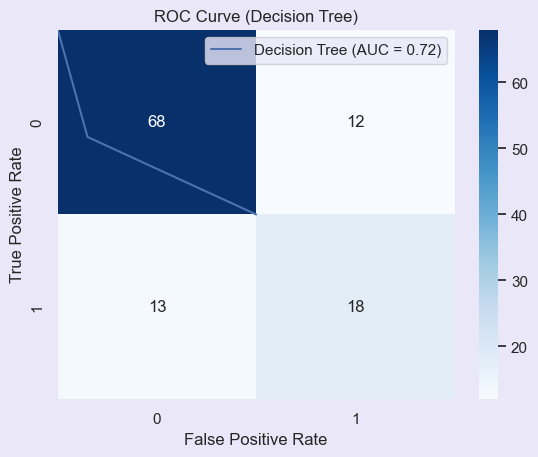

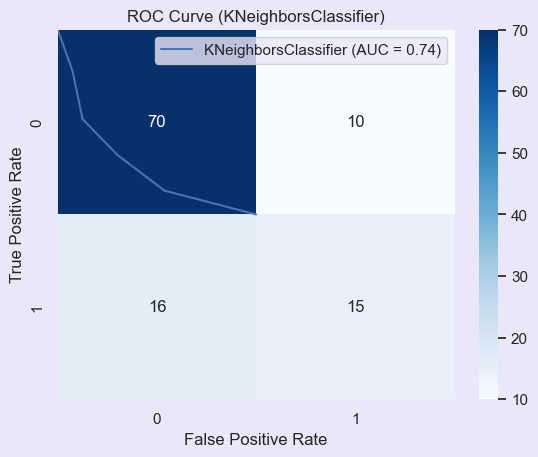

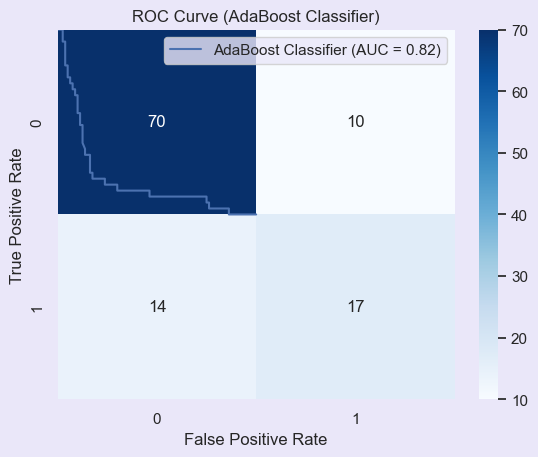

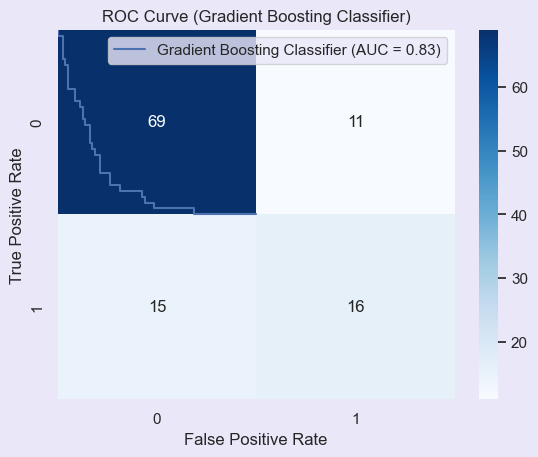

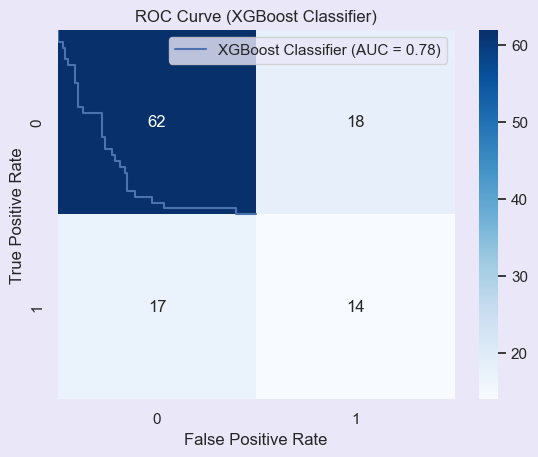

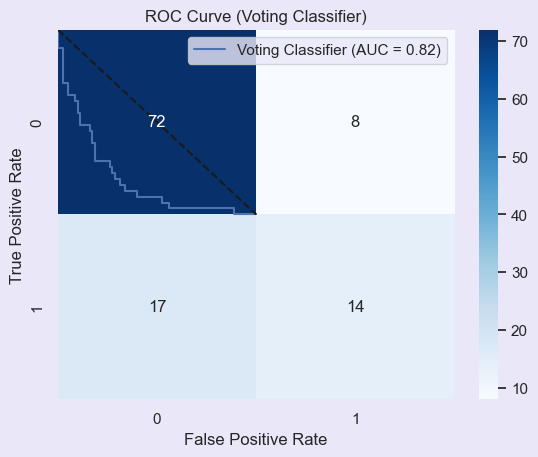

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.00            0.00            0.00            0.75           
Random Forest                  1.00            0.76            0.59            0.42            0.49            0.81           
Support Vector Machine         0.82            0.79            0.72            0.42            0.53            0.79           
Decision Tree                  1.00            0.77            0.60            0.58            0.59            0.72           
KNeighborsClassifier           0.84            0.77            0.60            0.48            0.54            0.74           
AdaBoost Classifier            0.86            0.78            0.63            0.55            0.59            0.82           
Gradient Boosting Classifier   0.94            0.77            0.59            0.52       

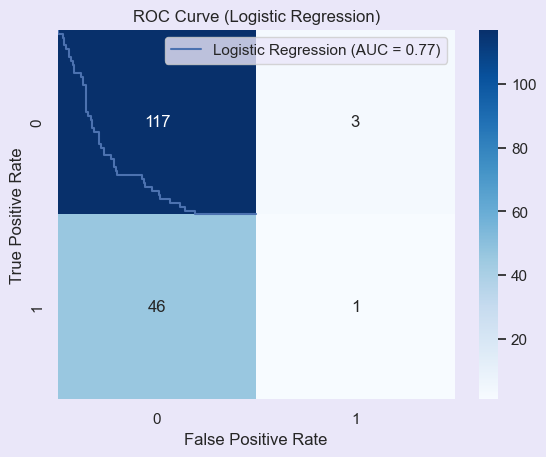

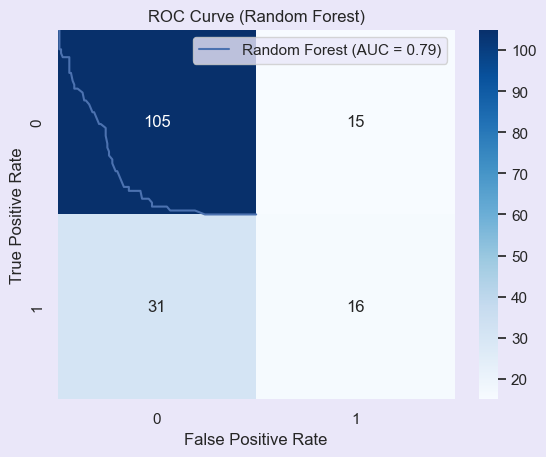

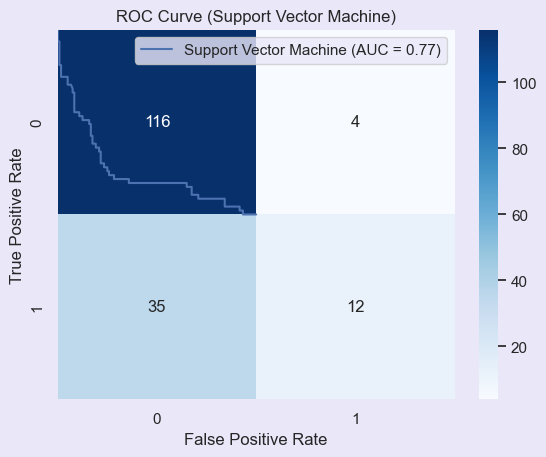

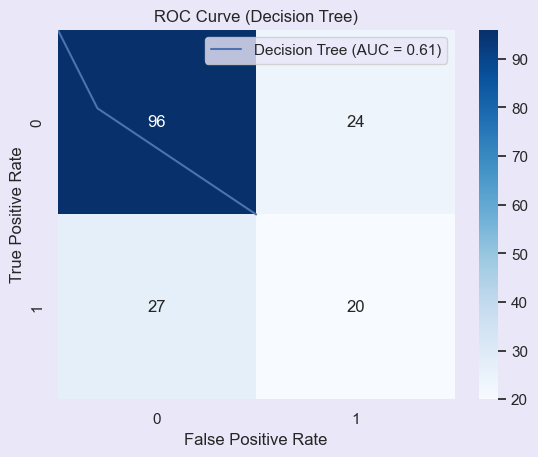

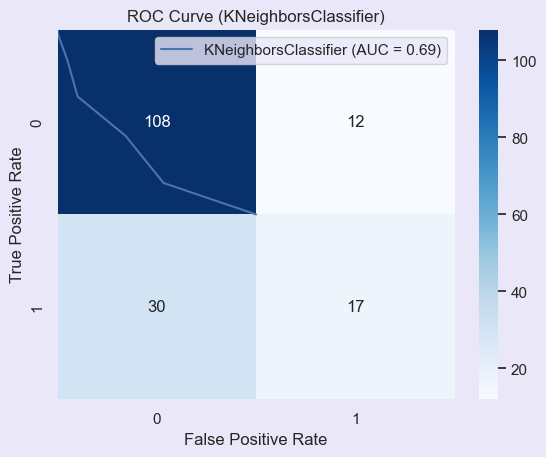

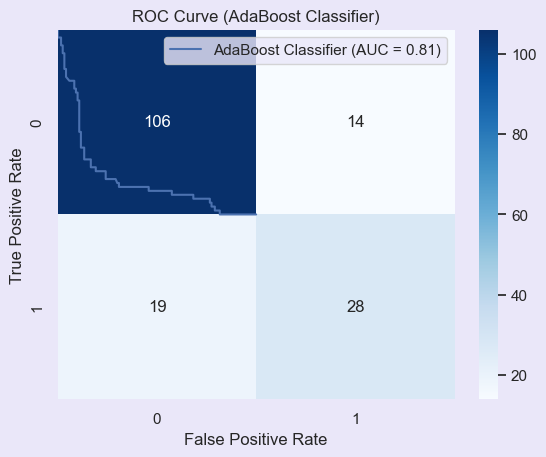

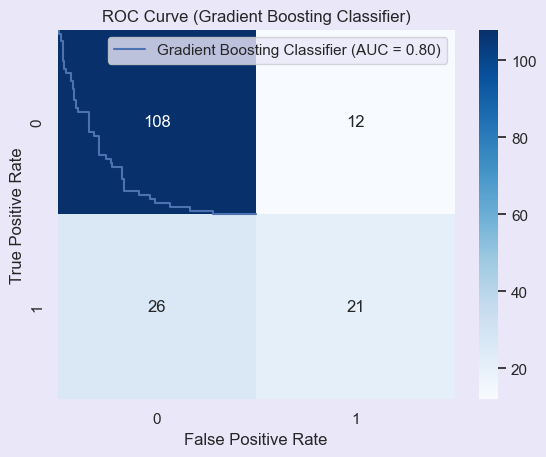

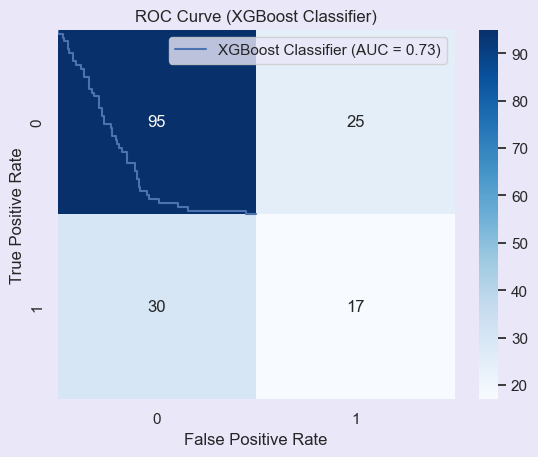

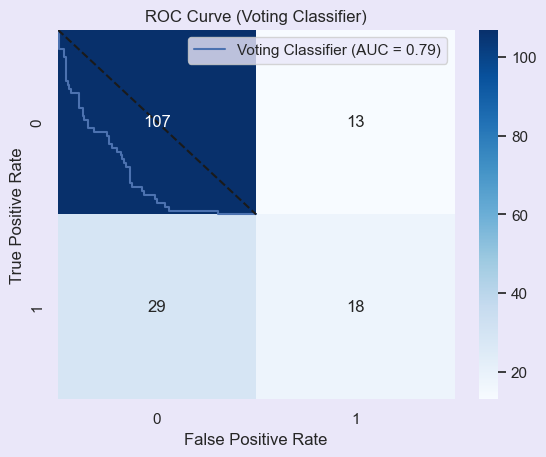

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.25            0.02            0.04            0.77           
Random Forest                  1.00            0.72            0.52            0.34            0.41            0.79           
Support Vector Machine         0.82            0.77            0.75            0.26            0.38            0.77           
Decision Tree                  1.00            0.69            0.45            0.43            0.44            0.61           
KNeighborsClassifier           0.84            0.75            0.59            0.36            0.45            0.69           
AdaBoost Classifier            0.86            0.80            0.67            0.60            0.63            0.81           
Gradient Boosting Classifier   0.95            0.77            0.64            0.45       

In [111]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'XGBoost Classifier': xgb, 
               'Voting Classifier': voting}

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')

# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, roc_auc, classifier_name):
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({classifier_name})')
    plt.legend()

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, f1, roc_auc))
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, roc_auc, name)
    
    # Plot ROC curve for all classifiers
    plt.plot([0, 1], [0, 1], 'k--')
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics:\033[0m")
    print("{:<30} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f}".format(*result))
    print("\n")


Train size: 0.9, Test size: 0.1


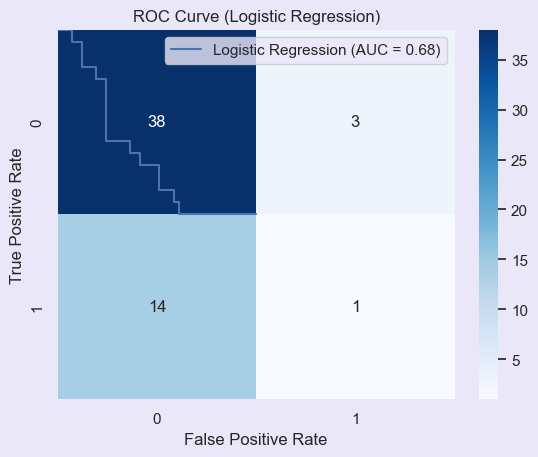

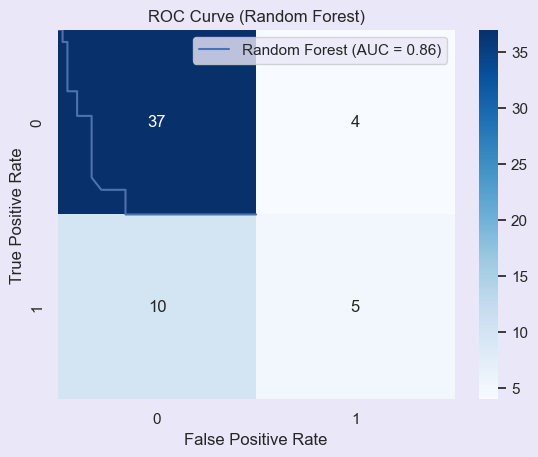

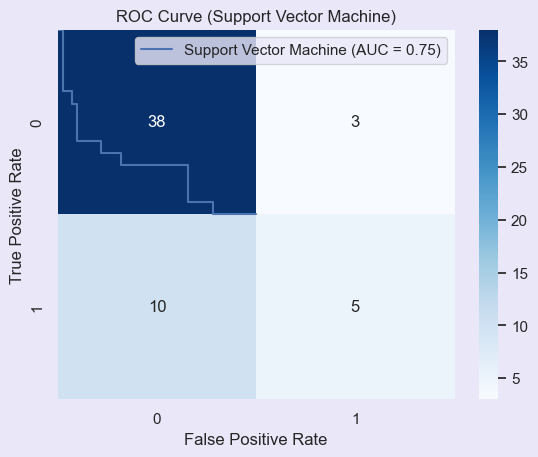

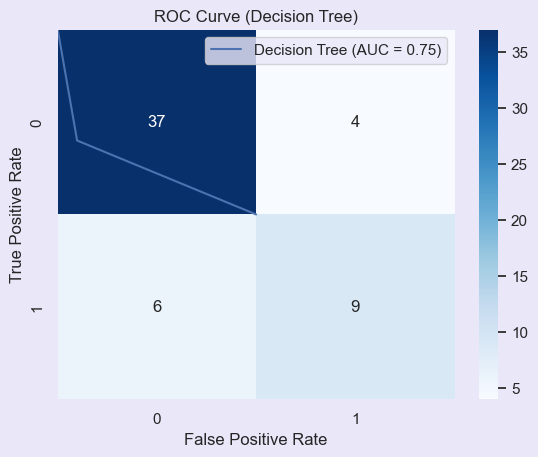

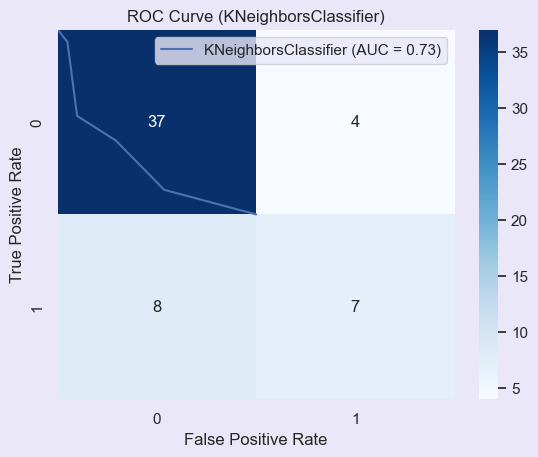

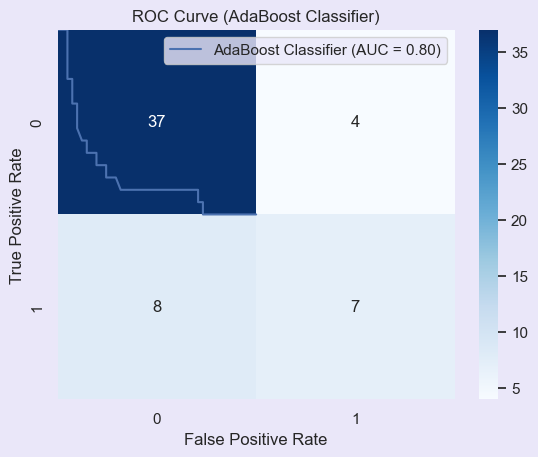

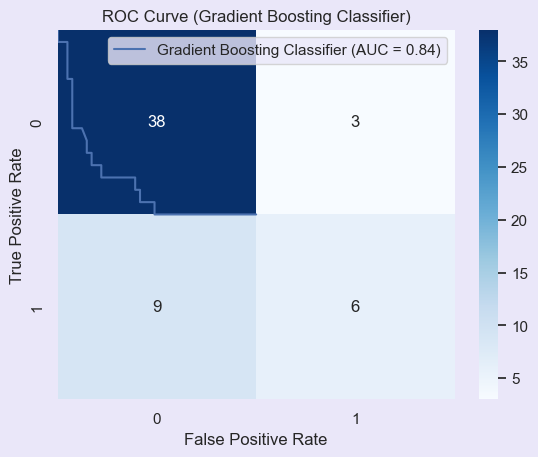

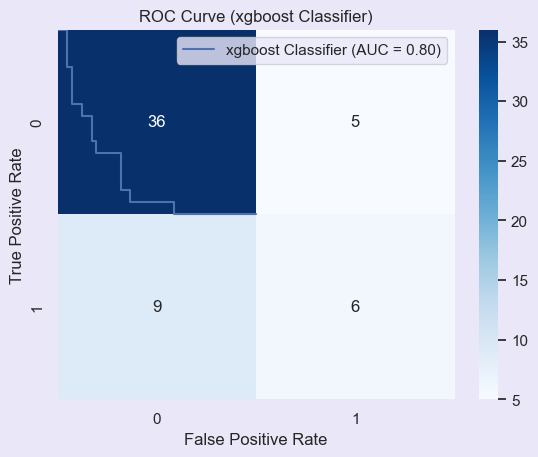

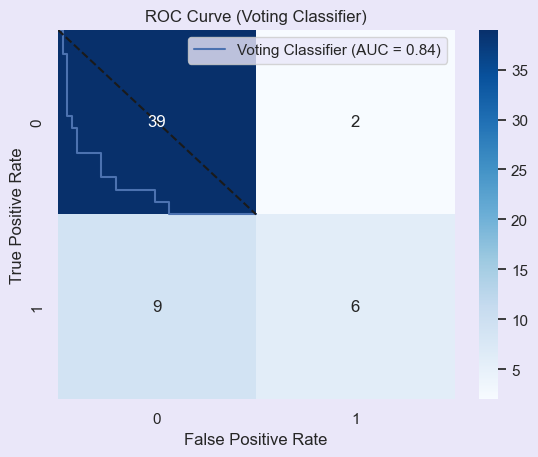

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.74            0.70            0.25            0.07            0.11            0.68           
Random Forest                  1.00            0.75            0.56            0.33            0.42            0.86           
Support Vector Machine         0.83            0.77            0.62            0.33            0.43            0.75           
Decision Tree                  1.00            0.82            0.69            0.60            0.64            0.75           
KNeighborsClassifier           0.83            0.79            0.64            0.47            0.54            0.73           
AdaBoost Classifier            0.85            0.79            0.64            0.47            0.54            0.80           
Gradient Boosting Classifier   0.91            0.79            0.67            0.40       

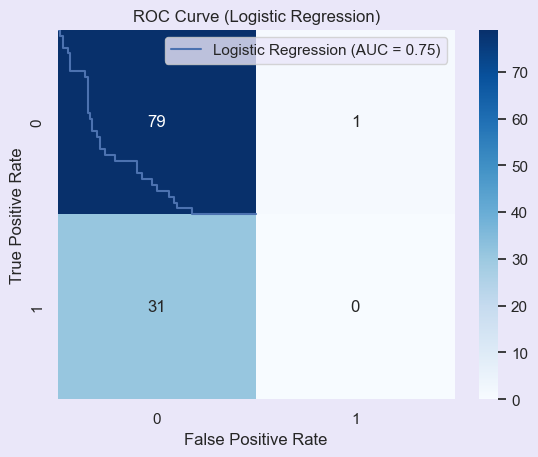

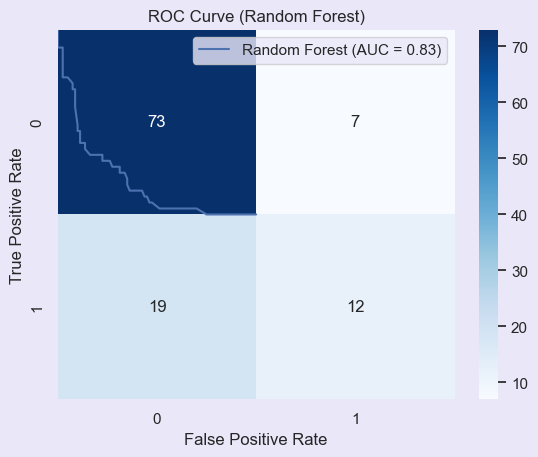

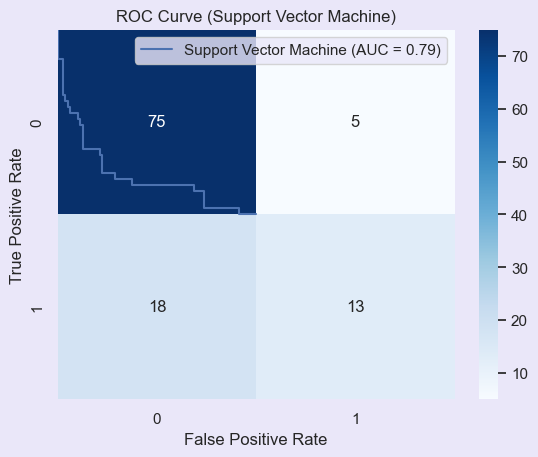

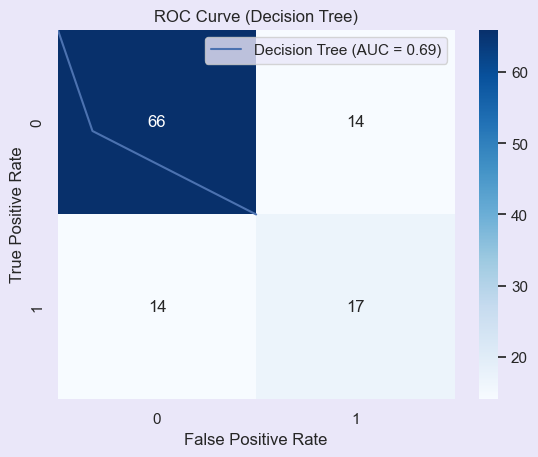

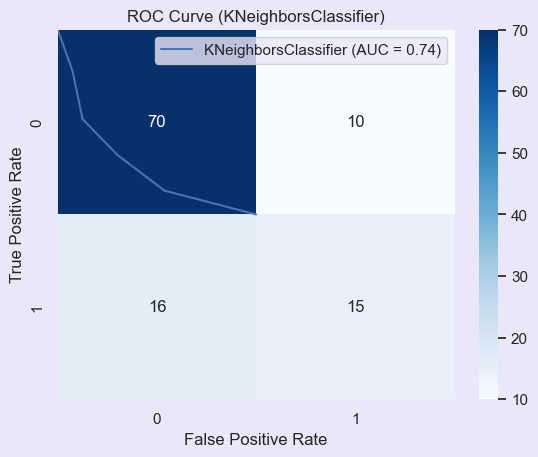

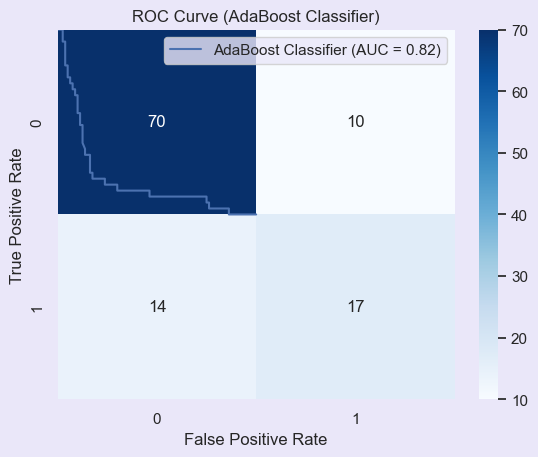

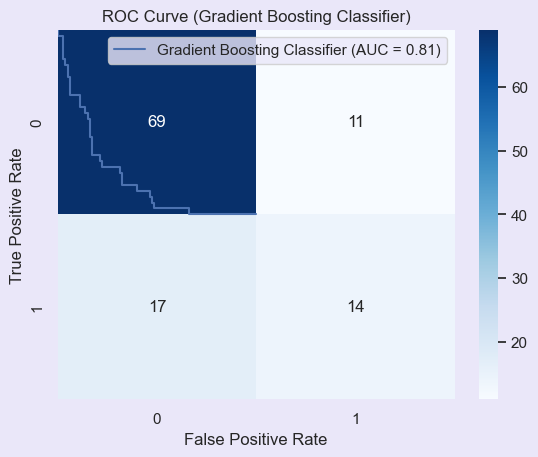

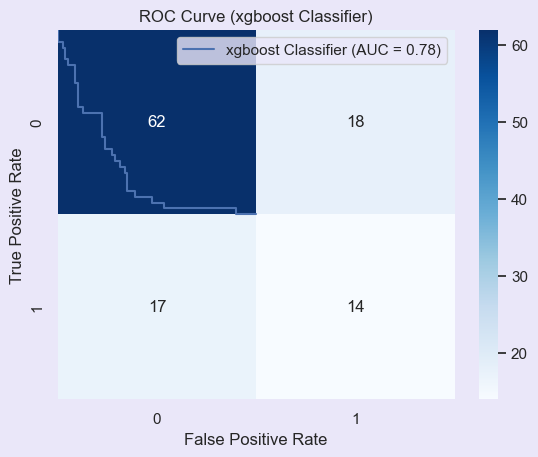

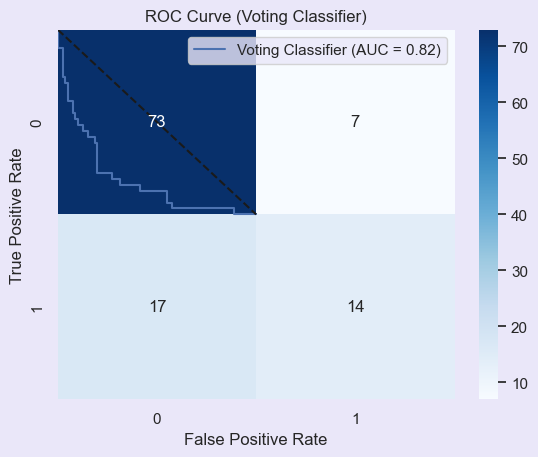

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.00            0.00            0.00            0.75           
Random Forest                  1.00            0.77            0.63            0.39            0.48            0.83           
Support Vector Machine         0.82            0.79            0.72            0.42            0.53            0.79           
Decision Tree                  1.00            0.75            0.55            0.55            0.55            0.69           
KNeighborsClassifier           0.84            0.77            0.60            0.48            0.54            0.74           
AdaBoost Classifier            0.86            0.78            0.63            0.55            0.59            0.82           
Gradient Boosting Classifier   0.94            0.75            0.56            0.45       

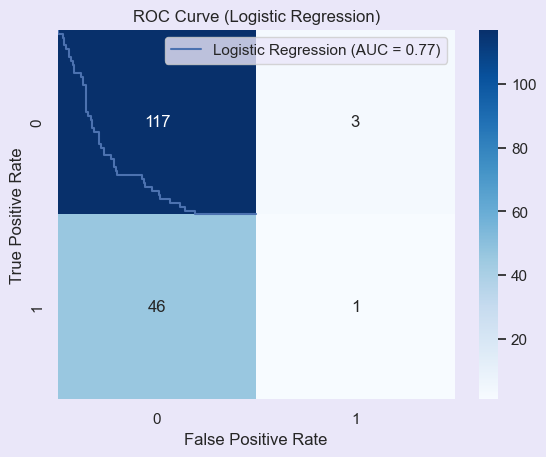

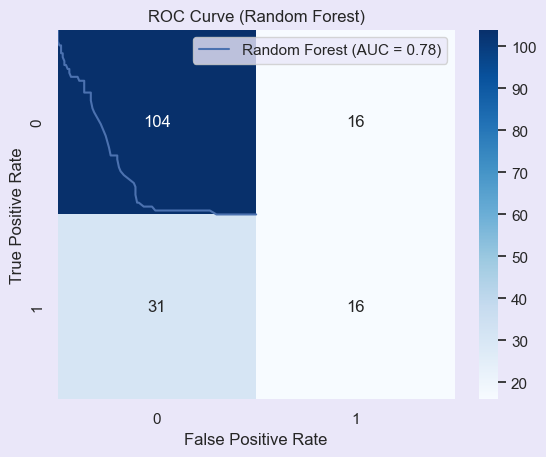

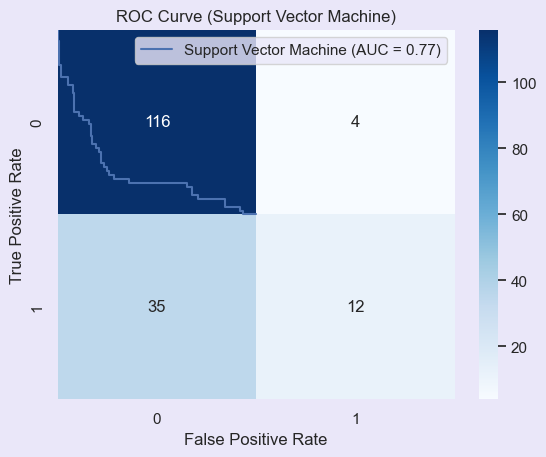

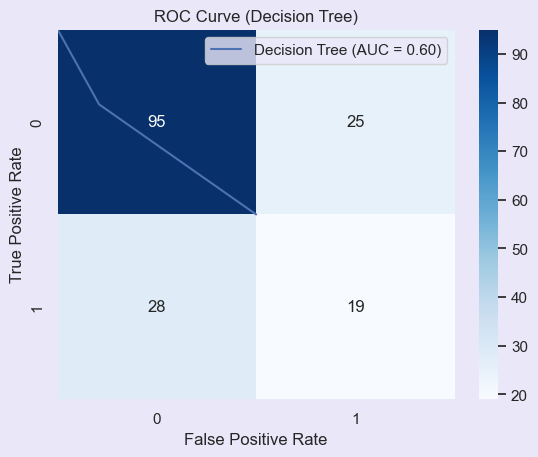

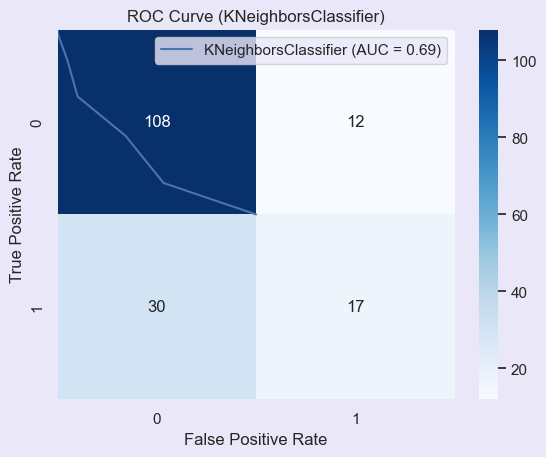

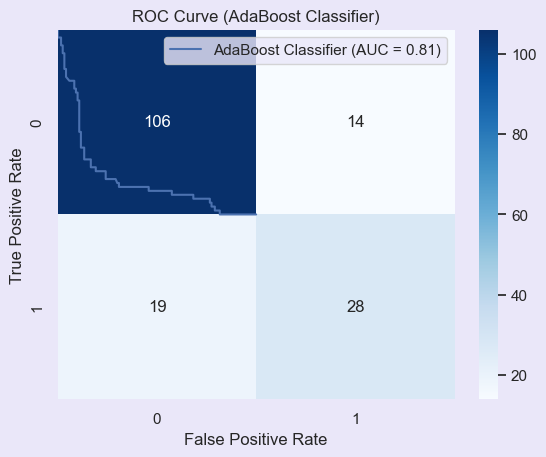

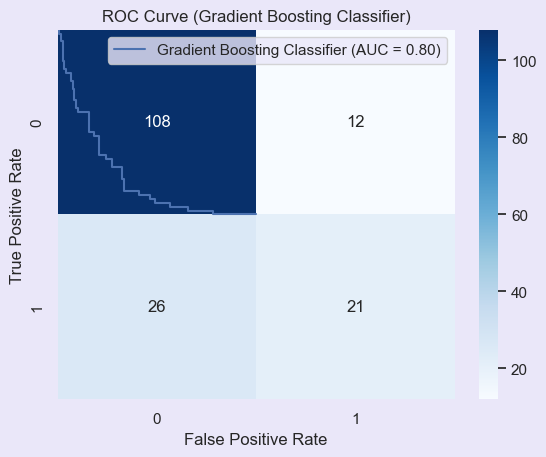

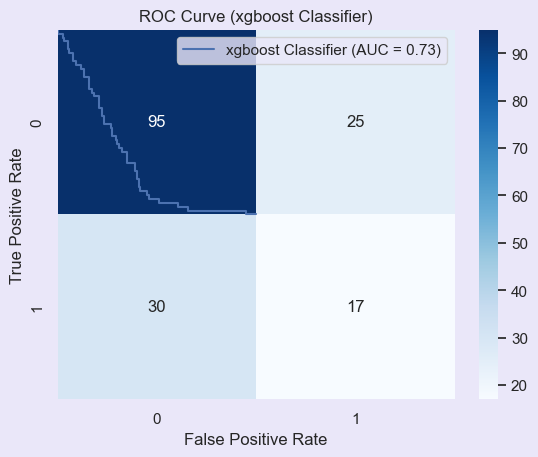

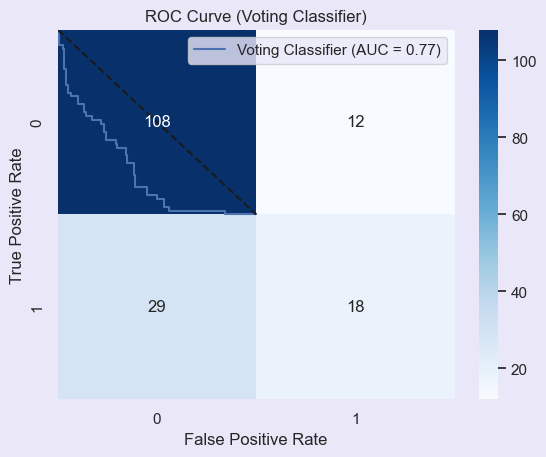

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.25            0.02            0.04            0.77           
Random Forest                  1.00            0.72            0.50            0.34            0.41            0.78           
Support Vector Machine         0.82            0.77            0.75            0.26            0.38            0.77           
Decision Tree                  1.00            0.68            0.43            0.40            0.42            0.60           
KNeighborsClassifier           0.84            0.75            0.59            0.36            0.45            0.69           
AdaBoost Classifier            0.86            0.80            0.67            0.60            0.63            0.81           
Gradient Boosting Classifier   0.95            0.77            0.64            0.45       

In [112]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Function to plot confusion matrix with classifier name
def plot_confusion_matrix(cm, classifier_name):
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix ({classifier_name})')

# Function to plot ROC curve with classifier name
def plot_roc_curve(fpr, tpr, classifier_name):
    plt.plot(fpr, tpr, label=f'{classifier_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({classifier_name})')
    plt.legend()

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, name)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, f1, roc_auc))
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plot_roc_curve(fpr, tpr, name)
    
    # Plot ROC curve for all classifiers
    plt.plot([0, 1], [0, 1], 'k--')
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics:\033[0m")
    print("{:<30} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f}".format(*result))
    print("\n")


Train size: 0.9, Test size: 0.1


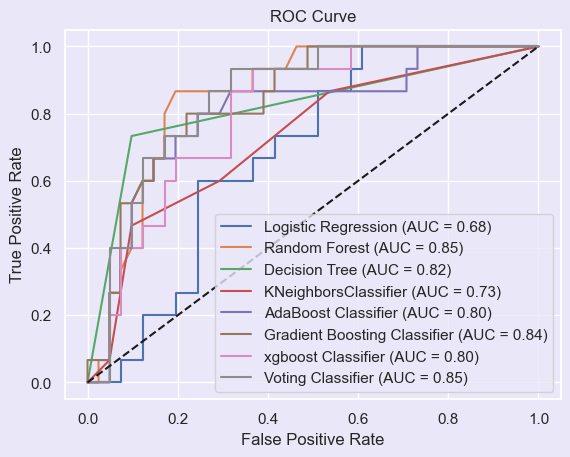

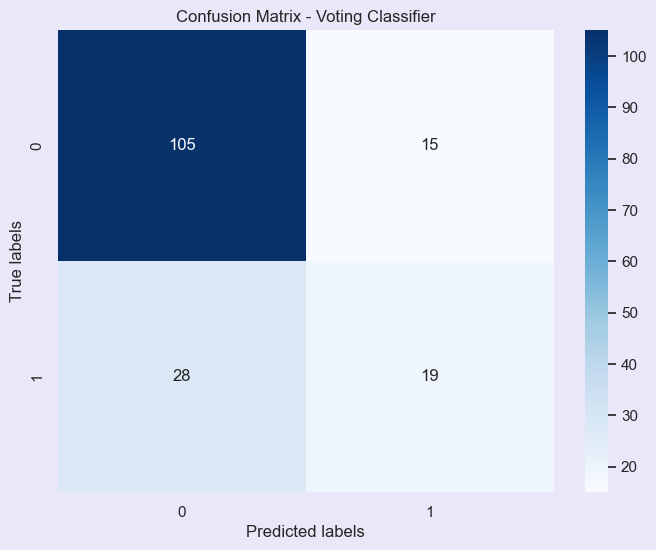

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.74            0.70            0.25            0.07            0.11            0.68           
Random Forest                  1.00            0.77            0.62            0.33            0.43            0.85           
Decision Tree                  1.00            0.86            0.73            0.73            0.73            0.82           
KNeighborsClassifier           0.83            0.79            0.64            0.47            0.54            0.73           
AdaBoost Classifier            0.85            0.79            0.64            0.47            0.54            0.80           
Gradient Boosting Classifier   0.91            0.79            0.67            0.40            0.50            0.84           
xgboost Classifier             1.00            0.75            0.55            0.40       

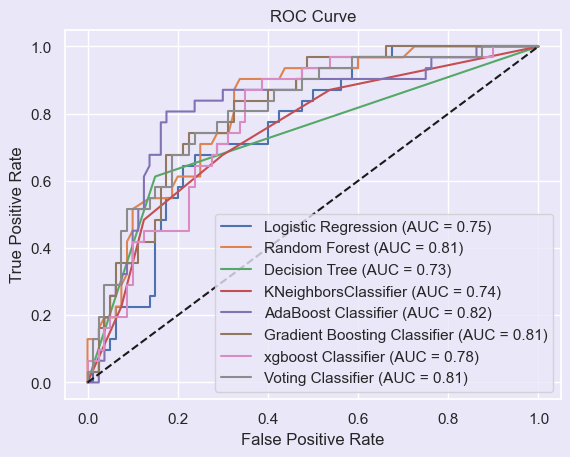

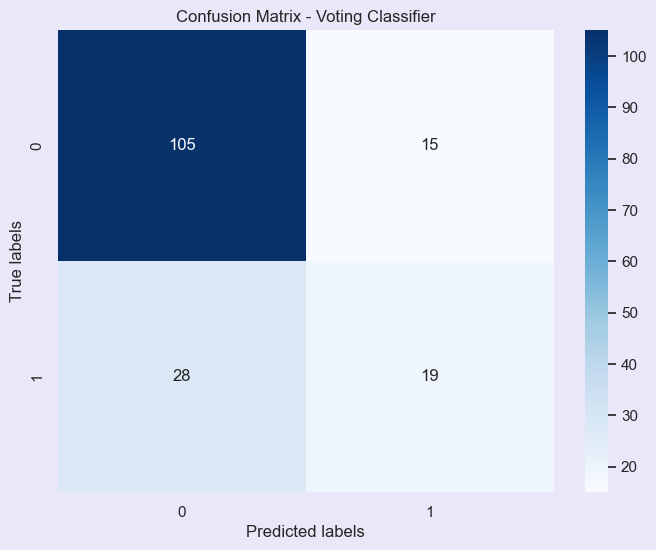

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.00            0.00            0.00            0.75           
Random Forest                  1.00            0.78            0.65            0.48            0.56            0.81           
Decision Tree                  1.00            0.78            0.61            0.61            0.61            0.73           
KNeighborsClassifier           0.84            0.77            0.60            0.48            0.54            0.74           
AdaBoost Classifier            0.86            0.78            0.63            0.55            0.59            0.82           
Gradient Boosting Classifier   0.94            0.74            0.54            0.45            0.49            0.81           
xgboost Classifier             1.00            0.68            0.44            0.45       

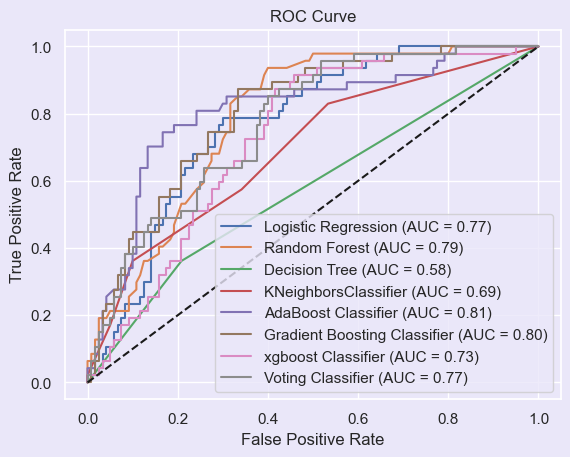

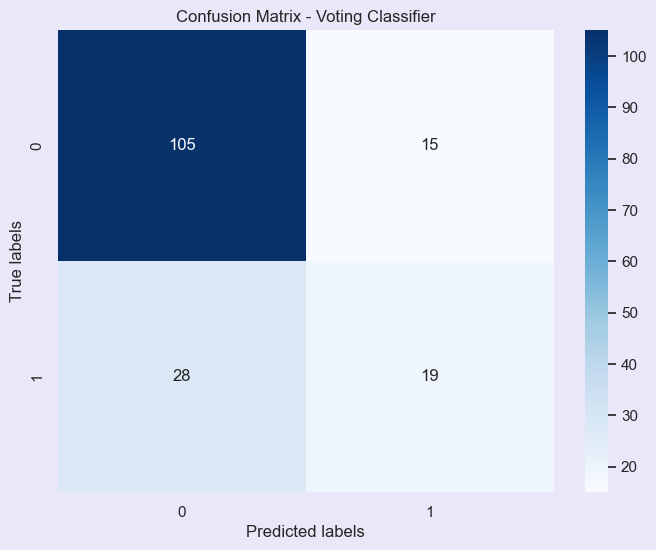

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.25            0.02            0.04            0.77           
Random Forest                  1.00            0.73            0.53            0.36            0.43            0.79           
Decision Tree                  1.00            0.67            0.40            0.36            0.38            0.58           
KNeighborsClassifier           0.84            0.75            0.59            0.36            0.45            0.69           
AdaBoost Classifier            0.86            0.80            0.67            0.60            0.63            0.81           
Gradient Boosting Classifier   0.95            0.77            0.64            0.45            0.52            0.80           
xgboost Classifier             1.00            0.67            0.40            0.36       

In [113]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, f1, roc_auc))
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    
    # Plot ROC curve
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics:\033[0m")
    print("{:<30} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f}".format(*result))
    print("\n")


Train size: 0.9, Test size: 0.1


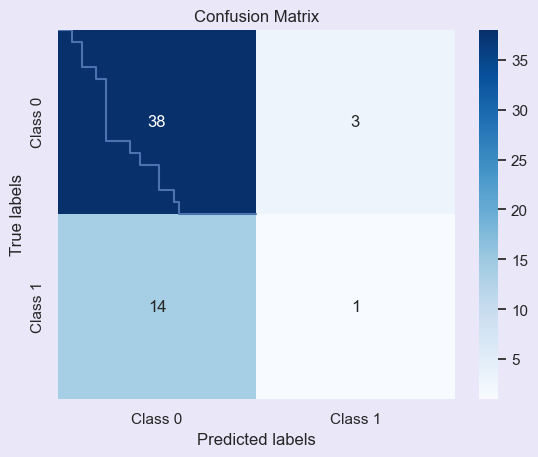

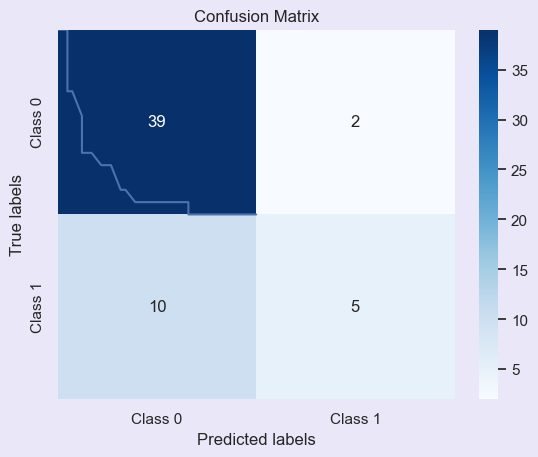

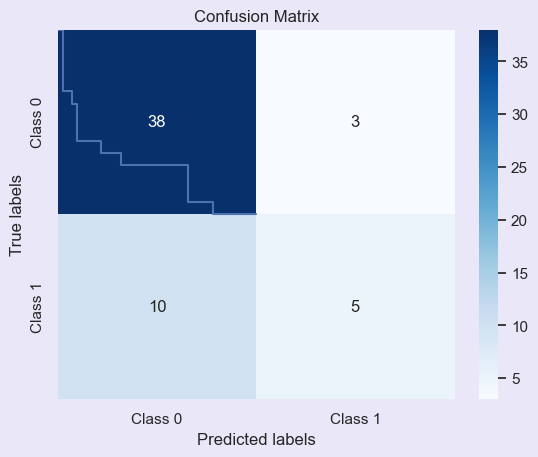

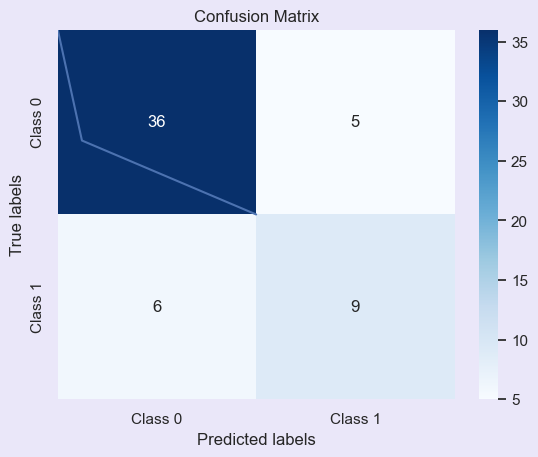

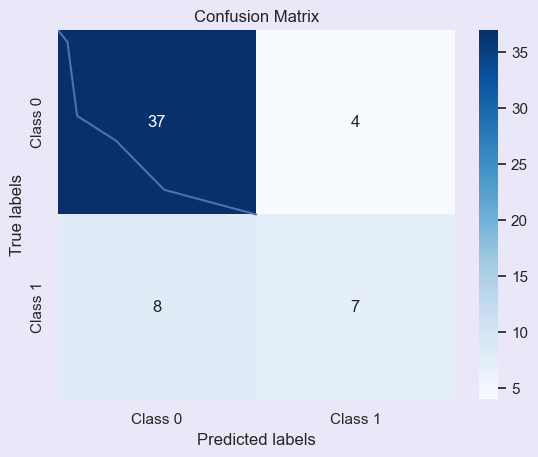

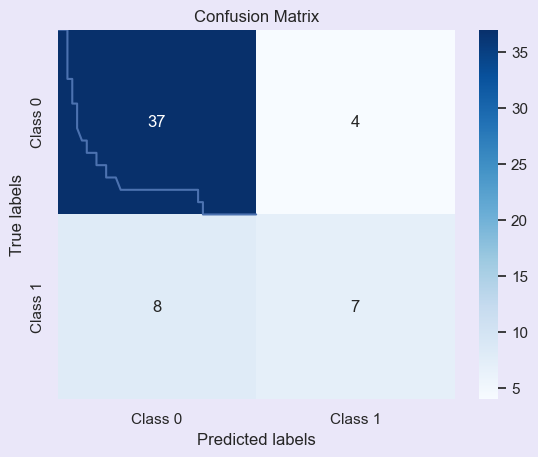

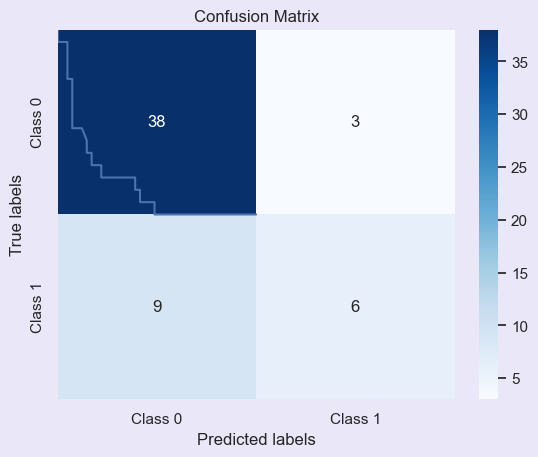

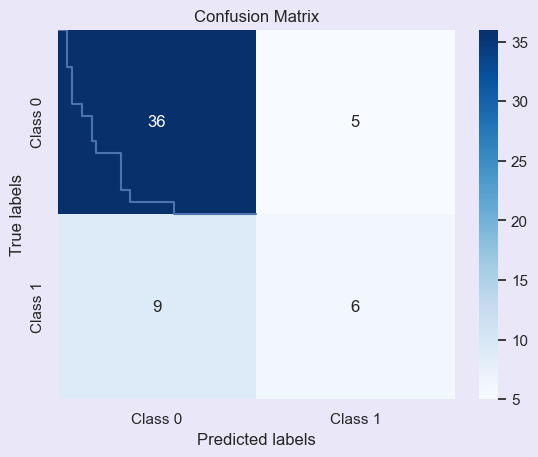

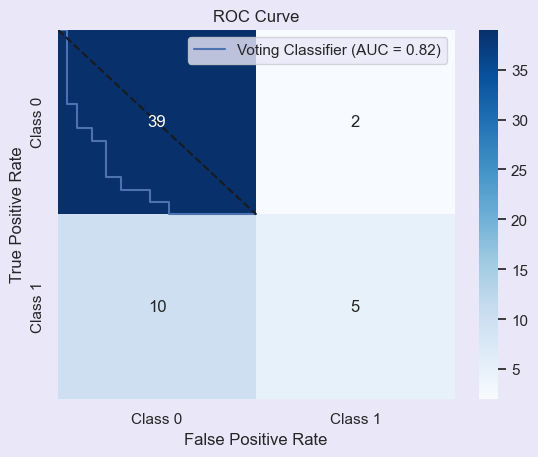

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.74            0.70            0.25            0.07            0.11            0.68           
Random Forest                  1.00            0.79            0.71            0.33            0.45            0.83           
Support Vector Machine         0.83            0.77            0.62            0.33            0.43            0.75           
Decision Tree                  1.00            0.80            0.64            0.60            0.62            0.74           
KNeighborsClassifier           0.83            0.79            0.64            0.47            0.54            0.73           
AdaBoost Classifier            0.85            0.79            0.64            0.47            0.54            0.80           
Gradient Boosting Classifier   0.91            0.79            0.67            0.40       

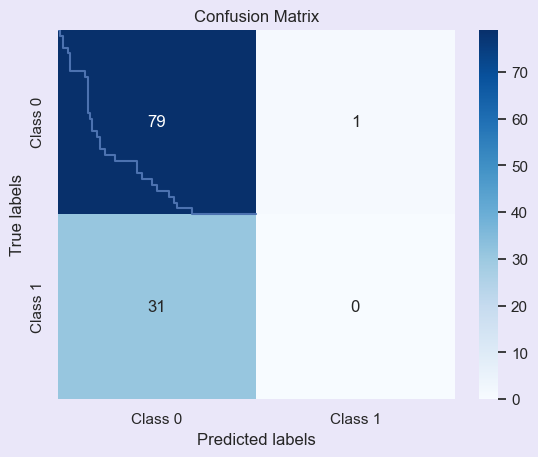

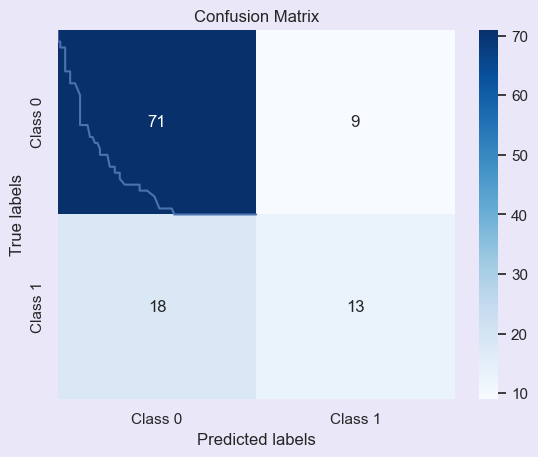

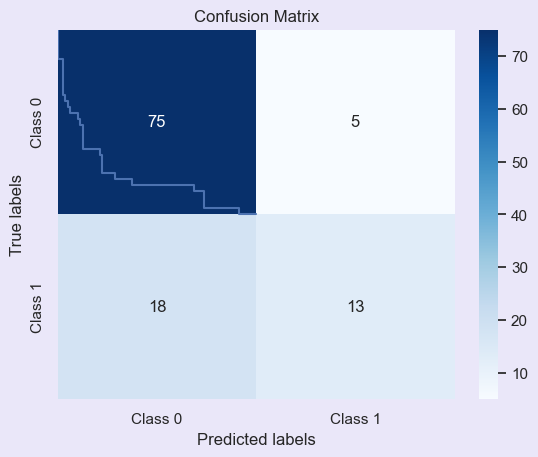

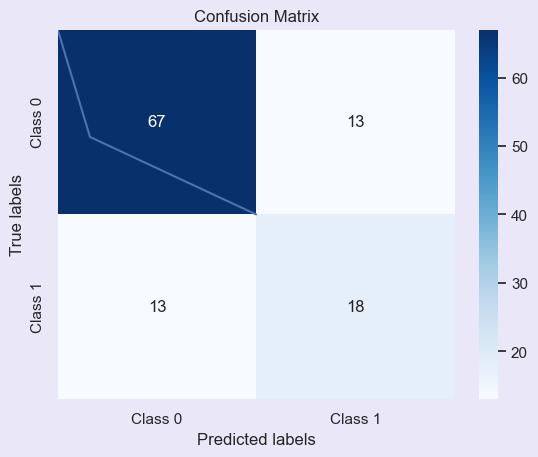

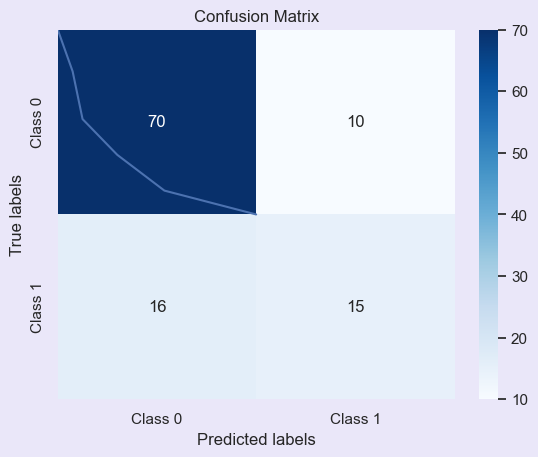

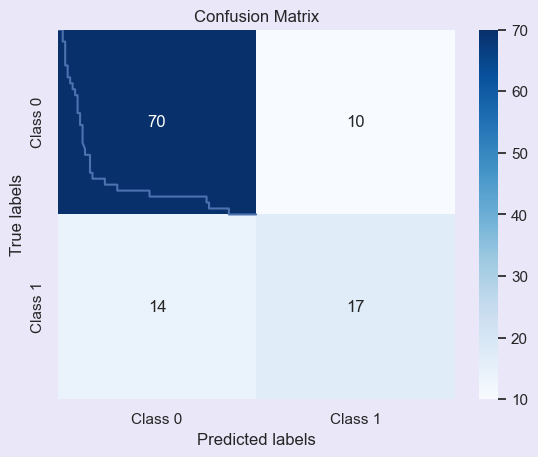

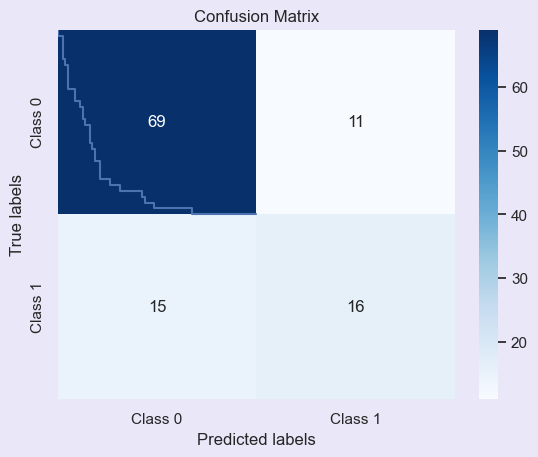

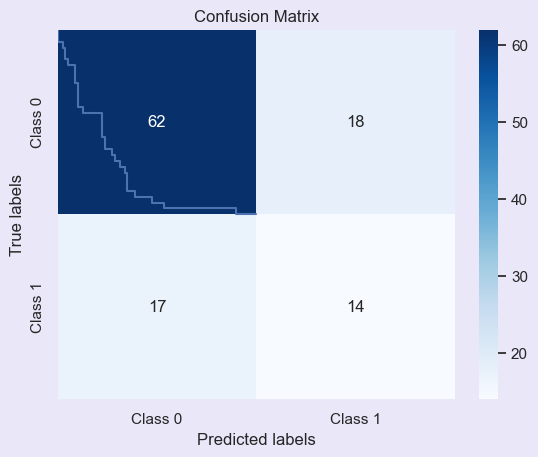

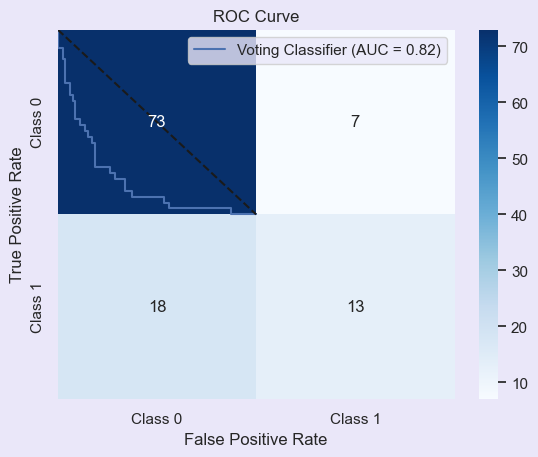

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.00            0.00            0.00            0.75           
Random Forest                  1.00            0.76            0.59            0.42            0.49            0.81           
Support Vector Machine         0.82            0.79            0.72            0.42            0.53            0.79           
Decision Tree                  1.00            0.77            0.58            0.58            0.58            0.71           
KNeighborsClassifier           0.84            0.77            0.60            0.48            0.54            0.74           
AdaBoost Classifier            0.86            0.78            0.63            0.55            0.59            0.82           
Gradient Boosting Classifier   0.94            0.77            0.59            0.52       

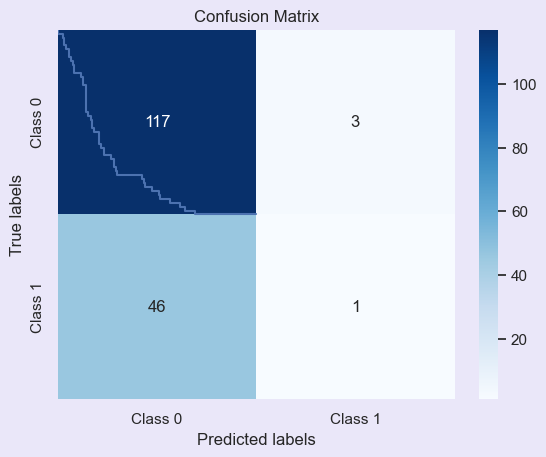

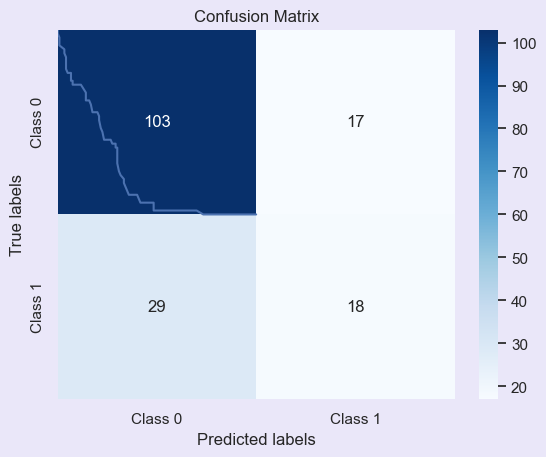

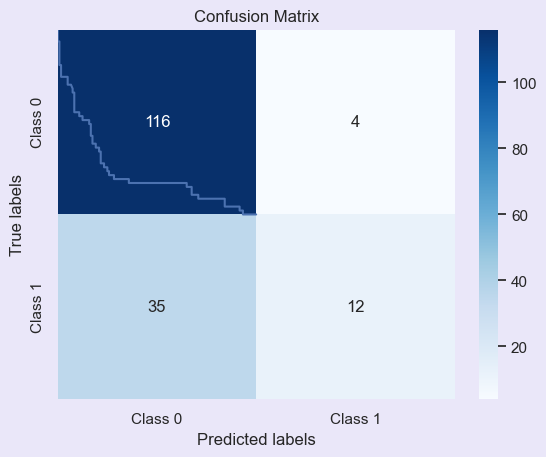

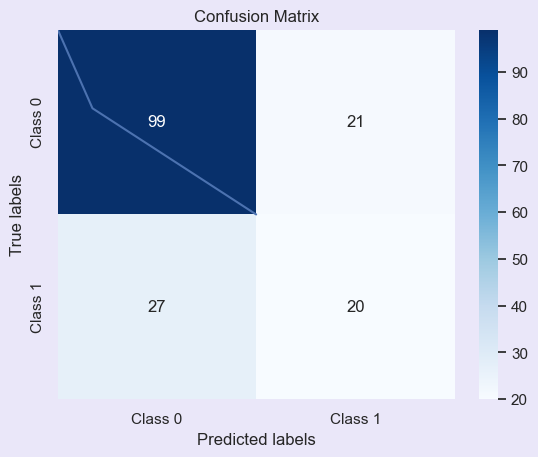

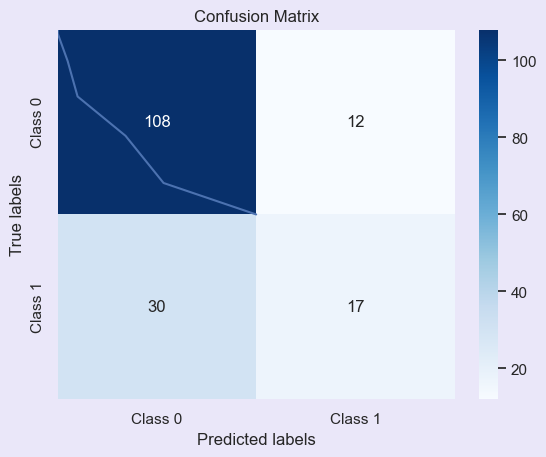

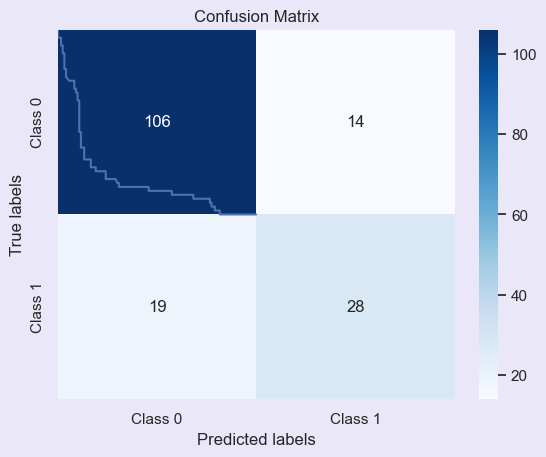

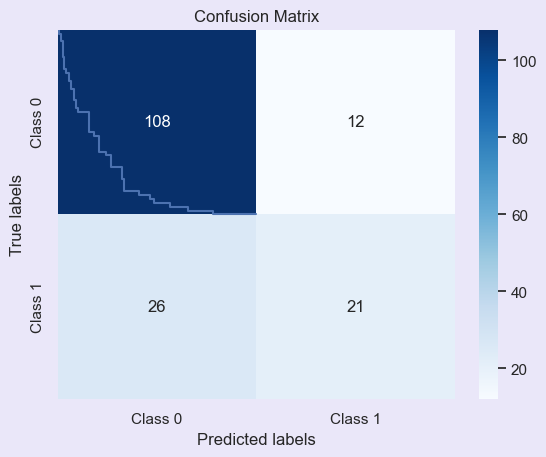

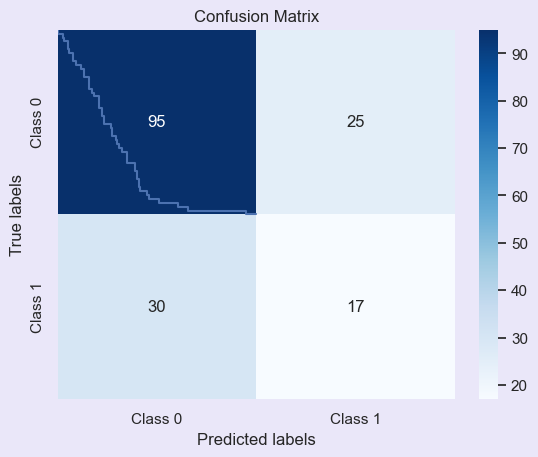

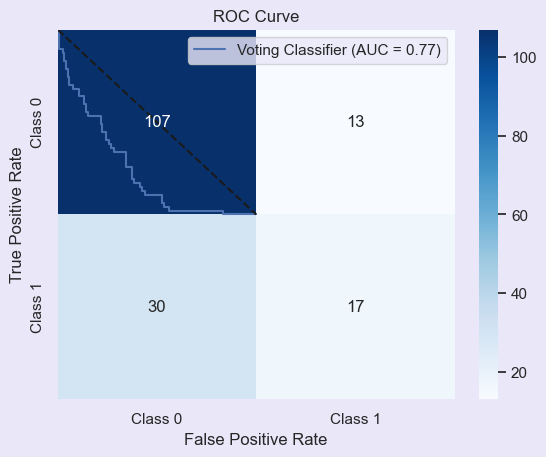

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.25            0.02            0.04            0.77           
Random Forest                  1.00            0.72            0.51            0.38            0.44            0.79           
Support Vector Machine         0.82            0.77            0.75            0.26            0.38            0.77           
Decision Tree                  1.00            0.71            0.49            0.43            0.45            0.63           
KNeighborsClassifier           0.84            0.75            0.59            0.36            0.45            0.69           
AdaBoost Classifier            0.86            0.80            0.67            0.60            0.63            0.81           
Gradient Boosting Classifier   0.95            0.77            0.64            0.45       

In [114]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes):
    plt.figure()
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, classes=['Class 0', 'Class 1'])
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, f1, roc_auc))
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    
    # Plot ROC curve
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics:\033[0m")
    print("{:<30} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f}".format(*result))
    print("\n")


Train size: 0.9, Test size: 0.1


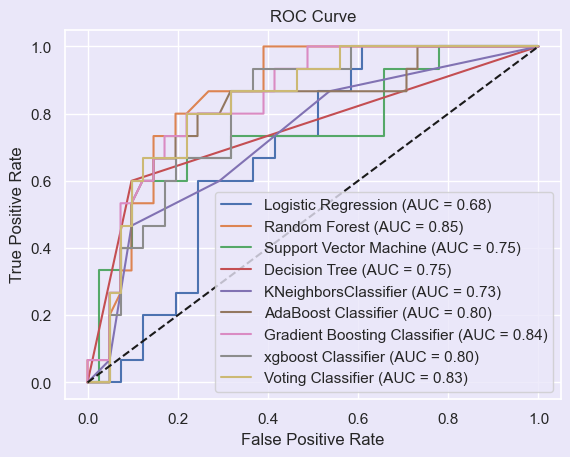

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.74            0.70            0.25            0.07            0.11            0.68           
Random Forest                  1.00            0.77            0.62            0.33            0.43            0.85           
Support Vector Machine         0.83            0.77            0.62            0.33            0.43            0.75           
Decision Tree                  1.00            0.82            0.69            0.60            0.64            0.75           
KNeighborsClassifier           0.83            0.79            0.64            0.47            0.54            0.73           
AdaBoost Classifier            0.85            0.79            0.64            0.47            0.54            0.80           
Gradient Boosting Classifier   0.91            0.79            0.67            0.40       

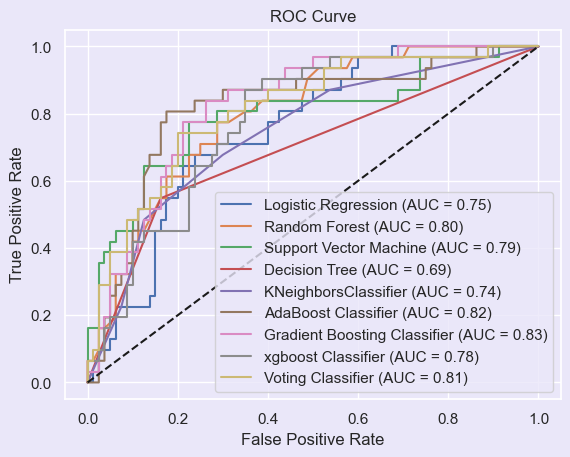

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.00            0.00            0.00            0.75           
Random Forest                  1.00            0.77            0.62            0.42            0.50            0.80           
Support Vector Machine         0.82            0.79            0.72            0.42            0.53            0.79           
Decision Tree                  1.00            0.76            0.57            0.55            0.56            0.69           
KNeighborsClassifier           0.84            0.77            0.60            0.48            0.54            0.74           
AdaBoost Classifier            0.86            0.78            0.63            0.55            0.59            0.82           
Gradient Boosting Classifier   0.94            0.77            0.59            0.52       

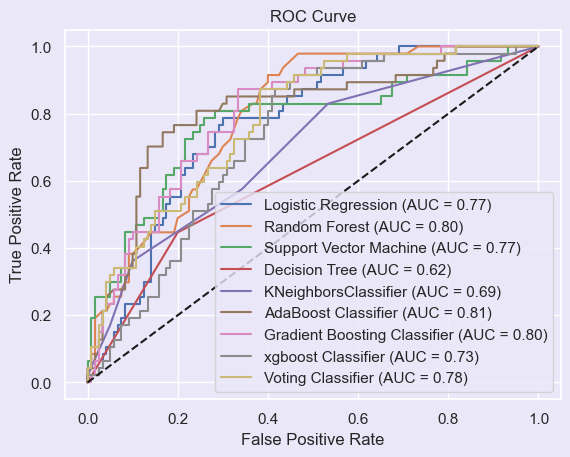

Performance metrics:
Classifier                     Train Accuracy  Test Accuracy   Precision       Recall          F1 Score        ROC AUC Score  
Logistic Regression            0.76            0.71            0.25            0.02            0.04            0.77           
Random Forest                  1.00            0.74            0.58            0.32            0.41            0.80           
Support Vector Machine         0.82            0.77            0.75            0.26            0.38            0.77           
Decision Tree                  1.00            0.70            0.47            0.45            0.46            0.62           
KNeighborsClassifier           0.84            0.75            0.59            0.36            0.45            0.69           
AdaBoost Classifier            0.86            0.80            0.67            0.60            0.63            0.81           
Gradient Boosting Classifier   0.95            0.77            0.64            0.45       

In [115]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Initialize classifiers
log_reg = LogisticRegression()
rf = RandomForestClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
ada = AdaBoostClassifier()
gb = GradientBoostingClassifier()
xgb = XGBClassifier()

# Voting Classifier
voting = VotingClassifier(estimators=[('lr', log_reg), ('rf', rf), ('svm', svm), ('dt', dt), ('knn', knn), ('ada', ada), ('gb', gb), ('xgb', xgb)], voting='soft')

# Combine classifiers
classifiers = {'Logistic Regression': log_reg, 'Random Forest': rf, 'Support Vector Machine': svm, 'Decision Tree': dt, 'KNeighborsClassifier': knn, 
               'AdaBoost Classifier': ada, 'Gradient Boosting Classifier': gb, 'xgboost Classifier': xgb, 
               'Voting Classifier': voting}

# Evaluate performance for each split
for train_size, test_size in splits:
    print(f"\033[1mTrain size: {train_size}, Test size: {test_size}\033[0m")
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)
    
    # Initialize lists to store performance metrics
    all_results = []
    
    # Train each classifier
    for name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Performance metrics
        accuracy_train = clf.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)
        
        # Append results to list
        all_results.append((name, accuracy_train, accuracy_test, precision, recall, f1, roc_auc))
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
    
    # Plot ROC curve
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()
    
    # Print results
    print("\033[1mPerformance metrics:\033[0m")
    print("{:<30} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format("Classifier", "Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1 Score", "ROC AUC Score"))
    for result in all_results:
        print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f} {:<15.2f}".format(*result))
    print("\n")


In [116]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define models
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "KNeighbors Classifier": KNeighborsClassifier(),
    "AdaBoost Classifier": AdaBoostClassifier(),
    "Gradient Boosting Classifier": GradientBoostingClassifier(),
    "XGBoost Classifier": XGBClassifier()
}

# Iterate over models
for model_name, model in models.items():
    print(f"Evaluating {model_name}...")
    for train_size, test_size in splits:
        print(f"Train size: {train_size * 100} %, Test size: {test_size * 100} %")
        # Splitting the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

        # Fitting the model to the training data
        model.fit(X_train, y_train)

        # Predicting on the test data
        y_pred = model.predict(X_test)
        y_pred_prob = model.predict_proba(X_test)[:, 1]

        # Measuring performance
        accuracy_train = model.score(X_train, y_train)   
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)

        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)

        # Computing ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

        # Plotting the ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve - ' + model_name)
        plt.legend(loc="lower right")
        plt.close()

        # Plotting confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.title("Confusion Matrix - " + model_name)
        plt.xlabel("Predicted labels")
        plt.ylabel("True labels")
        plt.close()

        # Printing performance metrics
        print("Training Accuracy:", "{:.2f} %".format(accuracy_train * 100))
        print("Testing Accuracy:", "{:.2f} %".format(accuracy_test * 100))
        print("Precision:", "{:.2f} %".format(precision * 100))
        print("Recall:", "{:.2f} %".format(recall * 100))
        print("F1 Score:", "{:.2f} %".format(f1 * 100))
        print("ROC AUC Score:", "{:.2f} %".format(roc_auc * 100))
        print("\n")


Evaluating Logistic Regression...
Train size: 90.0 %, Test size: 10.0 %
Training Accuracy: 74.35 %
Testing Accuracy: 69.64 %
Precision: 25.00 %
Recall: 6.67 %
F1 Score: 10.53 %
ROC AUC Score: 68.46 %


Train size: 80.0 %, Test size: 20.0 %
Training Accuracy: 75.68 %
Testing Accuracy: 71.17 %
Precision: 0.00 %
Recall: 0.00 %
F1 Score: 0.00 %
ROC AUC Score: 75.40 %


Train size: 70.0 %, Test size: 30.0 %
Training Accuracy: 76.03 %
Testing Accuracy: 70.66 %
Precision: 25.00 %
Recall: 2.13 %
F1 Score: 3.92 %
ROC AUC Score: 76.99 %


Evaluating Random Forest...
Train size: 90.0 %, Test size: 10.0 %
Training Accuracy: 100.00 %
Testing Accuracy: 76.79 %
Precision: 62.50 %
Recall: 33.33 %
F1 Score: 43.48 %
ROC AUC Score: 84.07 %


Train size: 80.0 %, Test size: 20.0 %
Training Accuracy: 100.00 %
Testing Accuracy: 75.68 %
Precision: 61.11 %
Recall: 35.48 %
F1 Score: 44.90 %
ROC AUC Score: 81.73 %


Train size: 70.0 %, Test size: 30.0 %
Training Accuracy: 100.00 %
Testing Accuracy: 73.65 %
Preci

# Machine Learning models (Support Vector Machine) splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

In [117]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Support Vector Classifier (SVC) model
    model = SVC(probability=True)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()


Train size: 90.0%, Test size: 10.0%
Training Accuracy: 82.57%
Testing Accuracy: 76.79%
Precision: 62.50%
Recall: 33.33%
F1 Score: 43.48%
ROC AUC Score: 74.80%


Train size: 80.0%, Test size: 20.0%
Training Accuracy: 82.43%
Testing Accuracy: 79.28%
Precision: 72.22%
Recall: 41.94%
F1 Score: 53.06%
ROC AUC Score: 79.46%


Train size: 70.0%, Test size: 30.0%
Training Accuracy: 82.22%
Testing Accuracy: 76.65%
Precision: 75.00%
Recall: 25.53%
F1 Score: 38.10%
ROC AUC Score: 77.27%




# Hyperparameter Tuning of Random Forest splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

In [118]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define hyperparameters grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

'''param_grid = {
    'n_estimators': [10, 20, 30],  # Adjust the number of trees in the forest
    'max_depth': [10, 20, 30],  # Adjust the maximum depth of each tree
    'min_samples_split': [2, 5, 10, 15, 20],  # Adjust the minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4, 6, 8]  # Adjust the minimum samples required in a leaf node
'''


for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Random Forest Classifier model
    rf_model = RandomForestClassifier()

    # Initialize GridSearchCV
    grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='roc_auc')

    # Fit the GridSearchCV to the training data
    grid_search.fit(X_train, y_train)

    # Get the best parameters found by GridSearchCV
    best_params = grid_search.best_params_

    # Initialize the Random Forest Classifier model with the best parameters
    model = RandomForestClassifier(**best_params)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    
    # Printing performance metrics
    print("Best Parameters (Hyperparameter Tuning of Random Forest):", best_params)
    print("Training Accuracy:", "{:.2f} %".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f} %".format(accuracy_test * 100))
    print("Precision:", "{:.2f} %".format(precision * 100))
    print("Recall:", "{:.2f} %".format(recall * 100))
    print("F1 Score:", "{:.2f} %".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f} %".format(roc_auc * 100))
    print("\n")


    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()


Train size: 90.0%, Test size: 10.0%
Best Parameters (Hyperparameter Tuning of Random Forest): {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Training Accuracy: 89.98 %
Testing Accuracy: 78.57 %
Precision: 66.67 %
Recall: 40.00 %
F1 Score: 50.00 %
ROC AUC Score: 84.23 %


Train size: 80.0%, Test size: 20.0%
Best Parameters (Hyperparameter Tuning of Random Forest): {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Training Accuracy: 92.57 %
Testing Accuracy: 79.28 %
Precision: 66.67 %
Recall: 51.61 %
F1 Score: 58.18 %
ROC AUC Score: 81.94 %


Train size: 70.0%, Test size: 30.0%
Best Parameters (Hyperparameter Tuning of Random Forest): {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 150}
Training Accuracy: 91.75 %
Testing Accuracy: 74.85 %
Precision: 59.26 %
Recall: 34.04 %
F1 Score: 43.24 %
ROC AUC Score: 80.85 %




# Hyperparameter Tuning Of Decision Tree Splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

In [119]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define hyperparameters grid for Decision Tree
param_grid = {
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Decision Tree Classifier model
    dt_model = DecisionTreeClassifier()

    # Initialize GridSearchCV
    grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='roc_auc')

    # Fit the GridSearchCV to the training data
    grid_search.fit(X_train, y_train)

    # Get the best parameters found by GridSearchCV
    best_params = grid_search.best_params_

    # Initialize the Decision Tree Classifier model with the best parameters
    model = DecisionTreeClassifier(**best_params)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("Best Parameters (Hyperparameter Tuning Of Decision Tree):", best_params)
    print("\nTraining Accuracy:", "{:.2f} %".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f} %".format(accuracy_test * 100))
    print("Precision:", "{:.2f} %".format(precision * 100))
    print("Recall:", "{:.2f} %".format(recall * 100))
    print("F1 Score:", "{:.2f} %".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f} %".format(roc_auc * 100))
    print("\n")


    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()

Train size: 90.0%, Test size: 10.0%
Best Parameters (Hyperparameter Tuning Of Decision Tree): {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}

Training Accuracy: 87.17 %
Testing Accuracy: 76.79 %
Precision: 57.14 %
Recall: 53.33 %
F1 Score: 55.17 %
ROC AUC Score: 78.54 %


Train size: 80.0%, Test size: 20.0%
Best Parameters (Hyperparameter Tuning Of Decision Tree): {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}

Training Accuracy: 86.94 %
Testing Accuracy: 73.87 %
Precision: 55.00 %
Recall: 35.48 %
F1 Score: 43.14 %
ROC AUC Score: 73.83 %


Train size: 70.0%, Test size: 30.0%
Best Parameters (Hyperparameter Tuning Of Decision Tree): {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5}

Training Accuracy: 87.37 %
Testing Accuracy: 69.46 %
Precision: 45.65 %
Recall: 44.68 %
F1 Score: 45.16 %
ROC AUC Score: 72.62 %




# Hyperparameter Tuning of KNN Splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

In [120]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Define the hyperparameters grid
    param_grid = {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'p': [1, 2]
    }

    # Initialize the KNeighbors Classifier model
    model = KNeighborsClassifier()

    # Hyperparameter tuning using GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1)

    # Fitting the model to the training data
    grid_search.fit(X_train, y_train)

    # Best parameters
    print("Best parameters:", grid_search.best_params_)

    # Predicting on the test data
    y_pred = grid_search.predict(X_test)
    y_pred_prob = grid_search.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = grid_search.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Plotting the ROC curve and saving as an image
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.savefig(f"ROC_Curve_{train_size}_{test_size}.png")
    plt.close()

    # Plotting confusion matrix and saving as an image
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.savefig(f"Confusion_Matrix_{train_size}_{test_size}.png")
    plt.close()

    # Printing performance metrics
    print("\033[1mHyperparameter Tuning of KNN:\033[0m")
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

Train size: 90.0%, Test size: 10.0%


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [0.73156097 0.73156097 0.73760912 0.74160114 0.75952913 0.75754515
 0.73958108 0.74158911 0.74348893 0.74353702 0.75557319 0.74758916
 0.73156097 0.73156097 0.73760912 0.74160114 0.75952913 0.75754515
 0.73958108 0.74158911 0.74348893 0.74353702 0.75557319 0.74758916
 0.73156097 0.73156097 0.73760912 0.74160114 0.75952913 0.75754515
 0.73958108 0.74158911 0.74348893 0.74353702 0.75557319 0.74758916
        nan 0.73156097        nan 0.74160114        nan 0.75754515
        nan 0.74158911        nan 0.74353702        nan 0.74758916]
  warnings.warn(


Best parameters: {'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
Hyperparameter Tuning of KNN:

Training Accuracy: 84.57%
Testing Accuracy: 76.79%
Precision: 62.50%
Recall: 33.33%
F1 Score: 43.48%
ROC AUC Score: 77.89%


Train size: 80.0%, Test size: 20.0%


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [0.73873874 0.73198198 0.7545045  0.75225225 0.77027027 0.76126126
 0.75225225 0.75675676 0.77477477 0.77477477 0.75675676 0.76126126
 0.73873874 0.73198198 0.7545045  0.75225225 0.77027027 0.76126126
 0.75225225 0.75675676 0.77477477 0.77477477 0.75675676 0.76126126
 0.73873874 0.73198198 0.7545045  0.75225225 0.77027027 0.76126126
 0.75225225 0.75675676 0.77477477 0.77477477 0.75675676 0.76126126
        nan 0.73198198        nan 0.75225225        nan 0.76126126
        nan 0.75675676        nan 0.77477477        nan 0.76126126]
  warnings.warn(


Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Hyperparameter Tuning of KNN:

Training Accuracy: 100.00%
Testing Accuracy: 74.77%
Precision: 55.56%
Recall: 48.39%
F1 Score: 51.72%
ROC AUC Score: 81.21%


Train size: 70.0%, Test size: 30.0%


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [0.75004969 0.74748559 0.75265355 0.74492149 0.77318625 0.77324588
 0.75263367 0.75265355 0.76026635 0.78350229 0.76036573 0.7706619
 0.75004969 0.74748559 0.75265355 0.74492149 0.77318625 0.77324588
 0.75263367 0.75265355 0.76026635 0.78350229 0.76036573 0.7706619
 0.75004969 0.74748559 0.75265355 0.74492149 0.77318625 0.77324588
 0.75263367 0.75265355 0.76026635 0.78350229 0.76036573 0.7706619
        nan 0.74748559        nan 0.74492149        nan 0.77324588
        nan 0.75265355        nan 0.78350229        nan 0.7706619 ]
  warnings.warn(


Best parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Hyperparameter Tuning of KNN:

Training Accuracy: 100.00%
Testing Accuracy: 74.25%
Precision: 56.67%
Recall: 36.17%
F1 Score: 44.16%
ROC AUC Score: 76.12%




In [121]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define hyperparameters grid for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Define hyperparameters grid for Decision Tree
dt_param_grid = {
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Define hyperparameters grid for KNN
knn_param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]
}

# Dictionary to store models and their hyperparameters grids
models = {
    "Random Forest": (RandomForestClassifier(), rf_param_grid),
    "Decision Tree": (DecisionTreeClassifier(), dt_param_grid),
    "KNN": (KNeighborsClassifier(), knn_param_grid)
}

# Iterate over models
for model_name, (model, param_grid) in models.items():
    print(f"Evaluating {model_name}...")
    for train_size, test_size in splits:
        print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
        # Splitting the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

        # Initialize GridSearchCV
        grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')

        # Fit the GridSearchCV to the training data
        grid_search.fit(X_train, y_train)

        # Get the best parameters found by GridSearchCV
        best_params = grid_search.best_params_

        # Initialize the model with the best parameters
        model = model.set_params(**best_params)

        # Fitting the model to the training data
        model.fit(X_train, y_train)

        # Predicting on the test data
        y_pred = model.predict(X_test)
        y_pred_prob = model.predict_proba(X_test)[:, 1]

        # Measuring performance
        accuracy_train = model.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)

        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)

        # Computing ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

        # Plotting the ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve - ' + model_name)
        plt.legend(loc="lower right")
        plt.close()

        # Plotting confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.title("Confusion Matrix - " + model_name)
        plt.xlabel("Predicted labels")
        plt.ylabel("True labels")
        plt.close()

        # Printing performance metrics
        print("Best Parameters:", best_params)
        print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
        print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
        print("Precision:", "{:.2f}%".format(precision * 100))
        print("Recall:", "{:.2f}%".format(recall * 100))
        print("F1 Score:", "{:.2f}%".format(f1 * 100))
        print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
        print("\n")


Evaluating Random Forest...
Train size: 90.0%, Test size: 10.0%
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 50}
Training Accuracy: 90.18%
Testing Accuracy: 73.21%
Precision: 50.00%
Recall: 33.33%
F1 Score: 40.00%
ROC AUC Score: 81.46%


Train size: 80.0%, Test size: 20.0%
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 150}
Training Accuracy: 90.54%
Testing Accuracy: 76.58%
Precision: 64.71%
Recall: 35.48%
F1 Score: 45.83%
ROC AUC Score: 82.18%


Train size: 70.0%, Test size: 30.0%
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}
Training Accuracy: 92.01%
Testing Accuracy: 76.65%
Precision: 66.67%
Recall: 34.04%
F1 Score: 45.07%
ROC AUC Score: 81.35%


Evaluating Decision Tree...
Train size: 90.0%, Test size: 10.0%
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}
Training Accuracy: 86.77%
Testin

C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\v

Best Parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
Training Accuracy: 82.77%
Testing Accuracy: 78.57%
Precision: 66.67%
Recall: 40.00%
F1 Score: 50.00%
ROC AUC Score: 82.52%


Train size: 80.0%, Test size: 20.0%


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\v

Best Parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
Training Accuracy: 82.66%
Testing Accuracy: 73.87%
Precision: 53.85%
Recall: 45.16%
F1 Score: 49.12%
ROC AUC Score: 82.24%


Train size: 70.0%, Test size: 30.0%


C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\v

Best Parameters: {'algorithm': 'auto', 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
Training Accuracy: 100.00%
Testing Accuracy: 73.65%
Precision: 54.84%
Recall: 36.17%
F1 Score: 43.59%
ROC AUC Score: 75.36%




C:\Users\User\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [0.71675305 0.72100464 0.72282168 0.7196198  0.74140553 0.74152066
 0.75639815 0.75312329 0.7659562  0.76504153 0.76462441 0.76675375
 0.71675305 0.72100464 0.72282168 0.7196198  0.74140553 0.74152066
 0.75639815 0.75312329 0.7659562  0.76504153 0.76462441 0.76675375
 0.71675305 0.72100464 0.72282168 0.7196198  0.74140553 0.74152066
 0.75639815 0.75312329 0.7659562  0.76504153 0.76462441 0.76675375
        nan 0.72100464        nan 0.7196198         nan 0.74152066
        nan 0.75312329        nan 0.76504153        nan 0.76675375]
  warnings.warn(


In [122]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define models
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "KNeighbors Classifier": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
    "AdaBoost Classifier": AdaBoostClassifier(),
    "Gradient Boosting Classifier": GradientBoostingClassifier(),
    "XGBoost Classifier": XGBClassifier()
}

# Iterate over models
for model_name, model in models.items():
    print(f"Evaluating {model_name}...")
    for train_size, test_size in splits:
        print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
        # Splitting the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

        # Fitting the model to the training data
        model.fit(X_train, y_train)

        # Predicting on the test data
        y_pred = model.predict(X_test)
        y_pred_prob = model.predict_proba(X_test)[:, 1]

        # Measuring performance
        accuracy_train = model.score(X_train, y_train)
        accuracy_test = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_prob)

        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)

        # Computing ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        
        # Printing performance metrics
        print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
        print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
        print("Precision:", "{:.2f}%".format(precision * 100))
        print("Recall:", "{:.2f}%".format(recall * 100))
        print("F1 Score:", "{:.2f}%".format(f1 * 100))
        print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
        print("\n")


        # Plotting the ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve - ' + model_name)
        plt.legend(loc="lower right")
        plt.close()

        # Plotting confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.title("Confusion Matrix - " + model_name)
        plt.xlabel("Predicted labels")
        plt.ylabel("True labels")
        plt.close()



Evaluating Logistic Regression...
Train size: 90.0%, Test size: 10.0%

Training Accuracy: 74.35%
Testing Accuracy: 69.64%
Precision: 25.00%
Recall: 6.67%
F1 Score: 10.53%
ROC AUC Score: 68.46%


Train size: 80.0%, Test size: 20.0%

Training Accuracy: 75.68%
Testing Accuracy: 71.17%
Precision: 0.00%
Recall: 0.00%
F1 Score: 0.00%
ROC AUC Score: 75.40%


Train size: 70.0%, Test size: 30.0%

Training Accuracy: 76.03%
Testing Accuracy: 70.66%
Precision: 25.00%
Recall: 2.13%
F1 Score: 3.92%
ROC AUC Score: 76.99%


Evaluating Random Forest...
Train size: 90.0%, Test size: 10.0%

Training Accuracy: 100.00%
Testing Accuracy: 78.57%
Precision: 71.43%
Recall: 33.33%
F1 Score: 45.45%
ROC AUC Score: 85.77%


Train size: 80.0%, Test size: 20.0%

Training Accuracy: 100.00%
Testing Accuracy: 72.97%
Precision: 52.38%
Recall: 35.48%
F1 Score: 42.31%
ROC AUC Score: 81.77%


Train size: 70.0%, Test size: 30.0%

Training Accuracy: 100.00%
Testing Accuracy: 72.46%
Precision: 51.61%
Recall: 34.04%
F1 Score: 

AttributeError: predict_proba is not available when  probability=False

# Logistic Regression

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Logistic Regression Classifier model
    model = LogisticRegression()
    
    # Initialize the Random Forest Classifier model
    model1 = RandomForestClassifier()


    # Fitting the model to the training data
    model.fit(X_train, y_train)
    model1.fit(X_train, y_train)
    
    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred1 = model1.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    y_pred_prob1 = model1.predict_proba(X_test)[:, 1]
    
    # Measuring performance LogisticRegression
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    
    # Measuring performance RandomForestClassifier
    accuracy_train1 = model1.score(X_train, y_train)
    accuracy_test1 = accuracy_score(y_test, y_pred1)
    precision1 = precision_score(y_test, y_pred1)
    recall1 = recall_score(y_test, y_pred1)
    f11 = f1_score(y_test, y_pred1)
    roc_auc1 = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Printing performance metrics RandomForestClassifier
    print("For Random Forest Classifier")
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train1 * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test1 * 100))
    print("Precision:", "{:.2f}%".format(precision1 * 100))
    print("Recall:", "{:.2f}%".format(recall1 * 100))
    print("F1 Score:", "{:.2f}%".format(f11 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc1 * 100))
    print("\n")

    
    
    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()



# Random Forest

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Random Forest Classifier model
    model = RandomForestClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()


# Hyperparameter Tuning of Random Forest

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define hyperparameters grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

'''param_grid = {
    'n_estimators': [10, 20, 30],  # Adjust the number of trees in the forest
    'max_depth': [10, 20, 30],  # Adjust the maximum depth of each tree
    'min_samples_split': [2, 5, 10, 15, 20],  # Adjust the minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4, 6, 8]  # Adjust the minimum samples required in a leaf node
'''


for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Random Forest Classifier model
    rf_model = RandomForestClassifier()

    # Initialize GridSearchCV
    grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='roc_auc')

    # Fit the GridSearchCV to the training data
    grid_search.fit(X_train, y_train)

    # Get the best parameters found by GridSearchCV
    best_params = grid_search.best_params_

    # Initialize the Random Forest Classifier model with the best parameters
    model = RandomForestClassifier(**best_params)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    
    # Printing performance metrics
    print("Best Parameters:", best_params)
    print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")


    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()


# Decision Tree

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Decision Tree Classifier model
    model = DecisionTreeClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")


    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()



# Hyperparameter Tuning Of Decision Tree

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

# Define hyperparameters grid for Decision Tree
param_grid = {
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Decision Tree Classifier model
    dt_model = DecisionTreeClassifier()

    # Initialize GridSearchCV
    grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='roc_auc')

    # Fit the GridSearchCV to the training data
    grid_search.fit(X_train, y_train)

    # Get the best parameters found by GridSearchCV
    best_params = grid_search.best_params_

    # Initialize the Decision Tree Classifier model with the best parameters
    model = DecisionTreeClassifier(**best_params)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("Best Parameters:", best_params)
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")


    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()

# KNeighborsClassifier Model

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the KNeighbors Classifier model
    model = KNeighborsClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve and saving as an image
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.savefig(f"ROC_Curve_{train_size}_{test_size}.png")
    plt.close()

    # Plotting confusion matrix and saving as an image
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.savefig(f"Confusion_Matrix_{train_size}_{test_size}.png")
    plt.close()



# Hyperparameter Tuning of KNN

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Define the hyperparameters grid
    param_grid = {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'p': [1, 2]
    }

    # Initialize the KNeighbors Classifier model
    model = KNeighborsClassifier()

    # Hyperparameter tuning using GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1)

    # Fitting the model to the training data
    grid_search.fit(X_train, y_train)

    # Best parameters
    print("Best parameters:", grid_search.best_params_)

    # Predicting on the test data
    y_pred = grid_search.predict(X_test)
    y_pred_prob = grid_search.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = grid_search.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Plotting the ROC curve and saving as an image
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.savefig(f"ROC_Curve_{train_size}_{test_size}.png")
    plt.close()

    # Plotting confusion matrix and saving as an image
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.savefig(f"Confusion_Matrix_{train_size}_{test_size}.png")
    plt.close()

    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

# Support Vector Classifier

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Support Vector Classifier (SVC) model
    model = SVC(probability=True)

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("Training Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()



# AdaBoost Classifier

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the AdaBoost Classifier model
    model = AdaBoostClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()



# Gradient Boosting Classifier

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the Gradient Boosting Classifier model
    model = GradientBoostingClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    
    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()


# xgboost Classifier

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

# Define train-test splits
splits = [(0.9, 0.1), (0.8, 0.2), (0.7, 0.3)]

for train_size, test_size in splits:
    print(f"Train size: {train_size * 100}%, Test size: {test_size * 100}%")
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, train_size=train_size, random_state=42)

    # Initialize the XGBoost Classifier model
    model = XGBClassifier()

    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Predicting on the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    # Measuring performance
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Computing ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    # Printing performance metrics
    print("\nTraining Accuracy:", "{:.2f}%".format(accuracy_train * 100))
    print("Testing Accuracy:", "{:.2f}%".format(accuracy_test * 100))
    print("Precision:", "{:.2f}%".format(precision * 100))
    print("Recall:", "{:.2f}%".format(recall * 100))
    print("F1 Score:", "{:.2f}%".format(f1 * 100))
    print("ROC AUC Score:", "{:.2f}%".format(roc_auc * 100))
    print("\n")

    
    # Plotting the ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.close()

    # Plotting confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.close()



In [ ]:
data['Outcome'].value_counts()